## Виды даты:
- stock_prices
- options --- вроде ±, спросить у Барса
- trades --- явно придётся агрегировать как-то
- secondary_stock_prices --- мб стоит посмотреть на всякие корреляции/дочки/whatever
- financials --- фундаменталка, «длинные» данные

## Посмотреть ещё
- [топ-3 на японском](https://www.kaggle.com/code/tatsuyafujii/lightgbm-baseline/notebook?scriptVersionId=98811727)
- [оверфит под ЛБ](https://www.kaggle.com/code/paulorzp/jpx-simple-overfitting-model-lb-3/notebook?scriptVersionId=94507587)

## Точно сделать
- минимальные объяснимые фичи
- timeseries-валидацию хорошую

## Попробовать
- трансформеры
- tabnet
- LAMA
- хуй знает чё ещё
- авторегрессионные (ебаные) модели?

In [1]:
import pandas as pd
import numpy as np
from itertools import chain
import seaborn as sns
import matplotlib.pyplot as plt
import re
from pathlib import Path, PosixPath

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 2000)
pd.set_option('display.max_colwidth', 1000)

camel_to_snake = re.compile(r'(?<!^)(?=[A-Z])')
data_root = Path('../data/')

In [3]:
from platform import python_version
python_version()

'3.7.12'

In [4]:
for path in data_root.glob("*/*.csv"):
    print(path)

../data/supplemental_files/stock_prices.csv
../data/supplemental_files/options.csv
../data/supplemental_files/trades.csv
../data/supplemental_files/secondary_stock_prices.csv
../data/supplemental_files/financials.csv
../data/data_specifications/stock_price_spec.csv
../data/data_specifications/trades_spec.csv
../data/data_specifications/stock_fin_spec.csv
../data/data_specifications/stock_list_spec.csv
../data/data_specifications/options_spec.csv
../data/train_files/secondary_stock_prices.csv
../data/train_files/trades.csv
../data/train_files/options.csv
../data/train_files/financials.csv
../data/train_files/stock_prices.csv
../data/example_test_files/financials.csv
../data/example_test_files/options.csv
../data/example_test_files/sample_submission.csv
../data/example_test_files/secondary_stock_prices.csv
../data/example_test_files/stock_prices.csv
../data/example_test_files/trades.csv


In [48]:
unused_cols = ['EffectiveDate', 'TradeDate', 'Close', 'IssuedShares', 'MarketCapitalization', 'Name', '33SectorCode', '17SectorCode', 'NewIndexSeriesSizeCode', 'Universe0']
stock_list = pd.read_csv(data_root / 'stock_list.csv').drop(unused_cols, axis=1)
stock_list.sample(5)

,SecuritiesCode,Section/Products,NewMarketSegment,33SectorName,17SectorName,NewIndexSeriesSize
278,1826,First Section (Domestic),Standard Market,Construction,CONSTRUCTION & MATERIALS,TOPIX Small 2
3632,8117,Second Section(Domestic),Standard Market,Wholesale Trade,COMMERCIAL & WHOLESALE TRADE,-
1051,3322,JASDAQ(Standard / Domestic),Standard Market,Wholesale Trade,COMMERCIAL & WHOLESALE TRADE,-
1415,3935,Mothers (Domestic),Growth Market,Information & Communication,"IT & SERVICES, OTHERS",-
801,2871,First Section (Domestic),Prime Market,Foods,FOODS,TOPIX Mid400


In [51]:
groupers = ['NewIndexSeriesSize', 'NewMarketSegment', 'Section/Products', '33SectorName', '17SectorName', 'Date']

# Options

## EDA

In [6]:
%%time

options = pd.read_csv(data_root / 'train_files/options.csv')
options = options.drop('Dividend', axis=1)
options = options.loc[options['TradingVolume'] != 0]
options['exercise_start'] = pd.to_datetime(options['ContractMonth'].astype(str), format='%Y%m')
options['expiry'] = options['exercise_start'] + pd.offsets.DateOffset(months=1, days=-1)
options['SpecialQuotationDay'] = pd.to_datetime(options['SpecialQuotationDay'].astype(str), format='%Y%m%d')
options['Date'] = pd.to_datetime(options['Date'].astype(str), format='%Y-%m-%d')
options['time_delta'] = options['exercise_start'] - options['Date']
options['settlement_to_theoretical'] = options['SettlementPrice'] / options['TheoreticalPrice']
options.sample(5)

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/IPython/core/magics/execution.py:1335: DtypeWarning: Columns (7,8,9,10) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code, glob, local_ns)


CPU times: user 4.46 s, sys: 625 ms, total: 5.08 s
Wall time: 5.07 s


,DateCode,Date,OptionsCode,WholeDayOpen,WholeDayHigh,WholeDayLow,WholeDayClose,NightSessionOpen,NightSessionHigh,NightSessionLow,NightSessionClose,DaySessionOpen,DaySessionHigh,DaySessionLow,DaySessionClose,TradingVolume,OpenInterest,TradingValue,ContractMonth,StrikePrice,WholeDayVolume,Putcall,LastTradingDay,SpecialQuotationDay,SettlementPrice,TheoreticalPrice,BaseVolatility,ImpliedVolatility,InterestRate,DividendRate,exercise_start,expiry,time_delta,settlement_to_theoretical
1940332,20200210_145023518,2020-02-10,145023518,440.0,440.0,260.0,280.0,440.0000,440.0000,315.0000,325.0000,285.0,395.0,260.0,280.0,510,3664,151695000,202002,23500.0,502,2,20200213,2020-02-14,280.0,280.0002,15.47065,17.3650,0.0427,0.0000,2020-02-01,2020-02-29,-9 days,0.999999
2299868,20200720_185095018,2020-07-20,185095018,17.0,17.0,14.0,14.0,17.0000,17.0000,17.0000,17.0000,15.0,15.0,14.0,14.0,34,6267,513000,202009,15000.0,32,1,20200910,2020-09-11,15.0,14.2477,17.89920,48.3096,0.0691,0.4096,2020-09-01,2020-09-30,43 days,1.052802
188150,20170515_182120018,2017-05-15,182120018,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0,0.0,100,5411,105000000,201712,20000.0,0,1,20171207,2017-12-08,1100.0,1097.7274,12.16990,15.9499,0.1282,1.4783,2017-12-01,2017-12-31,200 days,1.002070
975829,20180926_144034018,2018-09-26,144034018,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0,0.0,50,4328,42000000,201903,24000.0,0,2,20190307,2019-03-08,940.0,974.2692,14.31600,14.7413,0.1264,0.4826,2019-03-01,2019-03-31,156 days,0.964826
1764812,20191108_134129618,2019-11-08,134129618,6.0,10.0,5.0,8.0,6.0000,7.0000,5.0000,7.0000,6.0,10.0,6.0,8.0,216,693,1607000,201912,19625.0,211,1,20191212,2019-12-13,8.0,8.0001,12.98030,25.6315,0.0773,0.0000,2019-12-01,2019-12-31,23 days,0.999988


In [7]:
options = options.loc[options['WholeDayVolume'] != 0]

In [8]:
%%time

buckets = ['-30D', '0D', '30D', '60D', '150D', '9999D']
buckets = list(map(pd.Timedelta, buckets))
options.loc[:, 'bucket'] = pd.cut(options['time_delta'], buckets, labels=buckets[:-1])
options.loc[:, 'volume_weight'] = options.groupby(['Date', 'Putcall', 'bucket'])['WholeDayVolume'].apply(lambda x: x / x.sum())

CPU times: user 1.86 s, sys: 0 ns, total: 1.86 s
Wall time: 1.85 s


In [9]:
Nikkei225s = {1320, 2525, 1369, 1321, 1329}
index_selected = 1321
index_cols = ['Date', 'Close', 'Volume']


secondary_stock_prices = pd.read_csv('../data/train_files/secondary_stock_prices.csv')
nikkei_indices = secondary_stock_prices.loc[secondary_stock_prices['SecuritiesCode'].isin(Nikkei225s)]
index_data = nikkei_indices.loc[nikkei_indices['SecuritiesCode'] == index_selected]
index_data.loc[:, 'Date'] = pd.to_datetime(index_data.loc[:, 'Date'].astype(str), format='%Y-%m-%d')
index_data = index_data.loc[:, index_cols]
index_data.loc[('2021-01-20' <= index_data['Date']) & (index_data['Date'] <= '2021-01-25')]

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


,Date,Close,Volume
1941310,2021-01-20,29420.0,211592
1943340,2021-01-21,29630.0,201687
1945370,2021-01-22,29510.0,213937
1947400,2021-01-25,29680.0,197443


In [10]:
options[options['volume_weight'] > 0.3]

,DateCode,Date,OptionsCode,WholeDayOpen,WholeDayHigh,WholeDayLow,WholeDayClose,NightSessionOpen,NightSessionHigh,NightSessionLow,NightSessionClose,DaySessionOpen,DaySessionHigh,DaySessionLow,DaySessionClose,TradingVolume,OpenInterest,TradingValue,ContractMonth,StrikePrice,WholeDayVolume,Putcall,LastTradingDay,SpecialQuotationDay,SettlementPrice,TheoreticalPrice,BaseVolatility,ImpliedVolatility,InterestRate,DividendRate,exercise_start,expiry,time_delta,settlement_to_theoretical,bucket,volume_weight
291,20170104_132064518,2017-01-04,132064518,1.0,1.0,1.0,1.0,1.0000,1.0000,1.0000,1.0000,1.0,1.0,1.0,1.0,617,2751,617000,201706,4500.0,617,1,20170608,2017-06-09,1.0,1.0000,17.47360,71.4161,0.1064,1.7509,2017-06-01,2017-06-30,148 days,1.000000,60 days,0.728453
443,20170104_132122518,2017-01-04,132122518,185.0,185.0,185.0,185.0,0.0000,0.0000,0.0000,0.0000,185.0,185.0,185.0,185.0,1,4924,185000,201712,12500.0,1,1,20171207,2017-12-08,180.0,179.9093,17.47360,32.5042,0.1282,1.6769,2017-12-01,2017-12-31,331 days,1.000504,150 days,0.333333
514,20170104_133060018,2017-01-04,133060018,28.0,28.0,28.0,28.0,0.0000,0.0000,0.0000,0.0000,28.0,28.0,28.0,28.0,2,2,56000,201806,10000.0,2,1,20180607,2018-06-08,160.0,156.7514,17.47360,35.5333,0.1282,1.7157,2018-06-01,2018-06-30,513 days,1.020725,150 days,0.666667
1984,20170104_192068018,2017-01-04,192068018,2000.0,2000.0,2000.0,2000.0,0.0000,0.0000,0.0000,0.0000,2000.0,2000.0,2000.0,2000.0,70,9451,140000000,201706,18000.0,70,2,20170608,2017-06-09,2000.0,2000.0000,17.47360,23.0781,0.1064,1.7509,2017-06-01,2017-06-30,148 days,1.000000,60 days,0.625000
2029,20170104_192124518,2017-01-04,192124518,165.0,165.0,165.0,165.0,0.0000,0.0000,0.0000,0.0000,165.0,165.0,165.0,165.0,7,28,1155000,201712,24500.0,7,2,20171207,2017-12-08,180.0,179.6220,17.47360,18.9852,0.1282,1.6769,2017-12-01,2017-12-31,331 days,1.002104,150 days,0.777778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3562937,20211202_197180018,2021-12-02,197180018,10.0,10.0,10.0,10.0,10.0000,10.0000,10.0000,10.0000,0.0,0.0,0.0,0.0,10,30,100000,202206,40000.0,10,2,20220609,2022-06-10,5.0,4.8984,27.91395,19.2400,0.1264,0.0000,2022-06-01,2022-06-30,181 days,1.020741,150 days,0.526316
3563902,20211203_137037018,2021-12-03,137037018,1005.0,1080.0,930.0,930.0,1005.0000,1080.0000,950.0000,950.0000,940.0,940.0,930.0,930.0,32,4791,32900000,202203,27000.0,32,1,20220310,2022-03-11,900.0,907.3639,24.70275,23.4868,0.0573,0.0000,2022-03-01,2022-03-31,88 days,0.991884,60 days,0.347826
3564018,20211203_137066018,2021-12-03,137066018,105.0,105.0,105.0,105.0,0.0000,0.0000,0.0000,0.0000,105.0,105.0,105.0,105.0,10,1265,1050000,202206,16000.0,10,1,20220609,2022-06-10,95.0,93.9784,24.70275,42.8913,0.1264,0.0000,2022-06-01,2022-06-30,180 days,1.010871,150 days,0.312500
3565256,20211203_147021018,2021-12-03,147021018,85.0,105.0,83.0,105.0,85.0000,100.0000,83.0000,100.0000,100.0,105.0,100.0,105.0,18,636,1777000,202202,31000.0,18,2,20220209,2022-02-10,110.0,105.9922,24.70275,18.0801,0.0855,0.0000,2022-02-01,2022-02-28,60 days,1.037812,30 days,0.367347


In [11]:
columns_needed = ['Date', 'Putcall',
                  'WholeDayClose', 'TradingValue',
                  'TradingVolume', 'WholeDayVolume',
                  'ImpliedVolatility', 'BaseVolatility',
                  'TheoreticalPrice', 'SettlementPrice',
                  'settlement_to_theoretical', 'bucket',
                  'volume_weight', 'StrikePrice',
                  ]
options = options.loc[:, columns_needed]
columns_divided = ['WholeDayClose', 'TradingValue', 'ImpliedVolatility', 'BaseVolatility', 'StrikePrice', 'TheoreticalPrice', 'SettlementPrice']
options.loc[:, columns_divided] = options.loc[:, columns_divided].mul(options['volume_weight'], axis=0)
options

,Date,Putcall,WholeDayClose,TradingValue,TradingVolume,WholeDayVolume,ImpliedVolatility,BaseVolatility,TheoreticalPrice,SettlementPrice,settlement_to_theoretical,bucket,volume_weight,StrikePrice
0,2017-01-04,1,0.055474,3.992989e+02,6,6,0.002032,0.002019,0.055296,0.055474,1.003221,-30 days,0.000116,2.311426
18,2017-01-04,1,0.000039,7.704754e-02,2,2,0.003120,0.000673,0.000013,0.000039,2.931692,-30 days,0.000039,0.500809
25,2017-01-04,1,0.000039,7.704754e-02,2,2,0.002523,0.000673,0.000033,0.000039,1.171783,-30 days,0.000039,0.558595
26,2017-01-04,1,0.000212,2.330688e+00,11,11,0.013402,0.003702,0.000165,0.000212,1.283697,-30 days,0.000212,3.098756
27,2017-01-04,1,0.003024,4.747862e+02,157,157,0.180738,0.052842,0.001680,0.003024,1.800504,-30 days,0.003024,44.605709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3567286,2021-12-03,2,13.783784,2.756757e+05,20,20,4.993784,6.676419,19.003676,19.729730,1.038206,60 days,0.270270,8783.783784
3567302,2021-12-03,2,47.837838,2.870270e+05,6,6,1.654889,2.002926,60.459405,61.621622,1.019223,60 days,0.081081,2351.351351
3567303,2021-12-03,2,7.297297,7.297297e+03,1,1,0.271623,0.333821,8.730126,8.918919,1.021625,60 days,0.013514,395.270270
3567304,2021-12-03,2,27.567568,1.035135e+05,4,4,1.081816,1.335284,30.644935,31.351351,1.023052,60 days,0.054054,1594.594595


In [12]:
opts_active = options.loc[options['bucket'] == pd.Timedelta('-30D')]
puts_active = opts_active.loc[opts_active['Putcall'] == 1]
calls_active = opts_active.loc[opts_active['Putcall'] == 2]
puts_active = puts_active.groupby('Date').sum().resample('B').ffill()
calls_active = calls_active.groupby('Date').sum().resample('B').ffill()
puts_active['Putcall'] = 1
calls_active['Putcall'] = 2
opts_active = pd.concat([puts_active, calls_active]).reset_index()
opts_active['bucket'] = pd.Timedelta('-29D')

opts_active['bucket'] = pd.cut(opts_active['bucket'], buckets, labels=buckets[:-1])

opts_inactive = options.loc[options['bucket'] != pd.Timedelta('-30D')]
opts_inactive = opts_inactive.groupby(['Date', 'Putcall', 'bucket']).sum()
opts_inactive = opts_inactive.reset_index().dropna()
opts_aggregated = pd.concat([opts_inactive, opts_active])

merged_options = index_data.merge(opts_aggregated, on='Date')
merged_options

,Date,Close,Volume,Putcall,bucket,WholeDayClose,TradingValue,TradingVolume,WholeDayVolume,ImpliedVolatility,BaseVolatility,TheoreticalPrice,SettlementPrice,settlement_to_theoretical,volume_weight,StrikePrice
0,2017-01-04,20080.0,749647,1,-30 days,0.000000,0.000000e+00,0,0,0.000000,0.00000,0.000000,0.000000,0.000000,0.0,0.000000
1,2017-01-04,20080.0,749647,1,0 days,79.361959,6.257550e+07,15937,12355,29.693491,17.47360,79.420948,79.543909,56.662960,1.0,16663.800081
2,2017-01-04,20080.0,749647,1,30 days,128.589460,3.737830e+07,6479,2979,30.934998,17.47360,127.714251,128.663310,49.372998,1.0,15756.587781
3,2017-01-04,20080.0,749647,1,60 days,35.173554,3.115532e+06,1148,847,61.389707,17.47360,34.605580,34.781582,12.255550,1.0,6913.813459
4,2017-01-04,20080.0,749647,1,150 days,80.333333,9.900000e+04,3,3,34.523600,17.47360,164.470700,166.666667,2.021229,1.0,10833.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14342,2021-12-03,28915.0,265306,2,30 days,112.918367,3.009041e+06,199,49,18.756229,24.70275,130.937961,134.734694,13.516922,1.0,31270.408163
14343,2021-12-03,28915.0,265306,2,60 days,294.202703,7.185270e+06,894,74,19.082042,24.70275,352.880986,359.608108,19.377353,1.0,30922.297297
14344,2021-12-03,28915.0,265306,2,150 days,940.000000,9.544000e+07,101,1,20.086400,24.70275,1041.337500,1095.000000,1.051532,1.0,29000.000000
14345,2021-12-03,28915.0,265306,1,-30 days,89.575050,4.153412e+08,49693,37788,37.460312,24.70275,89.334376,89.299592,65.454479,1.0,25870.762544


In [13]:
merged_options['estimated_price'] = merged_options['SettlementPrice'] + merged_options['Close'] + merged_options['WholeDayClose']
merged_options.loc[:, 'price_to_opt'] = merged_options['estimated_price'] / merged_options['Close']
merged_options = merged_options.groupby(['Date', 'Putcall', 'bucket']).mean()
merged_options = merged_options.reset_index()

In [14]:
merged_options

,Date,Putcall,bucket,Close,Volume,WholeDayClose,TradingValue,TradingVolume,WholeDayVolume,ImpliedVolatility,BaseVolatility,TheoreticalPrice,SettlementPrice,settlement_to_theoretical,volume_weight,StrikePrice,estimated_price,price_to_opt
0,2017-01-04,1,-30 days,20080.0,749647.0,13.192994,6.313971e+07,30579.0,25958.0,13.929076,8.736800,13.189266,13.192994,25.352215,0.5,9021.387915,20106.385989,1.001314
1,2017-01-04,1,0 days,20080.0,749647.0,79.361959,6.257550e+07,15937.0,12355.0,29.693491,17.473600,79.420948,79.543909,56.662960,1.0,16663.800081,20238.905868,1.007914
2,2017-01-04,1,30 days,20080.0,749647.0,128.589460,3.737830e+07,6479.0,2979.0,30.934998,17.473600,127.714251,128.663310,49.372998,1.0,15756.587781,20337.252769,1.012811
3,2017-01-04,1,60 days,20080.0,749647.0,35.173554,3.115532e+06,1148.0,847.0,61.389707,17.473600,34.605580,34.781582,12.255550,1.0,6913.813459,20149.955136,1.003484
4,2017-01-04,1,150 days,20080.0,749647.0,80.333333,9.900000e+04,3.0,3.0,34.523600,17.473600,164.470700,166.666667,2.021229,1.0,10833.333333,20327.000000,1.012301
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12015,2021-12-03,2,-30 days,28915.0,265306.0,72.219195,1.075311e+08,14945.0,12157.0,11.835016,12.351375,72.614451,72.867443,25.271186,0.5,14479.690199,29060.086637,1.005018
12016,2021-12-03,2,0 days,28915.0,265306.0,248.937048,1.156475e+08,7244.0,3320.0,19.681271,24.702750,251.501814,252.850301,47.319377,1.0,30008.170181,29416.787349,1.017354
12017,2021-12-03,2,30 days,28915.0,265306.0,112.918367,3.009041e+06,199.0,49.0,18.756229,24.702750,130.937961,134.734694,13.516922,1.0,31270.408163,29162.653061,1.008565
12018,2021-12-03,2,60 days,28915.0,265306.0,294.202703,7.185270e+06,894.0,74.0,19.082042,24.702750,352.880986,359.608108,19.377353,1.0,30922.297297,29568.810811,1.022611


In [15]:
puts = merged_options[merged_options['Putcall'] == 1]
calls = merged_options[merged_options['Putcall'] == 2]

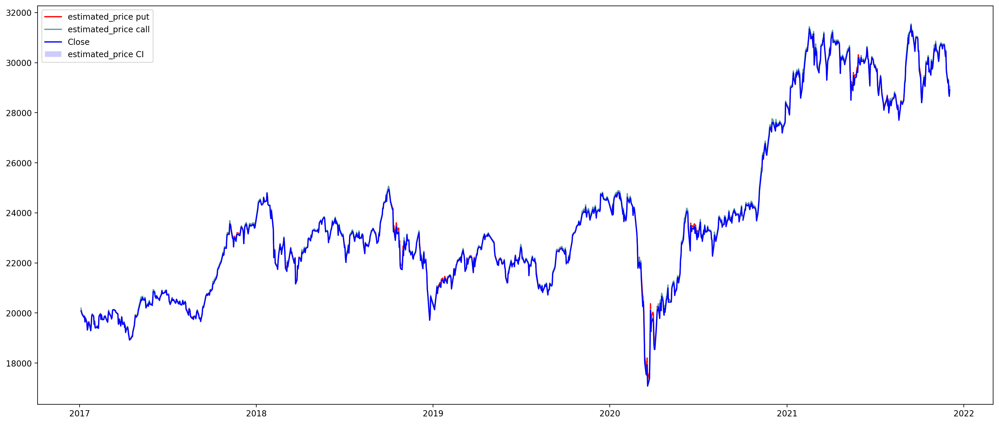

In [16]:
from matplotlib import pyplot as plt

delta = '-30D'

puts_plot = puts.loc[puts['bucket'] == pd.Timedelta(delta)]
calls_plot = calls.loc[calls['bucket'] == pd.Timedelta(delta)]


plt.figure(figsize=(21, 9), dpi=200)

plt.plot(puts_plot['Date'], puts_plot['estimated_price'], label='estimated_price put', color='red')
plt.plot(calls_plot['Date'], calls_plot['estimated_price'], label='estimated_price call', color='cadetblue')

plt.plot(calls_plot['Date'], calls_plot['Close'], label='Close', color='blue')

plt.fill_between(puts_plot['Date'],
                 puts_plot['estimated_price'],
                 calls_plot['estimated_price'],
                 facecolor='blue',
                 alpha=0.2,
                 interpolate=True,
                 label='estimated_price CI',
                 )
# plt.fill_between(puts['Date'],
#                  puts['estimated_price_2'],
#                  calls['estimated_price_2'],
#                  facecolor='green',
#                  alpha=0.2,
#                  label='estimated_price_2 CI',
#                  )

plt.legend()

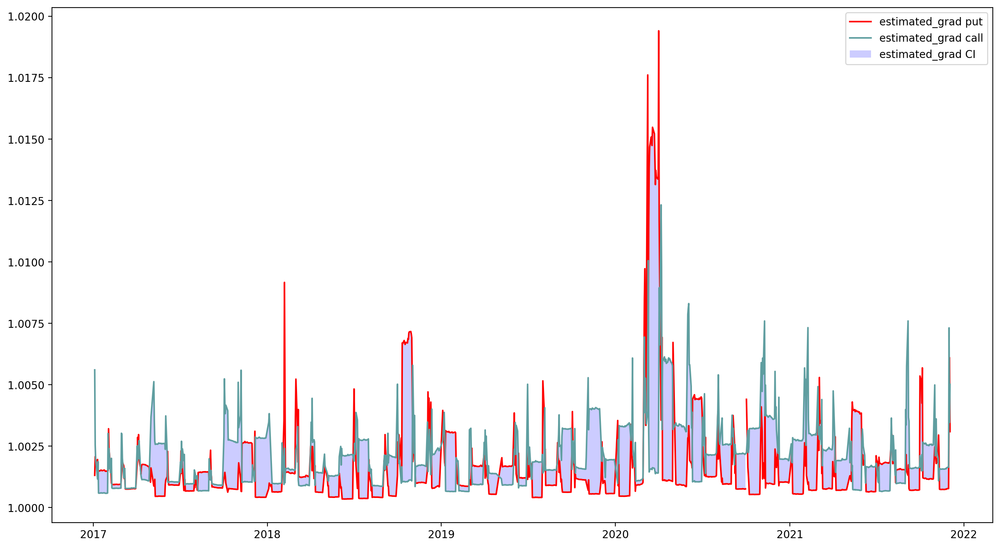

In [17]:
puts_plot = puts.loc[puts['bucket'] == pd.Timedelta(delta)]
calls_plot = calls.loc[calls['bucket'] == pd.Timedelta(delta)]


plt.figure(figsize=(16, 9), dpi=200)

plt.plot(puts_plot['Date'], puts_plot['price_to_opt'], label='estimated_grad put', color='red')
plt.plot(calls_plot['Date'], calls_plot['price_to_opt'], label='estimated_grad call', color='cadetblue')

plt.fill_between(puts_plot['Date'],
                 puts_plot['price_to_opt'],
                 calls_plot['price_to_opt'],
                 facecolor='blue',
                 alpha=0.2,
                 interpolate=True,
                 label='estimated_grad CI',
                 )
plt.legend()

In [18]:
merged_options.columns

Index(['Date', 'Putcall', 'bucket', 'Close', 'Volume', 'WholeDayClose', 'TradingValue', 'TradingVolume', 'WholeDayVolume', 'ImpliedVolatility', 'BaseVolatility', 'TheoreticalPrice', 'SettlementPrice', 'settlement_to_theoretical', 'volume_weight', 'StrikePrice', 'estimated_price', 'price_to_opt'], dtype='object')

In [19]:
merged_options['volume_share'] = merged_options.groupby(['Date', 'bucket'])['TradingVolume'].apply(lambda x: x / x.sum())

We're gonna use the following columns:
- ImpliedVolatility
- BaseVolatility
- settlement_to_theoretical
- estimated_price
- price_to_opt

In [20]:
selected_columns = [
    'ImpliedVolatility',
    'BaseVolatility',
    'settlement_to_theoretical',
    'estimated_price',
    'price_to_opt',
    'volume_share',
    'Close',
]

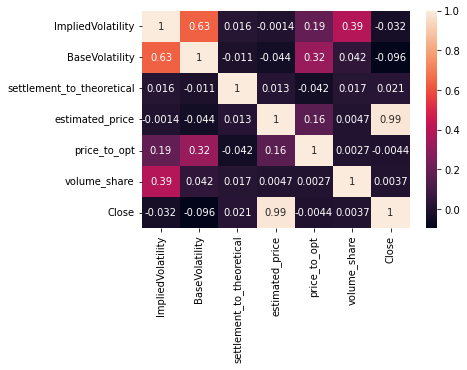

In [21]:
corrMatrix = merged_options[selected_columns].corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

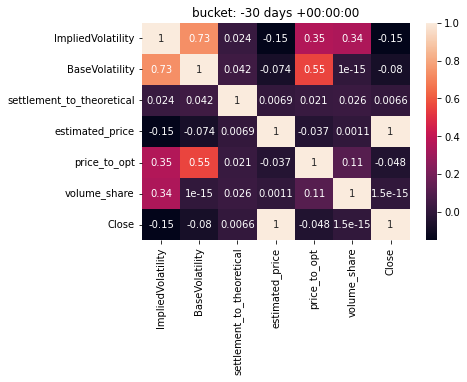

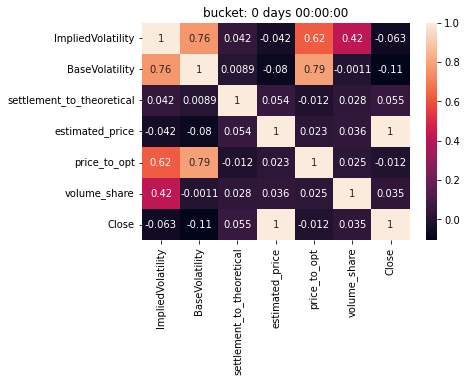

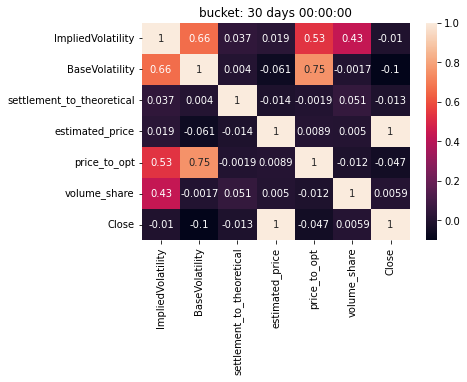

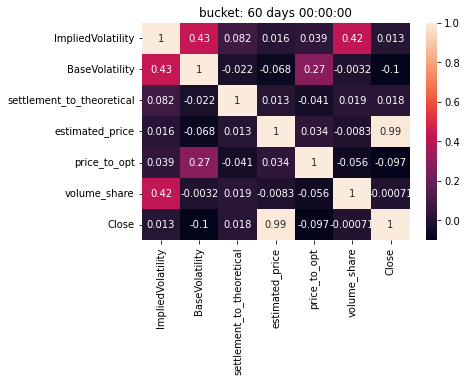

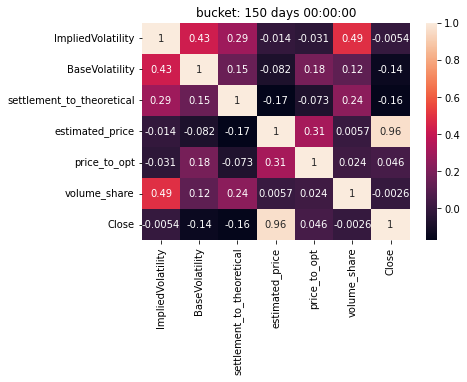

In [22]:
for bucket in buckets[:-1]:
    corrMatrix = merged_options.loc[merged_options['bucket'] == pd.Timedelta(bucket), selected_columns].corr()
    sns.heatmap(corrMatrix, annot=True)
    plt.title(f'bucket: {bucket}')
    plt.show()

In [23]:
merged_options = merged_options.rename(columns=lambda x: camel_to_snake.sub('_', x).lower())
merged_options = merged_options.set_index('date')
merged_options = merged_options[merged_options['bucket'] < pd.Timedelta(days=60)]

puts = merged_options[merged_options['putcall'] == 1].drop('putcall', axis=1)
calls = merged_options[merged_options['putcall'] == 2].drop('putcall', axis=1)
puts

,bucket,close,volume,whole_day_close,trading_value,trading_volume,whole_day_volume,implied_volatility,base_volatility,theoretical_price,settlement_price,settlement_to_theoretical,volume_weight,strike_price,estimated_price,price_to_opt,volume_share
date,,,,,,,,,,,,,,,,,
2017-01-04,-30 days,20080.0,749647.0,13.192994,6.313971e+07,30579.0,25958.0,13.929076,8.736800,13.189266,13.192994,25.352215,0.5,9021.387915,20106.385989,1.001314,0.540857
2017-01-04,0 days,20080.0,749647.0,79.361959,6.257550e+07,15937.0,12355.0,29.693491,17.473600,79.420948,79.543909,56.662960,1.0,16663.800081,20238.905868,1.007914,0.587496
2017-01-04,30 days,20080.0,749647.0,128.589460,3.737830e+07,6479.0,2979.0,30.934998,17.473600,127.714251,128.663310,49.372998,1.0,15756.587781,20337.252769,1.012811,0.652402
2017-01-05,-30 days,20020.0,679991.0,20.765756,7.542856e+07,21658.5,19580.0,11.633372,7.910825,20.768948,20.785802,19.748644,0.5,9254.010789,20061.551558,1.002076,0.525896
2017-01-05,0 days,20020.0,679991.0,73.703582,7.765404e+07,18574.0,11305.0,29.054806,15.821650,73.557093,74.052278,50.353140,1.0,16742.459089,20167.755860,1.007380,0.674780
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-02,0 days,28655.0,275522.0,170.787093,8.193212e+07,11650.0,5439.0,40.449591,27.913950,174.176032,174.580254,47.961208,1.0,22354.247104,29000.367347,1.012053,0.598387
2021-12-02,30 days,28655.0,275522.0,0.000000,0.000000e+00,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,28655.000000,1.000000,NaN
2021-12-03,-30 days,28915.0,265306.0,44.787525,2.076706e+08,24846.5,18894.0,18.730156,12.351375,44.667188,44.649796,32.727239,0.5,12935.381272,29004.437321,1.003093,0.624417


In [24]:
puts_pivoted = puts.pivot(columns='bucket')
puts_pivoted.columns = ['{}_{}d'.format(stat, bucket.days) for stat, bucket in puts_pivoted.columns]
puts_pivoted

,close_-30d,close_0d,close_30d,volume_-30d,volume_0d,volume_30d,whole_day_close_-30d,whole_day_close_0d,whole_day_close_30d,trading_value_-30d,trading_value_0d,trading_value_30d,trading_volume_-30d,trading_volume_0d,trading_volume_30d,whole_day_volume_-30d,whole_day_volume_0d,whole_day_volume_30d,implied_volatility_-30d,implied_volatility_0d,implied_volatility_30d,base_volatility_-30d,base_volatility_0d,base_volatility_30d,theoretical_price_-30d,theoretical_price_0d,theoretical_price_30d,settlement_price_-30d,settlement_price_0d,settlement_price_30d,settlement_to_theoretical_-30d,settlement_to_theoretical_0d,settlement_to_theoretical_30d,volume_weight_-30d,volume_weight_0d,volume_weight_30d,strike_price_-30d,strike_price_0d,strike_price_30d,estimated_price_-30d,estimated_price_0d,estimated_price_30d,price_to_opt_-30d,price_to_opt_0d,price_to_opt_30d,volume_share_-30d,volume_share_0d,volume_share_30d
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-01-04,20080.0,20080.0,20080.0,749647.0,749647.0,749647.0,13.192994,79.361959,128.589460,6.313971e+07,6.257550e+07,3.737830e+07,30579.0,15937.0,6479.0,25958.0,12355.0,2979.0,13.929076,29.693491,30.934998,8.736800,17.47360,17.47360,13.189266,79.420948,127.714251,13.192994,79.543909,128.663310,25.352215,56.662960,49.372998,0.5,1.0,1.0,9021.387915,16663.800081,15756.587781,20106.385989,20238.905868,20337.252769,1.001314,1.007914,1.012811,0.540857,0.587496,0.652402
2017-01-05,20020.0,20020.0,20020.0,679991.0,679991.0,679991.0,20.765756,73.703582,109.120455,7.542856e+07,7.765404e+07,6.592004e+07,21658.5,18574.0,13995.0,19580.0,11305.0,4400.0,11.633372,29.054806,31.435189,7.910825,15.82165,15.82165,20.768948,73.557093,108.378867,20.785802,74.052278,109.499545,19.748644,50.353140,44.387853,0.5,1.0,1.0,9254.010789,16742.459089,15454.090909,20061.551558,20167.755860,20238.620000,1.002076,1.007380,1.010920,0.525896,0.674780,0.432933
2017-01-06,19950.0,19950.0,19950.0,474555.0,474555.0,474555.0,18.695765,68.571586,28.034939,5.810631e+07,3.878919e+07,3.582045e+07,21522.5,14458.0,13904.0,19955.0,11818.0,10504.0,12.002055,28.877626,34.642891,7.503000,15.00600,15.00600,18.693786,68.412585,27.989731,18.688499,68.933237,28.244288,31.866402,53.252067,48.029714,0.5,1.0,1.0,9218.812641,16668.767981,14350.378427,19987.384265,20087.504823,20006.279227,1.001874,1.006892,1.002821,0.521151,0.620063,0.772616
2017-01-10,19820.0,19820.0,19820.0,388580.0,388580.0,388580.0,19.352743,87.150214,90.981930,8.941008e+07,6.943813e+07,3.516522e+07,29910.5,16990.0,7961.0,26589.5,10991.0,3099.0,14.890085,27.192740,34.007813,9.137900,18.27580,18.27580,19.447648,87.122543,91.101966,19.450573,87.368301,92.287512,18.195464,52.579724,46.154222,0.5,1.0,1.0,9257.732141,17117.857793,14699.217490,19858.803315,19994.518515,20003.269442,1.001958,1.008805,1.009247,0.511387,0.563012,0.848269
2017-01-11,19860.0,19860.0,19860.0,351023.0,351023.0,351023.0,14.046086,97.205021,83.128680,4.848401e+07,8.713095e+07,9.005866e+06,19298.5,11695.0,3268.0,16805.5,5258.0,1189.0,17.017223,26.348197,32.526776,8.960450,17.92090,17.92090,14.049255,97.065459,82.518881,14.049805,97.218905,83.220353,20.587824,51.381473,45.662298,0.5,1.0,1.0,9288.999509,17285.850133,15082.422204,19888.095891,20054.423925,20026.349033,1.001415,1.009790,1.008376,0.530944,0.546164,0.517498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-29,29190.0,29190.0,29190.0,468602.0,468602.0,468602.0,11.505380,156.757258,231.046746,4.925540e+07,4.461176e+08,1.571831e+08,19457.0,115327.0,21521.0,16356.0,91661.0,10696.0,14.553218,47.789435,42.837529,8.735875,28.08885,28.08885,11.432545,157.435638,233.397766,11.205720,158.211453,236.972887,0.000000,96.448934,52.024814,0.5,1.0,1.0,14208.094507,25073.508635,22593.598074,29212.711100,29504.968711,29658.019634,1.000778,1.010790,1.016034,0.602291,0.684803,0.715459
2021-11-30,29300.0,

In [25]:
calls_pivoted = calls.pivot(columns='bucket')
calls_pivoted.columns = ['{}_{}d'.format(stat, bucket.days) for stat, bucket in calls_pivoted.columns]
calls_pivoted

,close_-30d,close_0d,close_30d,volume_-30d,volume_0d,volume_30d,whole_day_close_-30d,whole_day_close_0d,whole_day_close_30d,trading_value_-30d,trading_value_0d,trading_value_30d,trading_volume_-30d,trading_volume_0d,trading_volume_30d,whole_day_volume_-30d,whole_day_volume_0d,whole_day_volume_30d,implied_volatility_-30d,implied_volatility_0d,implied_volatility_30d,base_volatility_-30d,base_volatility_0d,base_volatility_30d,theoretical_price_-30d,theoretical_price_0d,theoretical_price_30d,settlement_price_-30d,settlement_price_0d,settlement_price_30d,settlement_to_theoretical_-30d,settlement_to_theoretical_0d,settlement_to_theoretical_30d,volume_weight_-30d,volume_weight_0d,volume_weight_30d,strike_price_-30d,strike_price_0d,strike_price_30d,estimated_price_-30d,estimated_price_0d,estimated_price_30d,price_to_opt_-30d,price_to_opt_0d,price_to_opt_30d,volume_share_-30d,volume_share_0d,volume_share_30d
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-01-04,20080.0,20080.0,20080.0,749647.0,749647.0,749647.0,56.284925,153.008350,249.595745,1.463819e+08,1.312483e+08,6.856599e+07,25959.0,11190.0,3452.0,24334.5,7186.0,1222.0,9.542926,18.135483,18.113834,8.736800,17.47360,17.47360,56.297820,153.195062,257.760244,56.298948,153.209435,258.731588,14.979424,31.025467,29.577486,0.5,1.0,1.0,10039.366691,20735.423045,21115.691489,20192.583873,20386.217785,20588.327332,1.005607,1.015250,1.025315,0.459143,0.412504,0.347598
2017-01-05,20020.0,20020.0,20020.0,679991.0,679991.0,679991.0,25.505401,151.831583,629.105189,1.036070e+08,9.857221e+07,2.360234e+08,19525.5,8952.0,18331.0,16665.0,5712.0,713.0,8.301399,17.334940,18.531254,7.910825,15.82165,15.82165,25.484864,151.939264,629.961299,25.489274,152.191527,631.612903,15.991456,33.435330,34.798705,0.5,1.0,1.0,10070.870837,20654.893207,20506.486676,20070.994674,20324.023109,21280.718093,1.002547,1.015186,1.062973,0.474104,0.325220,0.567067
2017-01-06,19950.0,19950.0,19950.0,474555.0,474555.0,474555.0,19.591162,79.439779,165.775408,8.932917e+07,6.301075e+07,3.005630e+07,19775.5,8859.0,4092.0,18001.0,5621.0,797.0,7.924209,16.774861,17.328150,7.503000,15.00600,15.00600,19.589430,79.222332,167.366833,19.587967,79.413983,168.168130,16.591374,29.435412,29.250250,0.5,1.0,1.0,10021.611647,20829.011742,21243.569636,19989.179129,20108.853763,20283.943538,1.001964,1.007963,1.016739,0.478849,0.379937,0.227384
2017-01-10,19820.0,19820.0,19820.0,388580.0,388580.0,388580.0,11.507103,85.091021,213.733766,9.548570e+07,1.023405e+08,1.513760e+07,28578.5,13187.0,1424.0,24849.0,8965.0,924.0,10.789247,17.556538,17.619159,9.137900,18.27580,18.27580,11.502585,84.727366,209.100661,11.505091,84.820859,211.593074,15.297639,31.047775,34.859353,0.5,1.0,1.0,9949.244688,20652.732850,20726.055195,19843.012194,19989.911880,20245.326840,1.001161,1.008573,1.021459,0.488613,0.436988,0.151731
2017-01-11,19860.0,19860.0,19860.0,351023.0,351023.0,351023.0,18.620736,108.082586,248.523969,6.624622e+07,6.408625e+07,4.607962e+07,17049.0,9718.0,3047.0,13939.5,6018.0,897.0,11.944209,17.180921,17.499972,8.960450,17.92090,17.92090,18.613330,108.074016,245.756225,18.616342,108.289631,246.510591,13.486418,34.643880,29.443507,0.5,1.0,1.0,9899.413537,20512.400299,20358.416945,19897.237078,20076.372217,20355.034560,1.001875,1.010895,1.024926,0.469056,0.453836,0.482502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-29,29190.0,29190.0,29190.0,468602.0,468602.0,468602.0,23.901281,114.824975,185.568877,7.025561e+07,4.768479e+08,1.217742e+08,12848.0,53082.0,8559.0,11165.5,44965.0,5038.0,8.484730,24.275738,19.148303,8.735875,28.08885,28.08885,23.881868,114.688189,185.078422,24.238368,114.615234,182.502580,0.000000,55.112635,49.494946,0.5,1.0,1.0,14799.298061,29852.991215,30601.156213,29238.139649,29419.440209,29558.071457,1.001649,1.007860,1.012610,0.397709,0.315197,0.284541
2021-11-30,29300.0

In [26]:
options = pd.concat([calls_pivoted.add_prefix('calls_'), puts_pivoted.add_prefix('puts_')], axis=1)
options

,calls_close_-30d,calls_close_0d,calls_close_30d,calls_volume_-30d,calls_volume_0d,calls_volume_30d,calls_whole_day_close_-30d,calls_whole_day_close_0d,calls_whole_day_close_30d,calls_trading_value_-30d,calls_trading_value_0d,calls_trading_value_30d,calls_trading_volume_-30d,calls_trading_volume_0d,calls_trading_volume_30d,calls_whole_day_volume_-30d,calls_whole_day_volume_0d,calls_whole_day_volume_30d,calls_implied_volatility_-30d,calls_implied_volatility_0d,calls_implied_volatility_30d,calls_base_volatility_-30d,calls_base_volatility_0d,calls_base_volatility_30d,calls_theoretical_price_-30d,calls_theoretical_price_0d,calls_theoretical_price_30d,calls_settlement_price_-30d,calls_settlement_price_0d,calls_settlement_price_30d,calls_settlement_to_theoretical_-30d,calls_settlement_to_theoretical_0d,calls_settlement_to_theoretical_30d,calls_volume_weight_-30d,calls_volume_weight_0d,calls_volume_weight_30d,calls_strike_price_-30d,calls_strike_price_0d,calls_strike_price_30d,calls_estimated_price_-30d,calls_estimated_price_0d,calls_estimated_price_30d,calls_price_to_opt_-30d,calls_price_to_opt_0d,calls_price_to_opt_30d,calls_volume_share_-30d,calls_volume_share_0d,calls_volume_share_30d,puts_close_-30d,puts_close_0d,puts_close_30d,puts_volume_-30d,puts_volume_0d,puts_volume_30d,puts_whole_day_close_-30d,puts_whole_day_close_0d,puts_whole_day_close_30d,puts_trading_value_-30d,puts_trading_value_0d,puts_trading_value_30d,puts_trading_volume_-30d,puts_trading_volume_0d,puts_trading_volume_30d,puts_whole_day_volume_-30d,puts_whole_day_volume_0d,puts_whole_day_volume_30d,puts_implied_volatility_-30d,puts_implied_volatility_0d,puts_implied_volatility_30d,puts_base_volatility_-30d,puts_base_volatility_0d,puts_base_volatility_30d,puts_theoretical_price_-30d,puts_theoretical_price_0d,puts_theoretical_price_30d,puts_settlement_price_-30d,puts_settlement_price_0d,puts_settlement_price_30d,puts_settlement_to_theoretical_-30d,puts_settlement_to_theoretical_0d,puts_settlement_to_theoretical_30d,puts_volume_weight_-30d,puts_volume_weight_0d,puts_volume_weight_30d,puts_strike_price_-30d,puts_strike_price_0d,puts_strike_price_30d,puts_estimated_price_-30d,puts_estimated_price_0d,puts_estimated_price_30d,puts_price_to_opt_-30d,puts_price_to_opt_0d,puts_price_to_opt_30d,puts_volume_share_-30d,puts_volume_share_0d,puts_volume_share_30d
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-01-04,20080.0,20080.0,20080.0,749647.0,749647.0,749647.0,56.284925,153.008350,249.595745,1.463819e+08,1.312483e+08,6.856599e+07,25959.0,11190.0,3452.0,24334.5,7186.0,1222.0,9.542926,18.135483,18.113834,8.736800,17.47360,17.47360,56.297820,153.195062,257.760244,56.298948,153.209435,258.731588,14.979424,31.025467,29.577486,0.5,1.0,1.0,10039.366691,20735.423045,21115.691489,20192.583873,20386.217785,20588.327332,1.005607,1.015250,1.025315,0.459143,0.412504,0.347598,20080.0,20080.0,20080.0,749647.0,749647.0,749647.0,13.192994,79.361959,128.589460,6.313971e+07,6.257550e+07,3.737830e+07,30579.0,15937.0,6479.0,25958.0,12355.0,2979.0,13.929076,29.693491,30.934998,8.736800,17.47360,17.47360,13.189266,79.420948,127.714251,13.192994,79.543909,128.663310,25.352215,56.662960,49.372998,0.5,1.0,1.0,9021.387915,16663.800081,15756.587781,20106.385989,20238.905868,20337.252769,1.001314,1.007914,1.012811,0.540857,0.587496,0.652402
2017-01-05,20020.0,20020.0,20020.0,679991.0,679991.0,679991.0,25.505401,151.831583,629.105189,1.036070e+08,9.857221e+07,2.360234e+08,19525.5,8952.0,18331.0,16665.0,5712.0,713.0,8.301399,17.334940,18.531254,7.910825,15.82165,15.82165,25.484864,151.939264,629.961299,25.489274,152.191527,631.612903,15.991456,33.435330,34.798705,0.5,1.0,1.0,10070.870837,20654.893207,20506.486676,20070.994674,20324.023109,21280.718093,1.002547,1.015186,1.062973,0.474104,0.325220,0.567067,20020.0,20020.0,20020.0,679991.0,679991.0,679991.0,20.765756,73.703582,109.120455,7.542856e+07,7.765404e+07,6.592004e+07,21658.5,18574.0,13995.0

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/ipykernel/__main__.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  app.launch_new_instance()


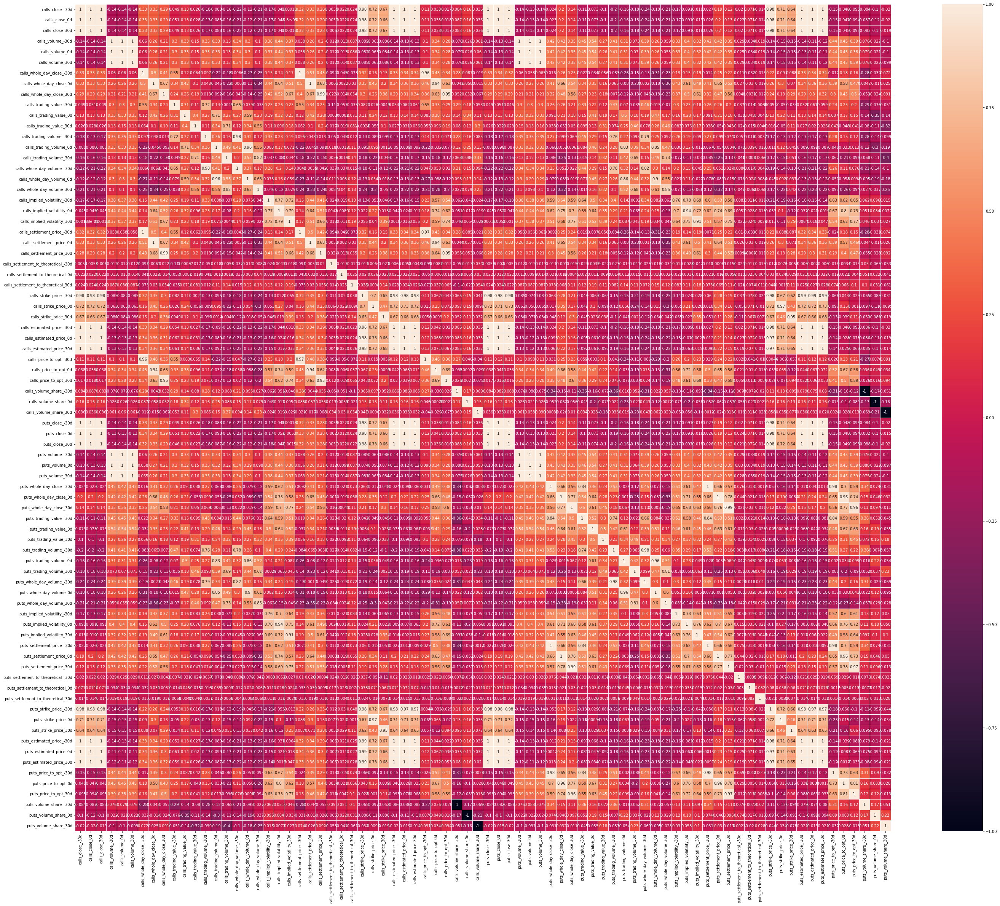

In [108]:
corrMatrix = options.corr()
fig, ax = plt.subplots(figsize = (48, 40))
sns.heatmap(corrMatrix, annot=True, linewidths=.5, ax=ax)
fig.show()

## Script

In [101]:
def preprocess_options(options: pd.DataFrame, index_data: pd.DataFrame):
    options = options.drop('Dividend', axis=1)
    options = options.loc[options['TradingVolume'] != 0]
    options['Date'] = pd.to_datetime(options['Date'].astype(str), format='%Y-%m-%d')
    options['exercise_start'] = pd.to_datetime(options['ContractMonth'].astype(str), format='%Y%m')
    options['time_delta'] = options['exercise_start'] - options['Date']
    options['settlement_to_theoretical'] = options['SettlementPrice'] / options['TheoreticalPrice']
    
    columns_needed = ['Date', 'Putcall',
                      'WholeDayClose', 'TradingValue',
                      'TradingVolume', 'WholeDayVolume',
                      'ImpliedVolatility', 'SettlementPrice',
                      'settlement_to_theoretical', 'StrikePrice',
                      'time_delta',
                      ]
    options = options.loc[:, columns_needed]
    
    buckets = ['-30D', '0D', '30D', '60D', '150D', '9999D']
    buckets = list(map(pd.Timedelta, buckets))
    options.loc[:, 'bucket'] = pd.cut(options['time_delta'], buckets, labels=buckets[:-1])
    options.loc[:, 'volume_weight'] = options.groupby(['Date', 'Putcall', 'bucket'])['WholeDayVolume'].apply(lambda x: x / x.sum())

    columns_divided = ['WholeDayClose', 'TradingValue', 'ImpliedVolatility', 'StrikePrice', 'SettlementPrice']
    options.loc[:, columns_divided] = options.loc[:, columns_divided].mul(options['volume_weight'], axis=0)
    options = options.drop(columns='volume_weight')


    opts_active = options.loc[options['bucket'] == pd.Timedelta('-30D')]
    
    puts_active = opts_active.loc[opts_active['Putcall'] == 1]
    puts_active = puts_active.groupby('Date').sum().resample('B').ffill()
    puts_active['Putcall'] = 1

    calls_active = opts_active.loc[opts_active['Putcall'] == 2]
    calls_active = calls_active.groupby('Date').sum().resample('B').ffill()
    calls_active['Putcall'] = 2
    
    opts_active = pd.concat([puts_active, calls_active]).reset_index()
    opts_active['bucket'] = pd.Timedelta('-29D')

    opts_active['bucket'] = pd.cut(opts_active['bucket'], buckets, labels=buckets[:-1])

    opts_inactive = options.loc[options['bucket'] != pd.Timedelta('-30D')]
    opts_inactive = opts_inactive.groupby(['Date', 'Putcall', 'bucket']).sum()
    opts_inactive = opts_inactive.reset_index().dropna()
    opts_aggregated = pd.concat([opts_inactive, opts_active])

    
    # index
    index_data.loc[:, 'Date'] = pd.to_datetime(index_data.loc[:, 'Date'].astype(str), format='%Y-%m-%d')
    merged_options = index_data.merge(opts_aggregated, on='Date')


    merged_options['estimated_price'] = merged_options['SettlementPrice'] + merged_options['Close'] + merged_options['WholeDayClose']
    merged_options.loc[:, 'price_to_opt'] = merged_options['estimated_price'] / merged_options['Close']
    merged_options = merged_options.groupby(['Date', 'Putcall', 'bucket']).mean()
    merged_options = merged_options.reset_index()


    merged_options['volume_share'] = merged_options.groupby(['Date', 'bucket'])['TradingVolume'].apply(lambda x: x / x.sum())


    merged_options = merged_options.rename(columns=lambda x: camel_to_snake.sub('_', x).lower())
    merged_options = merged_options.set_index('date')
    merged_options = merged_options[merged_options['bucket'] < pd.Timedelta(days=60)]
    merged_options = merged_options.sort_values(by=['date', 'bucket'])
    numerical_cols = merged_options.select_dtypes(include=np.number).columns.difference(['putcall'])

    puts = merged_options[merged_options['putcall'] == 1].drop('putcall', axis=1)
    puts[numerical_cols] = puts[numerical_cols].div(puts[numerical_cols].groupby('date').shift(1))
    calls = merged_options[merged_options['putcall'] == 2].drop('putcall', axis=1)
    calls[numerical_cols] = calls[numerical_cols].div(calls[numerical_cols].groupby('date').shift(1))


    puts_pivoted = puts.pivot(columns='bucket')
    puts_pivoted.columns = ['{}_{}d'.format(stat, bucket.days) for stat, bucket in puts_pivoted.columns]
    calls_pivoted = calls.pivot(columns='bucket')
    calls_pivoted.columns = ['{}_{}d'.format(stat, bucket.days) for stat, bucket in calls_pivoted.columns]

    options = pd.concat([calls_pivoted.add_prefix('calls_'), puts_pivoted.add_prefix('puts_')], axis=1)
    options = options.dropna(axis=1, how='all')
    return options.drop(columns=['calls_close_0d', 'calls_close_30d', 'calls_volume_0d', 'calls_volume_30d'])

In [102]:
index_selected = 1321
index_cols = ['Date', 'Close', 'Volume']

secondary_stock_prices = pd.read_csv('../data/train_files/secondary_stock_prices.csv')
index_data = secondary_stock_prices.loc[secondary_stock_prices['SecuritiesCode'] == index_selected]
index_data = index_data.loc[:, index_cols]

options = pd.read_csv(data_root / 'train_files/options.csv')

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3553: DtypeWarning: Columns (7,8,9,10) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [103]:
%%time
options = preprocess_options(options, index_data)
options

CPU times: user 3.65 s, sys: 46.9 ms, total: 3.7 s
Wall time: 3.69 s


,calls_whole_day_close_0d,calls_whole_day_close_30d,calls_trading_value_0d,calls_trading_value_30d,calls_trading_volume_0d,calls_trading_volume_30d,calls_whole_day_volume_0d,calls_whole_day_volume_30d,calls_implied_volatility_0d,calls_implied_volatility_30d,...,puts_settlement_to_theoretical_0d,puts_settlement_to_theoretical_30d,puts_strike_price_0d,puts_strike_price_30d,puts_estimated_price_0d,puts_estimated_price_30d,puts_price_to_opt_0d,puts_price_to_opt_30d,puts_volume_share_0d,puts_volume_share_30d
date,,,,,,,,,,,,,,,,,,,,,
2017-01-04,2.718461,1.631256,0.896616,0.522414,0.431064,0.308490,0.295301,0.170053,1.900411,0.998806,...,2.235030,0.871345,1.847144,0.945558,1.006591,1.004859,1.006591,1.004859,1.086230,1.110479
2017-01-05,5.952919,4.143441,0.951405,2.394422,0.463599,2.025077,0.342754,0.124825,2.088195,1.069012,...,2.549701,0.881531,1.809211,0.923048,1.005294,1.003514,1.005294,1.003514,1.278461,0.643922
2017-01-06,4.054878,2.086806,0.705377,0.477003,0.439805,0.461903,0.312260,0.141790,2.116913,1.032983,...,1.671104,0.901931,1.808125,0.860914,1.005009,0.995956,1.005009,0.995956,1.200382,1.246029
2017-01-10,7.394652,2.511825,1.071789,0.147914,0.471928,0.105583,0.360779,0.103067,1.627226,1.003567,...,2.889716,0.877795,1.849034,0.858707,1.006834,1.000438,1.006834,1.000438,1.090113,1.521641
2017-01-11,5.804421,2.299390,0.967395,0.719025,0.562580,0.354703,0.431723,0.149053,1.438431,1.018570,...,2.495721,0.888692,1.860895,0.872530,1.008363,0.998600,1.008363,0.998600,1.035032,0.891073
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-29,4.804135,1.616102,6.787328,0.255373,4.131642,0.161231,4.027137,0.112043,2.861109,0.788784,...,inf,0.518244,1.764734,0.901094,1.010004,1.005187,1.010004,1.005187,1.137065,1.044775
2021-11-30,2.310204,2.456600,4.799483,0.152724,3.717731,0.104993,3.105548,0.088882,2.728675,0.803991,...,inf,0.617471,1.791685,0.893026,1.019065,0.999911,1.019065,0.999911,0.993048,1.159249
2021-12-01,0.000000,inf,0.000000,inf,0.000000,inf,0.000000,inf,0.000000,inf,...,0.000000,inf,0.000000,inf,0.996038,1.014302,0.996038,1.014302,NaN,NaN


# Financials

## EDA

In [37]:
financials = pd.read_csv(data_root / 'train_files/financials.csv', parse_dates=['Date'])
financials.sample(5)

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3553: DtypeWarning: Columns (14,15,16,17,18,19,42,44) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,DisclosureNumber,DateCode,Date,SecuritiesCode,DisclosedDate,DisclosedTime,DisclosedUnixTime,TypeOfDocument,CurrentPeriodEndDate,TypeOfCurrentPeriod,CurrentFiscalYearStartDate,CurrentFiscalYearEndDate,NetSales,OperatingProfit,OrdinaryProfit,Profit,EarningsPerShare,TotalAssets,Equity,EquityToAssetRatio,BookValuePerShare,ResultDividendPerShare1stQuarter,ResultDividendPerShare2ndQuarter,ResultDividendPerShare3rdQuarter,ResultDividendPerShareFiscalYearEnd,ResultDividendPerShareAnnual,ForecastDividendPerShare1stQuarter,ForecastDividendPerShare2ndQuarter,ForecastDividendPerShare3rdQuarter,ForecastDividendPerShareFiscalYearEnd,ForecastDividendPerShareAnnual,ForecastNetSales,ForecastOperatingProfit,ForecastOrdinaryProfit,ForecastProfit,ForecastEarningsPerShare,ApplyingOfSpecificAccountingOfTheQuarterlyFinancialStatements,MaterialChangesInSubsidiaries,ChangesBasedOnRevisionsOfAccountingStandard,ChangesOtherThanOnesBasedOnRevisionsOfAccountingStandard,ChangesInAccountingEstimates,RetrospectiveRestatement,NumberOfIssuedAndOutstandingSharesAtTheEndOfFiscalYearIncludingTreasuryStock,NumberOfTreasuryStockAtTheEndOfFiscalYear,AverageNumberOfShares
30929,2.018081e+13,20180810_3482,2018-08-10,3482.0,2018-08-10,15:00:00,1.533881e+09,2QFinancialStatements_Consolidated_JP,2018-06-30,2Q,2018-01-01,2018-12-31,5085000000,1513000000,1409000000,925000000,88.5,28525000000,5378000000,0.189,NaN,－,－,NaN,NaN,NaN,NaN,NaN,－,17.5,17.5,10585000000,2325000000,2089000000,1261000000,120.5,NaN,False,True,False,False,False,10478000,35,10458213
3908,2.017021e+13,20170214_9973,2017-02-14,9973.0,2017-02-14,16:00:00,1.487056e+09,FYFinancialStatements_Consolidated_JP,2016-12-31,FY,2016-01-01,2016-12-31,5461000000,-83000000,-73000000,-150000000,-5.07,2010000000.0,755000000.0,0.371,25.06,－,0.0,－,0.0,0.0,－,0.0,－,0.0,0.0,5686000000,64000000,69000000,64000000,2.16,NaN,True,True,False,False,False,29754342.0,6530,29747820.0
2473,2.017021e+13,20170208_7780,2017-02-08,7780.0,2017-02-08,17:00:00,1.486541e+09,ForecastRevision,2017-03-31,FY,2016-04-01,2017-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,－,－,34.0,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24872,2.018043e+13,20180508_7955,2018-05-08,7955.0,2018-05-08,15:00:00,1.525759e+09,FYFinancialStatements_Consolidated_JP,2018-03-31,FY,2017-04-01,2018-03-31,107386000000,398000000,418000000,49000000,1.34,83898000000,52346000000,0.624,1430.36,－,10.0,－,10.0,20.0,－,10.0,－,10.0,20.0,111000000000,1000000000,950000000,400000000,10.93,NaN,False,False,False,False,False,37442374,845387,36594171
39693,2.019021e+13,20190212_6494,2019-02-12,6494.0,2019-02-12,16:00:00,1.549955e+09,3QFinancialStatements_Consolidated_JP,2018-12-31,3Q,2018-04-01,2019-03-31,1522000000,27000000,35000000.0,29000000.0,0.95,3678000000.0,2710000000.0,0.737,NaN,－,0.0,－,NaN,NaN,NaN,NaN,NaN,0.0,0.0,2500000000,80000000,80000000,60000000,1.95,NaN,False,False,False,False,False,30713342.0,419,30712923.0


In [38]:
bad_cols = ['DateCode', 'DisclosedDate', 'DisclosedTime', 'DisclosedUnixTime',
            'CurrentFiscalYearStartDate', 'CurrentFiscalYearEndDate',
            'ApplyingOfSpecificAccountingOfTheQuarterlyFinancialStatements'
            ]
financials = financials.drop(bad_cols, axis=1)
financials = financials.replace("－", None)
financials.sample(5)

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/pandas/core/missing.py:94: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= arr == x


,DisclosureNumber,Date,SecuritiesCode,TypeOfDocument,CurrentPeriodEndDate,TypeOfCurrentPeriod,NetSales,OperatingProfit,OrdinaryProfit,Profit,EarningsPerShare,TotalAssets,Equity,EquityToAssetRatio,BookValuePerShare,ResultDividendPerShare1stQuarter,ResultDividendPerShare2ndQuarter,ResultDividendPerShare3rdQuarter,ResultDividendPerShareFiscalYearEnd,ResultDividendPerShareAnnual,ForecastDividendPerShare1stQuarter,ForecastDividendPerShare2ndQuarter,ForecastDividendPerShare3rdQuarter,ForecastDividendPerShareFiscalYearEnd,ForecastDividendPerShareAnnual,ForecastNetSales,ForecastOperatingProfit,ForecastOrdinaryProfit,ForecastProfit,ForecastEarningsPerShare,MaterialChangesInSubsidiaries,ChangesBasedOnRevisionsOfAccountingStandard,ChangesOtherThanOnesBasedOnRevisionsOfAccountingStandard,ChangesInAccountingEstimates,RetrospectiveRestatement,NumberOfIssuedAndOutstandingSharesAtTheEndOfFiscalYearIncludingTreasuryStock,NumberOfTreasuryStockAtTheEndOfFiscalYear,AverageNumberOfShares
35857,2.018111e+13,2018-11-13,6187.0,2QFinancialStatements_Consolidated_JP,2018-09-30,2Q,6028000000,677000000,681000000.0,439000000.0,25.09,5709000000.0,2725000000.0,0.476,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,12212000000,816000000,836000000,570000000,32.5,False,False,False,False,False,17557400.0,15243,17517837.0
73379,2.020111e+13,2020-11-13,6531.0,1QFinancialStatements_Consolidated_JP,2020-09-30,1Q,563000000,-83000000,-87000000,-86000000,-27.84,2925000000.0,448000000.0,0.15,133.39,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,2989000000,102000000,61000000,20000000,6.62,False,False,False,False,False,3299950.0,129,3115038
7152,2.017051e+13,2017-05-11,6418.0,FYFinancialStatements_Consolidated_JP,2017-03-31,FY,30230000000,1752000000,1533000000,1012000000,37.71,39755000000.0,28937000000.0,0.727,1082.09,NaN,8.5,NaN,8.5,17.0,NaN,8.5,NaN,8.5,17.0,31800000000,1550000000,1550000000,1050000000,35.42,False,True,False,False,False,29662851.0,2920750,26840413.0
43644,2.019051e+13,2019-05-10,7408.0,FYFinancialStatements_Consolidated_JP,2019-03-31,FY,84068000000,4321000000,3290000000.0,1910000000.0,71.23,102980000000.0,30715000000.0,0.293,1124.82,NaN,0.0,NaN,20.0,20.0,NaN,0.0,NaN,25.0,25.0,92100000000,4310000000,3850000000,2630000000,98.04,False,False,False,False,False,26863974.0,38832,26825183.0
71252,2.020102e+13,2020-11-05,4558.0,ForecastRevision,2021-03-31,FY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5800000000,230000000,240000000,100000000,11.24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [39]:
financials['is_nonconsolidated'] = financials['TypeOfDocument'].str.contains('NonConsolidated').astype(bool)
financials['is_consolidated'] = financials['TypeOfDocument'].str.contains('Consolidated').astype(bool) & ~financials['is_nonconsolidated']
financials['agency'] = financials['TypeOfDocument'].str.split('_').str[-1]
financials['is_correction'] = financials['TypeOfDocument'].str.contains('NumericalCorrection').astype(bool)
financials['is_forecast'] = financials['TypeOfDocument'].str.contains('ForecastRevision').astype(bool)

financials = financials.drop(['TypeOfDocument'], axis=1)

In [40]:
for col in financials.columns.difference(['Date', 'CurrentPeriodEndDate', 'TypeOfCurrentPeriod', 'agency']):
    try:
        financials[col] = pd.to_numeric(financials[col], errors='coerce')
    except Exception as e:
        print(f'exc {e}, col {col}')

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/ipykernel/__main__.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  app.launch_new_instance()


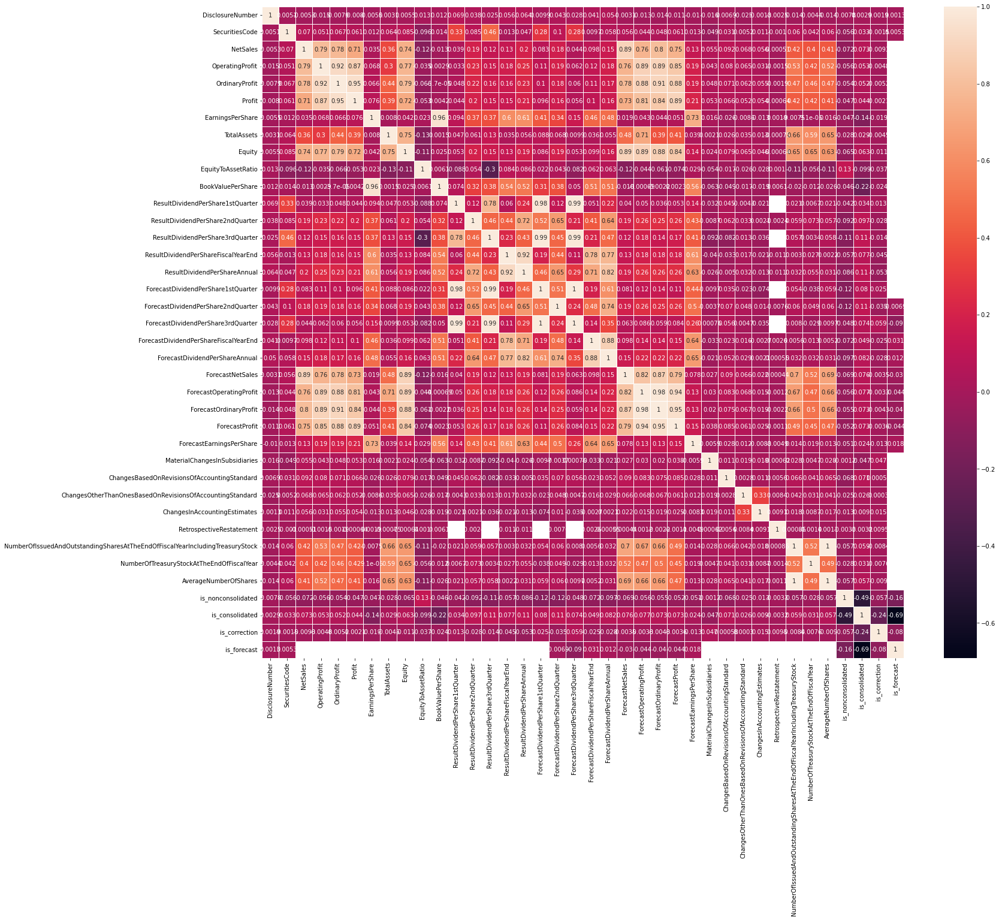

In [41]:
corrMatrix = financials.corr()
fig, ax = plt.subplots(figsize = (24, 20))
sns.heatmap(corrMatrix, annot=True, linewidths=.5, ax=ax)
fig.show()

In [42]:
financials.columns

Index(['DisclosureNumber', 'Date', 'SecuritiesCode', 'CurrentPeriodEndDate', 'TypeOfCurrentPeriod', 'NetSales', 'OperatingProfit', 'OrdinaryProfit', 'Profit', 'EarningsPerShare', 'TotalAssets', 'Equity', 'EquityToAssetRatio', 'BookValuePerShare', 'ResultDividendPerShare1stQuarter', 'ResultDividendPerShare2ndQuarter', 'ResultDividendPerShare3rdQuarter', 'ResultDividendPerShareFiscalYearEnd', 'ResultDividendPerShareAnnual', 'ForecastDividendPerShare1stQuarter', 'ForecastDividendPerShare2ndQuarter', 'ForecastDividendPerShare3rdQuarter', 'ForecastDividendPerShareFiscalYearEnd', 'ForecastDividendPerShareAnnual', 'ForecastNetSales', 'ForecastOperatingProfit', 'ForecastOrdinaryProfit', 'ForecastProfit', 'ForecastEarningsPerShare', 'MaterialChangesInSubsidiaries', 'ChangesBasedOnRevisionsOfAccountingStandard', 'ChangesOtherThanOnesBasedOnRevisionsOfAccountingStandard', 'ChangesInAccountingEstimates', 'RetrospectiveRestatement', 'NumberOfIssuedAndOutstandingSharesAtTheEndOfFiscalYearIncludingTr

In [43]:
correlated = ['ForecastDividendPerShareFiscalYearEnd',
              'ForecastNetSales', 'ForecastOperatingProfit',
              'NumberOfIssuedAndOutstandingSharesAtTheEndOfFiscalYearIncludingTreasuryStock',
              'OperatingProfit', 'OrdinaryProfit',
              ]
financials = financials.drop(correlated, axis=1)

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/ipykernel/__main__.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  app.launch_new_instance()


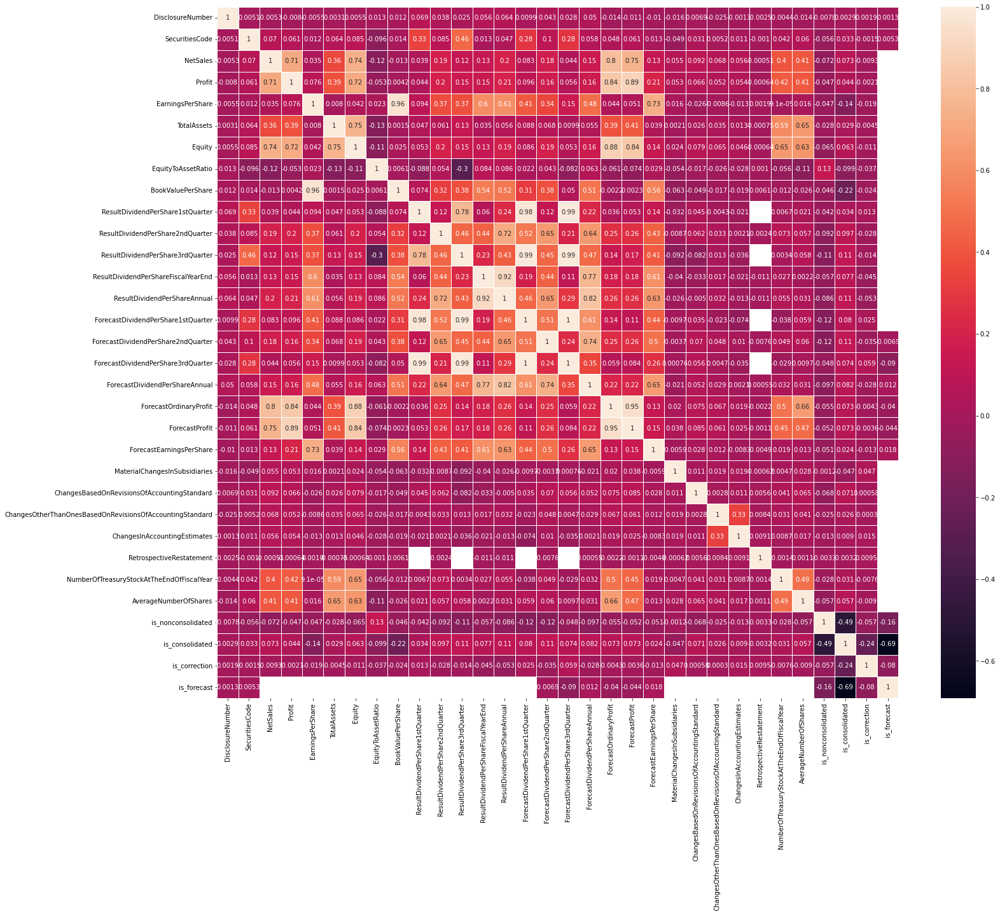

In [44]:
corrMatrix = financials.corr()
fig, ax = plt.subplots(figsize = (24, 20))
sns.heatmap(corrMatrix, annot=True, linewidths=.5, ax=ax)
fig.show()

K P A C U B O

К каждой дате:
- financials до этого, financials вперёд
- Мб сделать бакеты?

In [45]:
financials

,DisclosureNumber,Date,SecuritiesCode,CurrentPeriodEndDate,TypeOfCurrentPeriod,NetSales,Profit,EarningsPerShare,TotalAssets,Equity,EquityToAssetRatio,BookValuePerShare,ResultDividendPerShare1stQuarter,ResultDividendPerShare2ndQuarter,ResultDividendPerShare3rdQuarter,ResultDividendPerShareFiscalYearEnd,ResultDividendPerShareAnnual,ForecastDividendPerShare1stQuarter,ForecastDividendPerShare2ndQuarter,ForecastDividendPerShare3rdQuarter,ForecastDividendPerShareAnnual,ForecastOrdinaryProfit,ForecastProfit,ForecastEarningsPerShare,MaterialChangesInSubsidiaries,ChangesBasedOnRevisionsOfAccountingStandard,ChangesOtherThanOnesBasedOnRevisionsOfAccountingStandard,ChangesInAccountingEstimates,RetrospectiveRestatement,NumberOfTreasuryStockAtTheEndOfFiscalYear,AverageNumberOfShares,is_nonconsolidated,is_consolidated,agency,is_correction,is_forecast
0,2.016121e+13,2017-01-04,2753.0,2016-12-31,3Q,2.276100e+10,1.494000e+09,218.23,2.238600e+10,1.829500e+10,0.817,2671.42,NaN,50.0,NaN,NaN,NaN,NaN,NaN,NaN,100.0,3.300000e+09,2.190000e+09,319.76,0.0,1.0,0.0,0.0,0.0,NaN,6848800.0,False,True,JP,False,False
1,2.017010e+13,2017-01-04,3353.0,2016-11-30,3Q,2.212800e+10,6.290000e+08,328.57,2.510000e+10,7.566000e+09,0.301,NaN,NaN,36.0,NaN,NaN,NaN,NaN,NaN,NaN,72.0,1.300000e+09,9.300000e+08,485.36,0.0,1.0,0.0,0.0,0.0,118917.0,1916083.0,False,True,JP,False,False
2,2.016123e+13,2017-01-04,4575.0,2016-12-31,2Q,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-4.660000e+08,-4.670000e+08,-93.11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,ForecastRevision,False,True
3,2.017010e+13,2017-01-05,2659.0,2016-11-30,3Q,1.347810e+11,7.171000e+09,224.35,1.284640e+11,1.009050e+11,0.765,3073.12,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,42.0,1.447300e+10,9.111000e+09,285.05,0.0,1.0,0.0,0.0,0.0,18257.0,31963405.0,False,True,JP,False,False
4,2.017011e+13,2017-01-05,3050.0,2017-02-28,FY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,ForecastRevision,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92951,2.021112e+13,2021-12-03,6040.0,2021-10-31,1Q,7.320000e+08,-2.060000e+08,-13.59,6.952000e+09,4.771000e+09,0.653,299.30,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,7.0,2.930000e+08,1.990000e+08,35.53,0.0,1.0,0.0,0.0,0.0,836400.0,15164000.0,False,True,JP,False,False
92952,2.021120e+13,2021-12-03,6898.0,2021-10-31,3Q,1.293000e+09,1.210000e+08,184.73,4.246000e+09,3.284000e+09,0.774,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.070000e+08,9.300000e+07,142.01,0.0,0.0,0.0,0.0,0.0,157541.0,659486.0,False,True,JP,False,False
92953,2.021120e+13,2021-12-03,6969.0,2022-03-31,FY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.200000e+08,-3.800000e+08,-147.87,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,ForecastRevision,False,True
92954,2.021112e+13,2021-12-03,8057.0,2021-10-20,1Q,4.307100e+10,1.507000e+09,153.74,1.160160e+11,5.111600e+10,0.396,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,110.0,5.900000e+09,3.250000e+09,330.92,0.0,1.0,0.0,0.0,0.0,614032.0,9805339.0,False,True,JP,False,False


In [46]:
%%time
financials = financials.set_index('Date').groupby('SecuritiesCode').resample('B').last().drop('SecuritiesCode', axis=1).ffill().reset_index()
financials

CPU times: user 35.2 s, sys: 799 ms, total: 36 s
Wall time: 36 s


,SecuritiesCode,Date,DisclosureNumber,CurrentPeriodEndDate,TypeOfCurrentPeriod,NetSales,Profit,EarningsPerShare,TotalAssets,Equity,EquityToAssetRatio,BookValuePerShare,ResultDividendPerShare1stQuarter,ResultDividendPerShare2ndQuarter,ResultDividendPerShare3rdQuarter,ResultDividendPerShareFiscalYearEnd,ResultDividendPerShareAnnual,ForecastDividendPerShare1stQuarter,ForecastDividendPerShare2ndQuarter,ForecastDividendPerShare3rdQuarter,ForecastDividendPerShareAnnual,ForecastOrdinaryProfit,ForecastProfit,ForecastEarningsPerShare,MaterialChangesInSubsidiaries,ChangesBasedOnRevisionsOfAccountingStandard,ChangesOtherThanOnesBasedOnRevisionsOfAccountingStandard,ChangesInAccountingEstimates,RetrospectiveRestatement,NumberOfTreasuryStockAtTheEndOfFiscalYear,AverageNumberOfShares,is_nonconsolidated,is_consolidated,agency,is_correction,is_forecast
0,1301.0,2017-02-10,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0
1,1301.0,2017-02-13,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0
2,1301.0,2017-02-14,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0
3,1301.0,2017-02-15,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0
4,1301.0,2017-02-16,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4543198,9997.0,2021-10-25,2.021073e+13,2021-06-30,1Q,5.892600e+10,1.663000e+09,17.21,2.514460e+11,1.148210e+11,0.454,1164.97,0.0,8.0,15.56,8.5,16.5,16.0,9.5,16.0,19.0,1.820000e+10,1.250000e+10,129.30,0.0,1.0,0.0,0.0,0.0,571892.0,96672603.0,0.0,1.0,JP,0.0,0.0
4543199,9997.0,2021-10-26,2.021073e+13,2021-06-30,1Q,5.892600e+10,1.663000e+09,17.21,2.514460e+11,1.148210e+11,0.454,1164.97,0.0,8.0,15.56,8.5,16.5,16.0,9.5,16.0,19.0,1.820000e+10,1.250000e+10,129.30,0.0,1.0,0.0,0.0,0.0,571892.0,96672603.0,0.0,1.0,JP,0.0,0.0
4543200,9997.0,2021-10-27,2.021073e+13,2021-06-30,1Q,5.892600e+10,1.663000e+09,17.21,2.514460e+11,1.148210e+11,0.454,1164.97,0.0,8.0,15.56,8.5,16.5,16.0,9.5,16.0,19.0,1.820000e+10,1.250000e+10,129.30,0.0,1.0,0.0,0.0,0.0,571892.0,96672603.0,0.0,1.0,JP,0.0,0.0
4543201,9997.0,2021-10-28,2.021073e+13,2021-06-30,1Q,5.892600e+10,1.663000e+09,17.21,2.514460e+11,1.148210e+11,0.454,1164.97,0.0,8.0,15.56,8.5,16.5,16.0,9.5,16.0,19.0,1.820000e+10,1.250000e+10,129.30,0.0,1.0,0.0,0.0,0.0,571892.0,96672603.0,0.0,1.0,JP,0.0,0.0


In [49]:
financials_full = financials.merge(stock_list, on='SecuritiesCode')
financials_full

,SecuritiesCode,Date,DisclosureNumber,CurrentPeriodEndDate,TypeOfCurrentPeriod,NetSales,Profit,EarningsPerShare,TotalAssets,Equity,EquityToAssetRatio,BookValuePerShare,ResultDividendPerShare1stQuarter,ResultDividendPerShare2ndQuarter,ResultDividendPerShare3rdQuarter,ResultDividendPerShareFiscalYearEnd,ResultDividendPerShareAnnual,ForecastDividendPerShare1stQuarter,ForecastDividendPerShare2ndQuarter,ForecastDividendPerShare3rdQuarter,ForecastDividendPerShareAnnual,ForecastOrdinaryProfit,ForecastProfit,ForecastEarningsPerShare,MaterialChangesInSubsidiaries,ChangesBasedOnRevisionsOfAccountingStandard,ChangesOtherThanOnesBasedOnRevisionsOfAccountingStandard,ChangesInAccountingEstimates,RetrospectiveRestatement,NumberOfTreasuryStockAtTheEndOfFiscalYear,AverageNumberOfShares,is_nonconsolidated,is_consolidated,agency,is_correction,is_forecast,Section/Products,NewMarketSegment,33SectorName,17SectorName,NewIndexSeriesSize
0,1301.0,2017-02-10,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0,First Section (Domestic),Prime Market,"Fishery, Agriculture and Forestry",FOODS,TOPIX Small 2
1,1301.0,2017-02-13,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0,First Section (Domestic),Prime Market,"Fishery, Agriculture and Forestry",FOODS,TOPIX Small 2
2,1301.0,2017-02-14,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0,First Section (Domestic),Prime Market,"Fishery, Agriculture and Forestry",FOODS,TOPIX Small 2
3,1301.0,2017-02-15,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0,First Section (Domestic),Prime Market,"Fishery, Agriculture and Forestry",FOODS,TOPIX Small 2
4,1301.0,2017-02-16,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0,First Section (Domestic),Prime Market,"Fishery, Agriculture and Forestry",FOODS,TOPIX Small 2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4543198,9997.0,2021-10-25,2.021073e+13,2021-06-30,1Q,5.892600e+10,1.663000e+09,17.21,2.514460e+11,1.148210e+11,0.454,1164.97,0.0,8.0,15.56,8.5,16.5,16.0,9.5,16.0,19.0,1.820000e+10,1.250000e+10,129.30,0.0,1.0,0.0,0.0,0.0,571892.0,96672603.0,0.0,1.0,JP,0.0,0.0,First Section (Domestic),Prime Market,Retail Trade,RETAIL TRADE,TOPIX Small 1
4543199,9997.0,2021-10-26,2.021073e+13,2021-06-30,1Q,5.892600e+10,1.663000e+09,17.21,2.514460e+11,1.148210e+11,0.454,1164.97,0.0,8.0,15.56,8.5,16.5,16.0,9.5,16.0,19.0,1.820000e+10,1.250000e+10,129.30,0.0,1.0,0.0,0.0,0.0,571892.0,96672603.0,0.0,1.0,JP,0.0,0.0,First Section (Domestic),Prime Market,Retail Trade,RETAIL TRADE,TOPIX Small 1
4543200,9997.0,2021-10-27,2.021073e+13,2021-06-30,1Q,5.892600e+10,1.663000e+09,17.21,2.514460e+11,1.148210e+11,0.454,1164.97,0.0,8.0,15.56,8.5,16.5,16.0,9.5,16.0,19.0,1.820000e+10,1.250000e+10,129.30,0.0,1.0,0.0,0.0,0.0,571892.0,96672603.0,0.0,1.0,JP,0.0,0.0,First Section (Domestic),Prime Market,Retail Trade,RETAIL TRADE,TOPIX Small 1
4543201,9997.0,2021-10-28,2.021073e+13,2021-06-30,1Q,5.892600e+10,1.663000e+09,17.21,2.514460e+11,1.148210e+11,0.454,1164.97,0.0,8.0,15.56,8.5,16.5,16.0,9.5,16.0,19.0,1.820000e+10,1.250000e+10,1

In [61]:
financials_avg = financials_full.groupby(groupers).mean().drop(columns='SecuritiesCode')

In [73]:
divided = financials_full.columns.difference(['SecuritiesCode', 'TypeOfCurrentPeriod', 'CurrentPeriodEndDate', 'agency', 'is_consolidated', 'is_correction', 'is_forecast', 'is_nonconsolidated'] + groupers)
divisors = [divisor + '_cluster_avg' for divisor in divided]
print(list(zip(divided, divisors)))

[('AverageNumberOfShares', 'AverageNumberOfShares_cluster_avg'), ('BookValuePerShare', 'BookValuePerShare_cluster_avg'), ('ChangesBasedOnRevisionsOfAccountingStandard', 'ChangesBasedOnRevisionsOfAccountingStandard_cluster_avg'), ('ChangesInAccountingEstimates', 'ChangesInAccountingEstimates_cluster_avg'), ('ChangesOtherThanOnesBasedOnRevisionsOfAccountingStandard', 'ChangesOtherThanOnesBasedOnRevisionsOfAccountingStandard_cluster_avg'), ('DisclosureNumber', 'DisclosureNumber_cluster_avg'), ('EarningsPerShare', 'EarningsPerShare_cluster_avg'), ('Equity', 'Equity_cluster_avg'), ('EquityToAssetRatio', 'EquityToAssetRatio_cluster_avg'), ('ForecastDividendPerShare1stQuarter', 'ForecastDividendPerShare1stQuarter_cluster_avg'), ('ForecastDividendPerShare2ndQuarter', 'ForecastDividendPerShare2ndQuarter_cluster_avg'), ('ForecastDividendPerShare3rdQuarter', 'ForecastDividendPerShare3rdQuarter_cluster_avg'), ('ForecastDividendPerShareAnnual', 'ForecastDividendPerShareAnnual_cluster_avg'), ('Forec

In [88]:
financials_merged = financials_full.merge(
    financials_avg,
    on=groupers,
    how='left',
    suffixes=('', '_cluster_avg'),
)
financials_merged = financials_merged.drop(columns=groupers[:-1])
financials_merged

,SecuritiesCode,Date,DisclosureNumber,CurrentPeriodEndDate,TypeOfCurrentPeriod,NetSales,Profit,EarningsPerShare,TotalAssets,Equity,EquityToAssetRatio,BookValuePerShare,ResultDividendPerShare1stQuarter,ResultDividendPerShare2ndQuarter,ResultDividendPerShare3rdQuarter,ResultDividendPerShareFiscalYearEnd,ResultDividendPerShareAnnual,ForecastDividendPerShare1stQuarter,ForecastDividendPerShare2ndQuarter,ForecastDividendPerShare3rdQuarter,ForecastDividendPerShareAnnual,ForecastOrdinaryProfit,ForecastProfit,ForecastEarningsPerShare,MaterialChangesInSubsidiaries,ChangesBasedOnRevisionsOfAccountingStandard,ChangesOtherThanOnesBasedOnRevisionsOfAccountingStandard,ChangesInAccountingEstimates,RetrospectiveRestatement,NumberOfTreasuryStockAtTheEndOfFiscalYear,AverageNumberOfShares,is_nonconsolidated,is_consolidated,agency,is_correction,is_forecast,DisclosureNumber_cluster_avg,NetSales_cluster_avg,Profit_cluster_avg,EarningsPerShare_cluster_avg,TotalAssets_cluster_avg,Equity_cluster_avg,EquityToAssetRatio_cluster_avg,BookValuePerShare_cluster_avg,ResultDividendPerShare1stQuarter_cluster_avg,ResultDividendPerShare2ndQuarter_cluster_avg,ResultDividendPerShare3rdQuarter_cluster_avg,ResultDividendPerShareFiscalYearEnd_cluster_avg,ResultDividendPerShareAnnual_cluster_avg,ForecastDividendPerShare1stQuarter_cluster_avg,ForecastDividendPerShare2ndQuarter_cluster_avg,ForecastDividendPerShare3rdQuarter_cluster_avg,ForecastDividendPerShareAnnual_cluster_avg,ForecastOrdinaryProfit_cluster_avg,ForecastProfit_cluster_avg,ForecastEarningsPerShare_cluster_avg,MaterialChangesInSubsidiaries_cluster_avg,ChangesBasedOnRevisionsOfAccountingStandard_cluster_avg,ChangesOtherThanOnesBasedOnRevisionsOfAccountingStandard_cluster_avg,ChangesInAccountingEstimates_cluster_avg,RetrospectiveRestatement_cluster_avg,NumberOfTreasuryStockAtTheEndOfFiscalYear_cluster_avg,AverageNumberOfShares_cluster_avg
0,1301.0,2017-02-10,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0,2.016113e+13,1.799750e+11,2.449000e+09,233.260000,1.171680e+11,2.577900e+10,0.217000,NaN,NaN,45.000000,NaN,NaN,NaN,NaN,NaN,NaN,50.000000,3.300000e+09,2.100000e+09,199.940000,0.000000,1.000000,0.0,0.0,0.0,4.254550e+05,1.050302e+07
1,1301.0,2017-02-13,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0,2.016113e+13,1.799750e+11,2.449000e+09,233.260000,1.171680e+11,2.577900e+10,0.217000,NaN,NaN,45.000000,NaN,NaN,NaN,NaN,NaN,NaN,50.000000,3.300000e+09,2.100000e+09,199.940000,0.000000,1.000000,0.0,0.0,0.0,4.254550e+05,1.050302e+07
2,1301.0,2017-02-14,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0,2.016113e+13,1.799750e+11,2.449000e+09,233.260000,1.171680e+11,2.577900e+10,0.217000,NaN,NaN,45.000000,NaN,NaN,NaN,NaN,NaN,NaN,50.000000,3.300000e+09,2.100000e+09,199.940000,0.000000,1.000000,0.0,0.0,0.0,4.254550e+05,1.050302e+07
3,1301.0,2017-02-15,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0,2.016113e+13,1.799750e+11,2.449000e+09,233.260000,1.171680e+11,2.577900e+10,0.217000,NaN,NaN,45.000000,NaN,NaN,NaN,NaN,NaN,NaN,50.000000,3.300000e+09,2.100000e+09,199.940000,0.000000,1.000000,0.0,0.0,0.0,4.254550e+05,1.050302e+07
4,1301.0,2017-02-16,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0

In [89]:
financials_merged[divisors] = financials_merged[divided].div(financials_merged[divisors].rename(columns=lambda x: x.replace('_cluster_avg', '')))

In [91]:
financials_merged = financials_merged.rename(columns=lambda x: camel_to_snake.sub('_', x).lower())
financials_merged

,securities_code,date,disclosure_number,current_period_end_date,type_of_current_period,net_sales,profit,earnings_per_share,total_assets,equity,equity_to_asset_ratio,book_value_per_share,result_dividend_per_share1st_quarter,result_dividend_per_share2nd_quarter,result_dividend_per_share3rd_quarter,result_dividend_per_share_fiscal_year_end,result_dividend_per_share_annual,forecast_dividend_per_share1st_quarter,forecast_dividend_per_share2nd_quarter,forecast_dividend_per_share3rd_quarter,forecast_dividend_per_share_annual,forecast_ordinary_profit,forecast_profit,forecast_earnings_per_share,material_changes_in_subsidiaries,changes_based_on_revisions_of_accounting_standard,changes_other_than_ones_based_on_revisions_of_accounting_standard,changes_in_accounting_estimates,retrospective_restatement,number_of_treasury_stock_at_the_end_of_fiscal_year,average_number_of_shares,is_nonconsolidated,is_consolidated,agency,is_correction,is_forecast,disclosure_number_cluster_avg,net_sales_cluster_avg,profit_cluster_avg,earnings_per_share_cluster_avg,total_assets_cluster_avg,equity_cluster_avg,equity_to_asset_ratio_cluster_avg,book_value_per_share_cluster_avg,result_dividend_per_share1st_quarter_cluster_avg,result_dividend_per_share2nd_quarter_cluster_avg,result_dividend_per_share3rd_quarter_cluster_avg,result_dividend_per_share_fiscal_year_end_cluster_avg,result_dividend_per_share_annual_cluster_avg,forecast_dividend_per_share1st_quarter_cluster_avg,forecast_dividend_per_share2nd_quarter_cluster_avg,forecast_dividend_per_share3rd_quarter_cluster_avg,forecast_dividend_per_share_annual_cluster_avg,forecast_ordinary_profit_cluster_avg,forecast_profit_cluster_avg,forecast_earnings_per_share_cluster_avg,material_changes_in_subsidiaries_cluster_avg,changes_based_on_revisions_of_accounting_standard_cluster_avg,changes_other_than_ones_based_on_revisions_of_accounting_standard_cluster_avg,changes_in_accounting_estimates_cluster_avg,retrospective_restatement_cluster_avg,number_of_treasury_stock_at_the_end_of_fiscal_year_cluster_avg,average_number_of_shares_cluster_avg
0,1301.0,2017-02-10,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1.000000,1.000000,NaN,1.000000,NaN,NaN,NaN,1.000000,1.000000
1,1301.0,2017-02-13,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1.000000,1.000000,NaN,1.000000,NaN,NaN,NaN,1.000000,1.000000
2,1301.0,2017-02-14,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1.000000,1.000000,NaN,1.000000,NaN,NaN,NaN,1.000000,1.000000
3,1301.0,2017-02-15,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,425455.0,10503022.0,0.0,1.0,JP,0.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1.000000,1.000000,NaN,1.000000,NaN,NaN,NaN,1.000000,1.000000
4,1301.0,2017-02-16,2.016113e+13,2016-12-31,3Q,1.799750e+11,2.449000e+09,233.26,1.171680e+11,2.577900e+10,0.217,NaN,NaN,45.0,NaN,NaN,NaN,NaN,NaN,NaN,50.0,3.300000e+09,2.100000e+09,199.94,0.0,1.0,0.0,0.0,0.0,42

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/ipykernel/__main__.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  app.launch_new_instance()


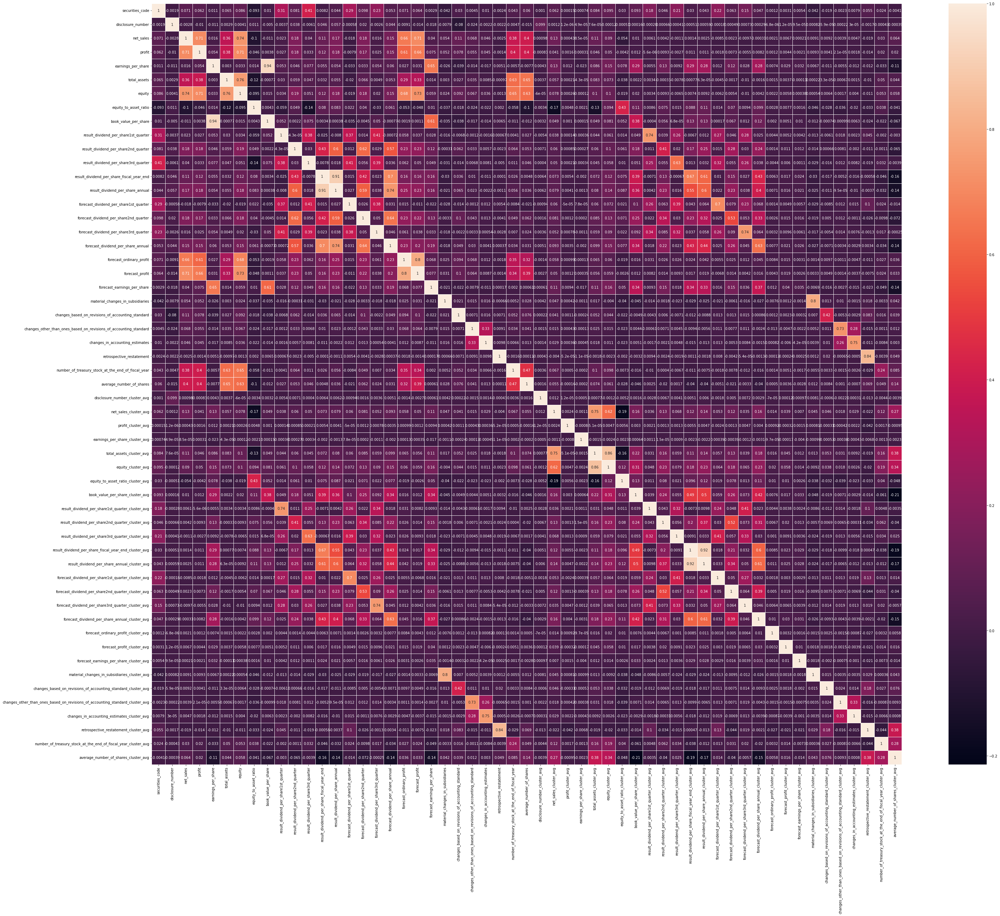

In [110]:
corrMatrix = financials_merged.corr()
fig, ax = plt.subplots(figsize = (48, 40))
sns.heatmap(corrMatrix, annot=True, linewidths=.5, ax=ax)
fig.show()

## Script

In [40]:
def preprocess_financials(financials: pd.DataFrame):
    bad_cols = ['DateCode', 'DisclosedDate', 'DisclosedTime', 'DisclosedUnixTime',
                'CurrentFiscalYearStartDate', 'CurrentFiscalYearEndDate',
                'ApplyingOfSpecificAccountingOfTheQuarterlyFinancialStatements',
                'ForecastDividendPerShareFiscalYearEnd',
                'ForecastNetSales', 'ForecastOperatingProfit',
                'NumberOfIssuedAndOutstandingSharesAtTheEndOfFiscalYearIncludingTreasuryStock',
                'OperatingProfit', 'OrdinaryProfit',
                ]
    financials = financials.drop(bad_cols, axis=1)
    financials = financials.replace("－", None)
    financials.sample(5)


    financials['is_nonconsolidated'] = financials['TypeOfDocument'].str.contains('NonConsolidated').astype(bool)
    financials['is_consolidated'] = financials['TypeOfDocument'].str.contains('Consolidated').astype(bool) & ~financials['is_nonconsolidated']
    financials['agency'] = financials['TypeOfDocument'].str.split('_').str[-1]
    financials['is_correction'] = financials['TypeOfDocument'].str.contains('NumericalCorrection').astype(bool)
    financials['is_forecast'] = financials['TypeOfDocument'].str.contains('ForecastRevision').astype(bool)

    financials = financials.drop(['TypeOfDocument'], axis=1)


    for col in financials.columns.difference(['Date', 'CurrentPeriodEndDate', 'TypeOfCurrentPeriod', 'agency']):
        try:
            financials[col] = pd.to_numeric(financials[col], errors='coerce')
        except Exception as e:
            print(f'exc {e}, col {col}')

    financials_full = financials.merge(stock_list, on='SecuritiesCode')


    financials_avg = financials_full.groupby(groupers).mean().drop(columns='SecuritiesCode')

    divided = financials_full.columns.difference(['SecuritiesCode', 'TypeOfCurrentPeriod', 'CurrentPeriodEndDate', 'agency', 'is_consolidated', 'is_correction', 'is_forecast', 'is_nonconsolidated'] + groupers)
    divisors = [divisor + '_cluster_avg' for divisor in divided]

    financials_merged = financials_full.merge(
        financials_avg,
        on=groupers,
        how='left',
        suffixes=('', '_cluster_avg'),
    )
    financials_merged = financials_merged.drop(columns=groupers[:-1])
    financials = financials.sort_values(by='Date').groupby('SecuritiesCode').ffill()

    financials_merged[divisors] = financials_merged[divided].div(financials_merged[divisors].rename(columns=lambda x: x.replace('_cluster_avg', '')))
    financials_merged = financials_merged.rename(columns=lambda x: camel_to_snake.sub('_', x).lower())
    financials_merged.drop(columns=['current_period_end_date', 'type_of_current_period'])
    return financials_merged

In [41]:
%%time
financials = pd.read_csv(data_root / 'train_files/financials.csv', parse_dates=['Date'])
financials = preprocess_financials(financials)
financials

CPU times: user 1.31 s, sys: 4.33 ms, total: 1.32 s
Wall time: 1.3 s


,disclosure_number,date,securities_code,current_period_end_date,type_of_current_period,net_sales,profit,earnings_per_share,total_assets,equity,...,changes_based_on_revisions_of_accounting_standard_cluster_avg,changes_other_than_ones_based_on_revisions_of_accounting_standard_cluster_avg,changes_in_accounting_estimates_cluster_avg,retrospective_restatement_cluster_avg,number_of_treasury_stock_at_the_end_of_fiscal_year_cluster_avg,average_number_of_shares_cluster_avg,is_nonconsolidated_cluster_avg,is_consolidated_cluster_avg,is_correction_cluster_avg,is_forecast_cluster_avg
0,2.016121e+13,2017-01-04,2753.0,2016-12-31,3Q,2.276100e+10,1.494000e+09,218.23,2.238600e+10,1.829500e+10,...,1.0,NaN,NaN,NaN,NaN,1.000000,0.000000,1.000000,0.000000,0.000000
1,2.017031e+13,2017-04-03,2753.0,2017-03-31,FY,3.056400e+10,2.163000e+09,315.96,2.330400e+10,1.896500e+10,...,1.0,NaN,NaN,NaN,0.000782,0.264614,0.333333,0.666667,0.000000,0.000000
2,2.017061e+13,2017-07-03,2753.0,2017-06-30,1Q,7.783000e+09,5.090000e+08,74.34,2.329800e+10,1.913200e+10,...,NaN,NaN,NaN,NaN,NaN,0.325153,0.000000,1.000000,0.000000,0.000000
3,2.017091e+13,2017-10-02,2753.0,2017-09-30,2Q,1.569000e+10,1.053000e+09,153.80,2.398600e+10,1.967600e+10,...,NaN,NaN,NaN,NaN,0.028613,0.322070,0.000000,0.400000,0.200000,0.400000
4,2.017121e+13,2018-01-04,2753.0,2017-12-31,3Q,2.355500e+10,1.524000e+09,222.64,2.411100e+10,1.980400e+10,...,NaN,NaN,NaN,NaN,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92949,2.021112e+13,2021-11-15,4377.0,2021-09-30,3Q,1.347000e+09,2.150000e+08,43.12,1.584000e+09,3.340000e+08,...,0.0,NaN,NaN,NaN,3.400892,0.653649,0.533333,0.266667,0.066667,0.133333
92950,2.021111e+13,2021-11-15,5076.0,2022-03-31,FY,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.500000,0.000000,0.500000
92951,2.021111e+13,2021-11-15,9245.0,2021-09-30,3Q,1.913000e+09,2.990000e+08,62.62,3.093000e+09,1.843000e+09,...,0.0,NaN,NaN,NaN,3.582970,0.551621,0.142857,0.714286,0.071429,0.071429
92952,2.021111e+13,2021-11-15,9246.0,2021-09-30,3Q,1.462000e+09,2.450000e+08,48.71,2.187000e+09,1.558000e+09,...,0.0,NaN,NaN,NaN,3.582970,0.581870,0.142857,0.714286,0.071429,0.071429


# Trades
- wtf nepon
- ask Bars wtf + nepon

## EDA

In [97]:
trades = pd.read_csv(data_root / 'train_files/trades.csv', parse_dates=['Date', 'StartDate', 'EndDate'])
trades = trades.rename({'CityBKsRegionalBKsEtcPurchase': 'CityBKsRegionalBKsEtcPurchases'}, axis=1)
trades = trades.dropna()
trades

,Date,StartDate,EndDate,Section,TotalSales,TotalPurchases,TotalTotal,TotalBalance,ProprietarySales,ProprietaryPurchases,ProprietaryTotal,ProprietaryBalance,BrokerageSales,BrokeragePurchases,BrokerageTotal,BrokerageBalance,IndividualsSales,IndividualsPurchases,IndividualsTotal,IndividualsBalance,ForeignersSales,ForeignersPurchases,ForeignersTotal,ForeignersBalance,SecuritiesCosSales,SecuritiesCosPurchases,SecuritiesCosTotal,SecuritiesCosBalance,InvestmentTrustsSales,InvestmentTrustsPurchases,InvestmentTrustsTotal,InvestmentTrustsBalance,BusinessCosSales,BusinessCosPurchases,BusinessCosTotal,BusinessCosBalance,OtherInstitutionsSales,OtherInstitutionsPurchases,OtherInstitutionsTotal,OtherInstitutionsBalance,InsuranceCosSales,InsuranceCosPurchases,InsuranceCosTotal,InsuranceCosBalance,CityBKsRegionalBKsEtcSales,CityBKsRegionalBKsEtcPurchases,CityBKsRegionalBKsEtcTotal,CityBKsRegionalBKsEtcBalance,TrustBanksSales,TrustBanksPurchases,TrustBanksTotal,TrustBanksBalance,OtherFinancialInstitutionsSales,OtherFinancialInstitutionsPurchases,OtherFinancialInstitutionsTotal,OtherFinancialInstitutionsBalance
6,2017-01-13,2017-01-04,2017-01-06,Growth Market (Mothers/JASDAQ),4.592074e+08,4.593263e+08,9.185338e+08,118862.0,1.605747e+07,1.282267e+07,2.888014e+07,-3234799.0,4.431500e+08,4.465036e+08,8.896536e+08,3353661.0,3.043444e+08,3.004344e+08,6.047787e+08,-3909995.0,1.139112e+08,1.200110e+08,2.339223e+08,6099784.0,12051018.0,11241249.0,23292267.0,-809769.0,1905221.0,3173359.0,5078580.0,1268138.0,4961900.0,4859492.0,9821392.0,-102408.0,1114202.0,832400.0,1946602.0,-281802.0,21175.0,4342.0,25517.0,-16833.0,61277.0,38601.0,99878.0,-22676.0,4758211.0,5797986.0,10556197.0,1039775.0,21362.0,110809.0,132171.0,89447.0
7,2017-01-13,2017-01-04,2017-01-06,Prime Market (First Section),8.476800e+09,8.483346e+09,1.696015e+10,6546353.0,1.311271e+09,1.453327e+09,2.764598e+09,142055504.0,7.165529e+09,7.030020e+09,1.419555e+10,-135509151.0,1.401712e+09,1.161801e+09,2.563513e+09,-239910460.0,5.094892e+09,5.317152e+09,1.041204e+10,222260039.0,76381455.0,61700100.0,138081555.0,-14681355.0,168705109.0,124389642.0,293094751.0,-44315467.0,71217959.0,63526641.0,134744600.0,-7691318.0,10745152.0,15687836.0,26432988.0,4942684.0,15926202.0,9831555.0,25757757.0,-6094647.0,10606789.0,8843871.0,19450660.0,-1762918.0,292932297.0,245322795.0,538255092.0,-47609502.0,22410692.0,21764485.0,44175177.0,-646207.0
8,2017-01-13,2017-01-04,2017-01-06,Standard Market (Second Section),2.223549e+08,2.217707e+08,4.441256e+08,-584153.0,1.309361e+07,6.535935e+06,1.962954e+07,-6557672.0,2.092613e+08,2.152348e+08,4.244960e+08,5973519.0,1.224825e+08,1.239568e+08,2.464393e+08,1474255.0,7.623919e+07,8.047202e+07,1.567112e+08,4232828.0,6051426.0,5778242.0,11829668.0,-273184.0,600795.0,694595.0,1295390.0,93800.0,2139840.0,1980229.0,4120069.0,-159611.0,314555.0,494071.0,808626.0,179516.0,19636.0,12986.0,32622.0,-6650.0,36866.0,2301.0,39167.0,-34565.0,1328241.0,1807118.0,3135359.0,478877.0,48202.0,36455.0,84657.0,-11747.0
12,2017-01-19,2017-01-10,2017-01-13,Growth Market (Mothers/JASDAQ),5.375720e+08,5.374116e+08,1.074984e+09,-160453.0,1.633072e+07,1.293260e+07,2.926332e+07,-3398116.0,5.212413e+08,5.244790e+08,1.045720e+09,3237663.0,3.550606e+08,3.621777e+08,7.172383e+08,7117081.0,1.402240e+08,1.345733e+08,2.747974e+08,-5650716.0,13354726.0,13232976.0,26587702.0,-121750.0,2686860.0,3785961.0,6472821.0,1099101.0,5431236.0,5583704.0,11014940.0,152468.0,1096728.0,1084813.0,2181541.0,-11915.0,38530.0,122166.0,160696.0,83636.0,54324.0,79399.0,133723.0,25075.0,3217637.0,3798890.0,7016527.0,581253.0,76618.0,40048.0,116666.0,-36570.0
13,2017-01-19,2017-01-10,2017-01-13,Prime Market (First Section),1.042993e+10,1.042907e+10,2.085900e+10,-855001.0,1.759900e+09,1.716387e+09,3.476286e+09,-43512988.0,8.670029e+09,8.712687e+09,1.738272e+10,42657987.0,1.562986e+09,1.560324e+09,3.123310e+09,-2661762.0,6.361553e+09,6.480221e+09,1.284177e+10,118667551.0,86969178.0,80756263.0,167725441.0,-6212915.0,225185589.0,167434

In [98]:
trades = trades.drop(['StartDate', 'EndDate', 'Section'], axis=1)
trades

,Date,TotalSales,TotalPurchases,TotalTotal,TotalBalance,ProprietarySales,ProprietaryPurchases,ProprietaryTotal,ProprietaryBalance,BrokerageSales,BrokeragePurchases,BrokerageTotal,BrokerageBalance,IndividualsSales,IndividualsPurchases,IndividualsTotal,IndividualsBalance,ForeignersSales,ForeignersPurchases,ForeignersTotal,ForeignersBalance,SecuritiesCosSales,SecuritiesCosPurchases,SecuritiesCosTotal,SecuritiesCosBalance,InvestmentTrustsSales,InvestmentTrustsPurchases,InvestmentTrustsTotal,InvestmentTrustsBalance,BusinessCosSales,BusinessCosPurchases,BusinessCosTotal,BusinessCosBalance,OtherInstitutionsSales,OtherInstitutionsPurchases,OtherInstitutionsTotal,OtherInstitutionsBalance,InsuranceCosSales,InsuranceCosPurchases,InsuranceCosTotal,InsuranceCosBalance,CityBKsRegionalBKsEtcSales,CityBKsRegionalBKsEtcPurchases,CityBKsRegionalBKsEtcTotal,CityBKsRegionalBKsEtcBalance,TrustBanksSales,TrustBanksPurchases,TrustBanksTotal,TrustBanksBalance,OtherFinancialInstitutionsSales,OtherFinancialInstitutionsPurchases,OtherFinancialInstitutionsTotal,OtherFinancialInstitutionsBalance
6,2017-01-13,4.592074e+08,4.593263e+08,9.185338e+08,118862.0,1.605747e+07,1.282267e+07,2.888014e+07,-3234799.0,4.431500e+08,4.465036e+08,8.896536e+08,3353661.0,3.043444e+08,3.004344e+08,6.047787e+08,-3909995.0,1.139112e+08,1.200110e+08,2.339223e+08,6099784.0,12051018.0,11241249.0,23292267.0,-809769.0,1905221.0,3173359.0,5078580.0,1268138.0,4961900.0,4859492.0,9821392.0,-102408.0,1114202.0,832400.0,1946602.0,-281802.0,21175.0,4342.0,25517.0,-16833.0,61277.0,38601.0,99878.0,-22676.0,4758211.0,5797986.0,10556197.0,1039775.0,21362.0,110809.0,132171.0,89447.0
7,2017-01-13,8.476800e+09,8.483346e+09,1.696015e+10,6546353.0,1.311271e+09,1.453327e+09,2.764598e+09,142055504.0,7.165529e+09,7.030020e+09,1.419555e+10,-135509151.0,1.401712e+09,1.161801e+09,2.563513e+09,-239910460.0,5.094892e+09,5.317152e+09,1.041204e+10,222260039.0,76381455.0,61700100.0,138081555.0,-14681355.0,168705109.0,124389642.0,293094751.0,-44315467.0,71217959.0,63526641.0,134744600.0,-7691318.0,10745152.0,15687836.0,26432988.0,4942684.0,15926202.0,9831555.0,25757757.0,-6094647.0,10606789.0,8843871.0,19450660.0,-1762918.0,292932297.0,245322795.0,538255092.0,-47609502.0,22410692.0,21764485.0,44175177.0,-646207.0
8,2017-01-13,2.223549e+08,2.217707e+08,4.441256e+08,-584153.0,1.309361e+07,6.535935e+06,1.962954e+07,-6557672.0,2.092613e+08,2.152348e+08,4.244960e+08,5973519.0,1.224825e+08,1.239568e+08,2.464393e+08,1474255.0,7.623919e+07,8.047202e+07,1.567112e+08,4232828.0,6051426.0,5778242.0,11829668.0,-273184.0,600795.0,694595.0,1295390.0,93800.0,2139840.0,1980229.0,4120069.0,-159611.0,314555.0,494071.0,808626.0,179516.0,19636.0,12986.0,32622.0,-6650.0,36866.0,2301.0,39167.0,-34565.0,1328241.0,1807118.0,3135359.0,478877.0,48202.0,36455.0,84657.0,-11747.0
12,2017-01-19,5.375720e+08,5.374116e+08,1.074984e+09,-160453.0,1.633072e+07,1.293260e+07,2.926332e+07,-3398116.0,5.212413e+08,5.244790e+08,1.045720e+09,3237663.0,3.550606e+08,3.621777e+08,7.172383e+08,7117081.0,1.402240e+08,1.345733e+08,2.747974e+08,-5650716.0,13354726.0,13232976.0,26587702.0,-121750.0,2686860.0,3785961.0,6472821.0,1099101.0,5431236.0,5583704.0,11014940.0,152468.0,1096728.0,1084813.0,2181541.0,-11915.0,38530.0,122166.0,160696.0,83636.0,54324.0,79399.0,133723.0,25075.0,3217637.0,3798890.0,7016527.0,581253.0,76618.0,40048.0,116666.0,-36570.0
13,2017-01-19,1.042993e+10,1.042907e+10,2.085900e+10,-855001.0,1.759900e+09,1.716387e+09,3.476286e+09,-43512988.0,8.670029e+09,8.712687e+09,1.738272e+10,42657987.0,1.562986e+09,1.560324e+09,3.123310e+09,-2661762.0,6.361553e+09,6.480221e+09,1.284177e+10,118667551.0,86969178.0,80756263.0,167725441.0,-6212915.0,225185589.0,167434689.0,392620278.0,-57750900.0,85102476.0,93213748.0,178316224.0,8111272.0,14017378.0,27600058.0,41617436.0,13582680.0,8648760.0,13681894.0,22330654.0,5033134.0,25559282.0,13257445.0,38816727.0,-12301837.0,287358366.0,261144614.0,548502980.0,-26213752.0,12648955.0,15053471.0,27702426.0,240

In [99]:
from itertools import chain

sales_columns = trades.columns[trades.columns.str.endswith('Sales')]
purch_columns = trades.columns[trades.columns.str.endswith('Purchases')]
balance_columns = trades.columns[trades.columns.str.endswith('Balance')]
total_columns = trades.columns[trades.columns.str.endswith('Total')]

saved_columns = []
for sales, purch, balance, total in zip(sales_columns, purch_columns, balance_columns, total_columns):
    colname = camel_to_snake.sub('_', sales[:-5]).lower()
    purch_to_total = colname + '_purchases_to_total'
    purch_to_balance = colname + '_purchases_to_balance'
    sales_to_total = colname + '_sales_to_total'
    sales_to_balance = colname + '_sales_to_balance'
    balance_to_total = colname + '_balance_to_total'
    
    trades[purch_to_total] = trades[purch].div(trades[total])
    trades[purch_to_balance] = trades[purch].div(trades[balance])
    trades[sales_to_total] = trades[sales].div(trades[total])
    trades[sales_to_balance] = trades[sales].div(trades[balance])
    trades[balance_to_total] = trades[balance].div(trades[total])
    
    saved_columns += [purch_to_total, purch_to_balance, sales_to_total, sales_to_balance, balance_to_total]
trades = trades.drop(chain(sales_columns, purch_columns, balance_columns, total_columns), axis=1)
trades

,Date,total_purchases_to_total,total_purchases_to_balance,total_sales_to_total,total_sales_to_balance,total_balance_to_total,proprietary_purchases_to_total,proprietary_purchases_to_balance,proprietary_sales_to_total,proprietary_sales_to_balance,proprietary_balance_to_total,brokerage_purchases_to_total,brokerage_purchases_to_balance,brokerage_sales_to_total,brokerage_sales_to_balance,brokerage_balance_to_total,individuals_purchases_to_total,individuals_purchases_to_balance,individuals_sales_to_total,individuals_sales_to_balance,individuals_balance_to_total,foreigners_purchases_to_total,foreigners_purchases_to_balance,foreigners_sales_to_total,foreigners_sales_to_balance,foreigners_balance_to_total,securities_cos_purchases_to_total,securities_cos_purchases_to_balance,securities_cos_sales_to_total,securities_cos_sales_to_balance,securities_cos_balance_to_total,investment_trusts_purchases_to_total,investment_trusts_purchases_to_balance,investment_trusts_sales_to_total,investment_trusts_sales_to_balance,investment_trusts_balance_to_total,business_cos_purchases_to_total,business_cos_purchases_to_balance,business_cos_sales_to_total,business_cos_sales_to_balance,business_cos_balance_to_total,other_institutions_purchases_to_total,other_institutions_purchases_to_balance,other_institutions_sales_to_total,other_institutions_sales_to_balance,other_institutions_balance_to_total,insurance_cos_purchases_to_total,insurance_cos_purchases_to_balance,insurance_cos_sales_to_total,insurance_cos_sales_to_balance,insurance_cos_balance_to_total,city_b_ks_regional_b_ks_etc_purchases_to_total,city_b_ks_regional_b_ks_etc_purchases_to_balance,city_b_ks_regional_b_ks_etc_sales_to_total,city_b_ks_regional_b_ks_etc_sales_to_balance,city_b_ks_regional_b_ks_etc_balance_to_total,trust_banks_purchases_to_total,trust_banks_purchases_to_balance,trust_banks_sales_to_total,trust_banks_sales_to_balance,trust_banks_balance_to_total,other_financial_institutions_purchases_to_total,other_financial_institutions_purchases_to_balance,other_financial_institutions_sales_to_total,other_financial_institutions_sales_to_balance,other_financial_institutions_balance_to_total
6,2017-01-13,0.500065,3864.366299,0.499935,3863.366299,0.000129,0.443996,-3.963978,0.556004,-4.963978,-0.112008,0.501885,133.139168,0.498115,132.139168,0.003770,0.496767,-76.837535,0.503233,-77.837535,-0.006465,0.513038,19.674635,0.486962,18.674635,0.026076,0.482617,-13.882044,0.517383,-14.882044,-0.034766,0.624852,2.502377,0.375148,1.502377,0.249703,0.494786,-47.452269,0.505214,-48.452269,-0.010427,0.427617,-2.953847,0.572383,-3.953847,-0.144766,0.170161,-0.257946,0.829839,-1.257946,-0.659678,0.386482,-1.702284,0.613518,-2.702284,-0.227037,0.549250,5.576193,0.450750,4.576193,0.098499,0.838376,1.238823,0.161624,0.238823,0.676752
7,2017-01-13,0.500193,1295.888927,0.499807,1294.888927,0.000386,0.525692,10.230695,0.474308,9.230695,0.051384,0.495227,-51.878562,0.504773,-52.878562,-0.009546,0.453207,-4.842645,0.546793,-5.842645,-0.093587,0.510673,23.923112,0.489327,22.923112,0.021346,0.446838,-4.202616,0.553162,-5.202616,-0.106324,0.424401,-2.806913,0.575599,-3.806913,-0.151198,0.471460,-8.259526,0.528540,-9.259526,-0.057081,0.593495,3.173951,0.406505,2.173951,0.186989,0.381693,-1.613146,0.618307,-2.613146,-0.236614,0.454682,-5.016609,0.545318,-6.016609,-0.090635,0.455774,-5.152812,0.544226,-6.152812,-0.088452,0.492686,-33.680361,0.507314,-34.680361,-0.014628
8,2017-01-13,0.499342,-379.644898,0.500658,-380.644898,-0.001315,0.332964,-0.996685,0.667036,-1.996685,-0.334072,0.507036,36.031487,0.492964,35.031487,0.014072,0.502991,84.080948,0.497009,83.080948,0.005982,0.513505,19.011407,0.486495,18.011407,0.027010,0.488453,-21.151466,0.511547,-22.151466,-0.023093,0.536205,7.405064,0.463795,6.405064,0.072411,0.480630,-12.406595,0.519370,-13.406595,-0.038740,0.611001,2.752239,0.388999,1.752239,0.222001,0.398075,-1.952782,0.601925,-2.952782,-0.203850,0.058748,-0.066570,0.941252,-1.066570,-0.882503,0.576367,3.773658,0.423633,

In [100]:
trades = trades.set_index('Date').resample('B').last().bfill()
trades['day_of_week'] = trades.index.dayofweek

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/ipykernel/__main__.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  app.launch_new_instance()


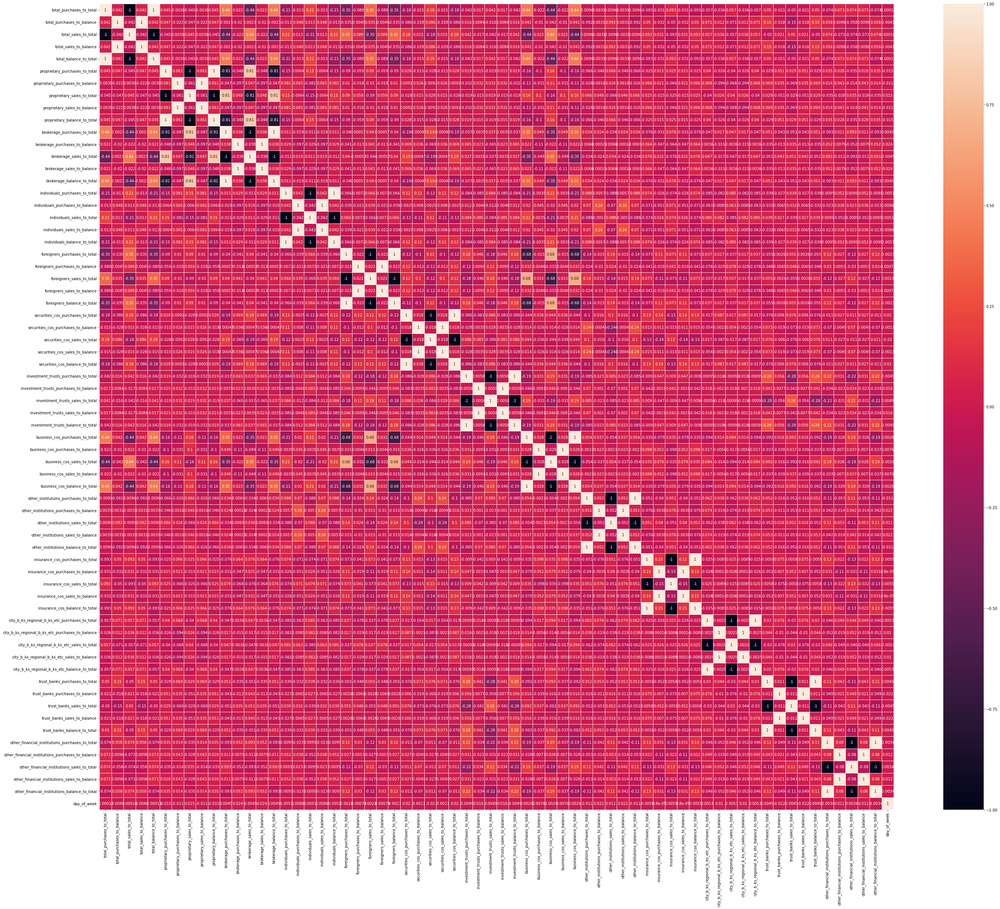

In [109]:
corrMatrix = trades.corr()
fig, ax = plt.subplots(figsize = (48, 40))
sns.heatmap(corrMatrix, annot=True, linewidths=.5, ax=ax)
fig.show()

## Script

In [59]:
def preprocess_trades(trades: pd.DataFrame):
    trades = trades.rename({'CityBKsRegionalBKsEtcPurchase': 'CityBKsRegionalBKsEtcPurchases'}, axis=1)
    trades = trades.dropna()
    trades = trades.drop(['StartDate', 'EndDate', 'Section'], axis=1)
    trades = trades.groupby('Date').sum()

    sales_columns = trades.columns[trades.columns.str.endswith('Sales')]
    purch_columns = trades.columns[trades.columns.str.endswith('Purchases')]
    balance_columns = trades.columns[trades.columns.str.endswith('Balance')]
    total_columns = trades.columns[trades.columns.str.endswith('Total')]

    saved_columns = []
    for sales, purch, balance, total in zip(sales_columns, purch_columns, balance_columns, total_columns):
        colname = camel_to_snake.sub('_', sales[:-5]).lower()
        purch_to_total = colname + '_purchases_to_total'
        purch_to_balance = colname + '_purchases_to_balance'
        sales_to_total = colname + '_sales_to_total'
        sales_to_balance = colname + '_sales_to_balance'
        balance_to_total = colname + '_balance_to_total'

        trades[purch_to_total] = trades[purch].div(trades[total])
        trades[purch_to_balance] = trades[purch].div(trades[balance])
        trades[sales_to_total] = trades[sales].div(trades[total])
        trades[sales_to_balance] = trades[sales].div(trades[baFlance])
        trades[balance_to_total] = trades[balance].div(trades[total])

        saved_columns += [purch_to_total, purch_to_balance, sales_to_total, sales_to_balance, balance_to_total]

    trades = trades.drop(chain(sales_columns, purch_columns, balance_columns, total_columns), axis=1)
    return trades.rename_axis('date')

In [60]:
trades = pd.read_csv(data_root / 'train_files/trades.csv', parse_dates=['Date', 'StartDate', 'EndDate'])
trades = preprocess_trades(trades)
trades

,total_purchases_to_total,total_purchases_to_balance,total_sales_to_total,total_sales_to_balance,total_balance_to_total,proprietary_purchases_to_total,proprietary_purchases_to_balance,proprietary_sales_to_total,proprietary_sales_to_balance,proprietary_balance_to_total,...,trust_banks_purchases_to_total,trust_banks_purchases_to_balance,trust_banks_sales_to_total,trust_banks_sales_to_balance,trust_banks_balance_to_total,other_financial_institutions_purchases_to_total,other_financial_institutions_purchases_to_balance,other_financial_institutions_sales_to_total,other_financial_institutions_sales_to_balance,other_financial_institutions_balance_to_total
date,,,,,,,,,,,,,,,,,,,,,
2017-01-13,0.500166,1507.046528,0.499834,1506.046528,0.000332,0.523508,11.134518,0.476492,10.134518,0.047017,...,0.458247,-5.487595,0.541753,-6.487595,-0.083506,0.493597,-38.542620,0.506403,-39.542620,-0.012807
2017-01-19,0.499958,-5967.532800,0.500042,-5968.532800,-0.000084,0.493367,-37.191151,0.506633,-38.191151,-0.013266,...,0.477045,-10.390736,0.522955,-11.390736,-0.045911,0.543445,6.254380,0.456555,5.254380,0.086890
2017-01-26,0.499962,-6622.669906,0.500038,-6623.669906,-0.000075,0.520027,12.983103,0.479973,11.983103,0.040054,...,0.539020,6.906966,0.460980,5.906966,0.078040,0.557169,4.873022,0.442831,3.873022,0.114337
2017-02-02,0.499977,-10727.023839,0.500023,-10728.023839,-0.000047,0.535597,7.523085,0.464403,6.523085,0.071194,...,0.541186,6.570020,0.458814,5.570020,0.082372,0.518643,13.910207,0.481357,12.910207,0.037285
2017-02-09,0.499808,-1304.373923,0.500192,-1305.373923,-0.000383,0.512457,20.568668,0.487543,19.568668,0.024914,...,0.461508,-5.994919,0.538492,-6.994919,-0.076983,0.596186,3.099130,0.403814,2.099130,0.192372
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-05,0.499937,-3949.543136,0.500063,-3950.543136,-0.000127,0.499247,-331.317848,0.500753,-332.317848,-0.001507,...,0.513268,19.342698,0.486732,18.342698,0.026535,0.484389,-15.514601,0.515611,-16.514601,-0.031222
2021-11-11,0.499700,-833.236840,0.500300,-834.236840,-0.000600,0.489373,-23.025424,0.510627,-24.025424,-0.021254,...,0.655720,2.105449,0.344280,1.105449,0.311439,0.564447,4.379127,0.435553,3.379127,0.128895
2021-11-18,0.499689,-804.573127,0.500311,-805.573127,-0.000621,0.488959,-22.143145,0.511041,-23.143145,-0.022082,...,0.560289,4.646681,0.439711,3.646681,0.120578,0.436069,-3.410496,0.563931,-4.410496,-0.127861


# Stock prices + secondary stocks

- Ratio metrics for our stock prices:
    1. Clusterize all the stocks (fist, second) by columns
        - NewMarketSegment
        - 33SectorCode
        - 33SectorName
        - 17SectorCode
        - 17SectorName
        - NewIndexSeriesSizeCode
        - NewIndexSeriesSize
    2. Make ratio metrics for each stock
        - Close
        - IssuedShares
        - MarketCapitalization
        - Universe0

## EDA

In [176]:
secondary_prices = pd.read_csv(data_root / 'train_files/secondary_stock_prices.csv', parse_dates = ['Date'])
secondary_prices = secondary_prices.drop(['AdjustmentFactor', 'SupervisionFlag', 'ExpectedDividend', 'RowId'], axis=1)
secondary_prices_full = secondary_prices.merge(stock_list, on='SecuritiesCode')
secondary_prices_full

,Date,SecuritiesCode,Open,High,Low,Close,Volume,Target,Section/Products,NewMarketSegment,33SectorName,17SectorName,NewIndexSeriesSize
0,2017-01-04,1305,1594.0,1618.0,1594.0,1615.0,538190,-0.001855,ETFs/ ETNs,NaN,-,-,-
1,2017-01-05,1305,1620.0,1621.0,1612.0,1617.0,467060,-0.005576,ETFs/ ETNs,NaN,-,-,-
2,2017-01-06,1305,1602.0,1617.0,1600.0,1614.0,137160,0.003738,ETFs/ ETNs,NaN,-,-,-
3,2017-01-10,1305,1614.0,1619.0,1601.0,1605.0,208840,-0.008690,ETFs/ ETNs,NaN,-,-,-
4,2017-01-11,1305,1610.0,1614.0,1607.0,1611.0,375240,0.005636,ETFs/ ETNs,NaN,-,-,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2384570,2021-12-01,4413,2300.0,2400.0,2023.0,2249.0,2329200,-0.043021,Mothers (Domestic),Growth Market,Information & Communication,"IT & SERVICES, OTHERS",-
2384571,2021-12-02,4413,2150.0,2300.0,2066.0,2185.0,690300,-0.069823,Mothers (Domestic),Growth Market,Information & Communication,"IT & SERVICES, OTHERS",-
2384572,2021-12-03,4413,2222.0,2274.0,2061.0,2091.0,812600,0.007712,Mothers (Domestic),Growth Market,Information & Communication,"IT & SERVICES, OTHERS",-
2384573,2021-12-02,7131,1113.0,1114.0,975.0,975.0,662500,-0.024038,JASDAQ(Standard / Domestic),Standard Market,Wholesale Trade,COMMERCIAL & WHOLESALE TRADE,-


In [177]:
%%time
secondary_prices_avg = secondary_prices_full.sort_values(by='Date')
secondary_prices_avg = secondary_prices_avg.set_index('Date').groupby(groupers[:-1]).rolling('7D').mean().reset_index()
secondary_prices_avg = secondary_prices_avg.drop('SecuritiesCode', axis=1).dropna(subset=['Close'])
secondary_prices_avg = secondary_prices_avg.set_index('Date').groupby(groupers[:-1]).resample('B').last().drop(groupers[:-1], axis=1).ffill()
secondary_prices_avg

CPU times: user 3.74 s, sys: 224 ms, total: 3.96 s
Wall time: 3.95 s


Open         High         Low       Close        Volume    Target
NewIndexSeriesSize NewMarketSegment Section/Products         33SectorName    17SectorName                  Date                                                                               
-                  Growth Market    JASDAQ(Growth/Domestic)  Chemicals       RAW MATERIALS & CHEMICALS     2017-01-04  540.000000   552.000000  535.000000  542.000000   8600.000000  0.003584
                                                                                                           2017-01-05  538.000000   555.000000  535.500000  550.000000  12450.000000  0.007149
                                                                                                           2017-01-06  541.333333   557.333333  539.333333  553.333333  14633.333333  0.000055
                                                                                                           2017-01-09  541.333333   557.333333  539.333333  553.333333  14633.333333  0.000055
                                                                                                           2017-01-10  550.000000   562.000000  543.500000  556.500000  15025.000000 -0.004887
...                                                                                                                           ...          ...         ...         ...           ...       ...
TOPIX Small 2      Standard Market  First Section (Domestic) Wholesale Trade COMMERCIAL & WHOLESALE TRADE  2021-11-29  997.638889  1004.166667  984.472222  989.259259  28891.666667 -0.009033
                                                                                                           2021-11-30  993.125926  1000.570370  978.748148  983.488889  28023.703704 -0.008994
                                                                                                           2021-12-01  983.762963   993.948148  970.785185  977.370370  29074.074074 -0.003724
                                                                                                           2021-12-02  976.703704   988.103704  961.874074  968.896296  27930.370370  0.000456
                                                                                                           2021-12-03  968.740741   982.525926  956.481481  964.970370  21574.814815  0.006408

[180861 rows x 6 columns]

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/ipykernel/__main__.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  app.launch_new_instance()


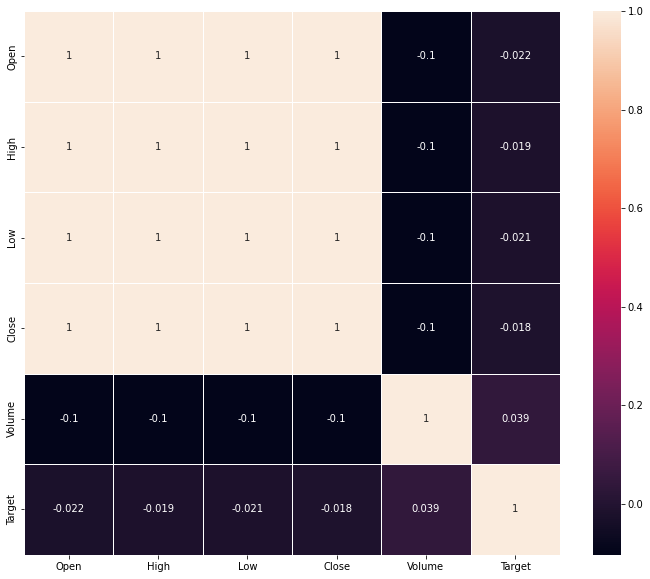

In [144]:
corrMatrix = secondary_prices_avg.corr()
fig, ax = plt.subplots(figsize = (12, 10))
sns.heatmap(corrMatrix, annot=True, linewidths=.5, ax=ax)
fig.show()

In [178]:
stock_prices = pd.read_csv(data_root / 'train_files/stock_prices.csv', parse_dates = ['Date'])
stock_prices = stock_prices.drop(['AdjustmentFactor', 'SupervisionFlag', 'ExpectedDividend'], axis=1)
stock_prices_full = stock_prices.merge(stock_list, on='SecuritiesCode')
stock_prices_full

,RowId,Date,SecuritiesCode,Open,High,Low,Close,Volume,Target,Section/Products,NewMarketSegment,33SectorName,17SectorName,NewIndexSeriesSize
0,20170104_1301,2017-01-04,1301,2734.0,2755.0,2730.0,2742.0,31400,0.000730,First Section (Domestic),Prime Market,"Fishery, Agriculture and Forestry",FOODS,TOPIX Small 2
1,20170105_1301,2017-01-05,1301,2743.0,2747.0,2735.0,2738.0,17900,0.002920,First Section (Domestic),Prime Market,"Fishery, Agriculture and Forestry",FOODS,TOPIX Small 2
2,20170106_1301,2017-01-06,1301,2734.0,2744.0,2720.0,2740.0,19900,-0.001092,First Section (Domestic),Prime Market,"Fishery, Agriculture and Forestry",FOODS,TOPIX Small 2
3,20170110_1301,2017-01-10,1301,2745.0,2754.0,2735.0,2748.0,24200,-0.005100,First Section (Domestic),Prime Market,"Fishery, Agriculture and Forestry",FOODS,TOPIX Small 2
4,20170111_1301,2017-01-11,1301,2748.0,2752.0,2737.0,2745.0,9300,-0.003295,First Section (Domestic),Prime Market,"Fishery, Agriculture and Forestry",FOODS,TOPIX Small 2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2332526,20211129_4169,2021-11-29,4169,6970.0,7350.0,6970.0,6970.0,772500,0.009972,Mothers (Domestic),Growth Market,Information & Communication,"IT & SERVICES, OTHERS",-
2332527,20211130_4169,2021-11-30,4169,6770.0,7240.0,6410.0,7020.0,887400,0.060649,Mothers (Domestic),Growth Market,Information & Communication,"IT & SERVICES, OTHERS",-
2332528,20211201_4169,2021-12-01,4169,7190.0,7380.0,6670.0,7090.0,496800,-0.039894,Mothers (Domestic),Growth Market,Information & Communication,"IT & SERVICES, OTHERS",-
2332529,20211202_4169,2021-12-02,4169,7160.0,7870.0,7110.0,7520.0,783000,-0.127424,Mothers (Domestic),Growth Market,Information & Communication,"IT & SERVICES, OTHERS",-


In [179]:
%%time
stock_prices_avg = stock_prices_full.sort_values(by='Date')
stock_prices_avg = stock_prices_avg.groupby(groupers).mean()
stock_prices_avg = stock_prices_avg.drop_duplicates()
stock_prices_avg = stock_prices_avg.drop('SecuritiesCode', axis=1)
stock_prices_avg = stock_prices_avg.dropna(subset=['Close'])

CPU times: user 1.06 s, sys: 112 ms, total: 1.17 s
Wall time: 1.17 s


In [147]:
stock_prices_avg

Open    High     Low   Close    Volume    Target
NewIndexSeriesSize NewMarketSegment Section/Products         33SectorName    17SectorName                  Date                                                          
-                  Growth Market    JASDAQ(Growth/Domestic)  Chemicals       RAW MATERIALS & CHEMICALS     2017-01-04   431.0   434.0   429.0   433.0  247100.0 -0.006834
                                                                                                           2017-01-05   433.0   440.0   431.0   439.0  401500.0 -0.002294
                                                                                                           2017-01-06   435.0   439.0   434.0   436.0  312100.0 -0.004598
                                                                                                           2017-01-10   439.0   439.0   431.0   435.0  413900.0 -0.011547
                                                                                                           2017-01-11   437.0   438.0   432.0   433.0  294200.0 -0.002336
...                                                                                                                       ...     ...     ...     ...       ...       ...
TOPIX Small 2      Standard Market  First Section (Domestic) Wholesale Trade COMMERCIAL & WHOLESALE TRADE  2021-11-29  2020.5  2039.3  1995.1  2003.2   35010.0  0.004218
                                                                                                           2021-11-30  2013.6  2046.2  1988.7  1993.7   45310.0  0.000757
                                                                                                           2021-12-01  1992.1  2018.2  1985.3  2000.5   53520.0  0.020549
                                                                                                           2021-12-02  1996.7  2026.1  1989.7  2000.0   37640.0 -0.002112
                                                                                                           2021-12-03  2008.3  2033.8  2006.2  2030.5   24710.0  0.024130

[266644 rows x 6 columns]

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/ipykernel/__main__.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  app.launch_new_instance()


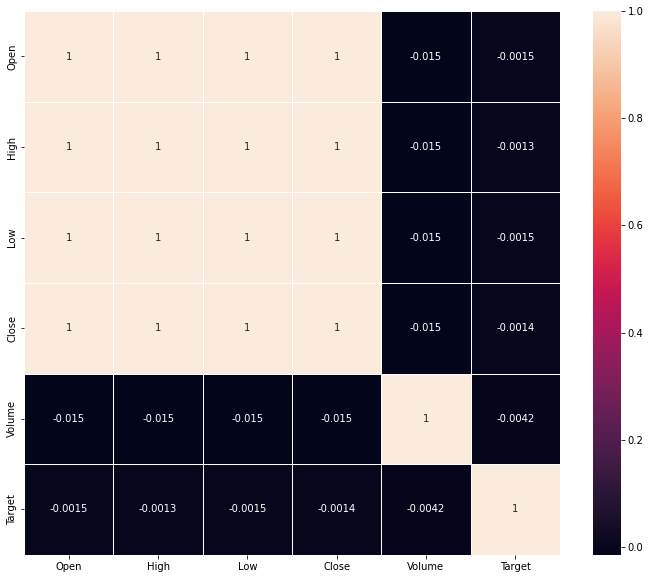

In [148]:
corrMatrix = stock_prices_avg.corr()
fig, ax = plt.subplots(figsize = (12, 10))
sns.heatmap(corrMatrix, annot=True, linewidths=.5, ax=ax)
fig.show()

In [180]:
groupers

['NewIndexSeriesSize',
 'NewMarketSegment',
 'Section/Products',
 '33SectorName',
 '17SectorName',
 'Date']

CPU times: user 2.63 s, sys: 497 ms, total: 3.13 s
Wall time: 2.85 s


<AxesSubplot:xlabel='date'>

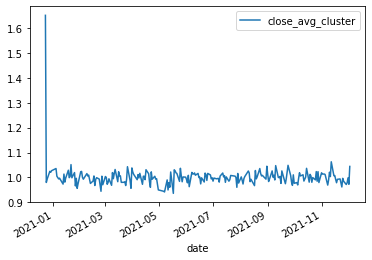

In [185]:
%%time
stock_prices_merged = stock_prices_full.merge(
    stock_prices_avg,
    on=groupers,
    how='left',
    suffixes=('', '_avg_cluster'),
)
stock_prices_merged = stock_prices_merged.merge(
    secondary_prices_avg,
    on=groupers,
    how='left',
    suffixes=('', '_avg_2nd_cluster'),
)

stock_prices_merged = stock_prices_merged.set_index(['Date', 'SecuritiesCode']).drop(columns='RowId')

numeric_cols = stock_prices_merged.select_dtypes(include=np.number).columns
divided_cols = numeric_cols[~numeric_cols.str.contains('target')]
stock_prices_merged[divided_cols] = stock_prices_merged[divided_cols].div(stock_prices_merged.groupby(groupers[:-1])[divided_cols].shift(1).bfill())

stock_prices_merged = stock_prices_merged.reset_index().rename(columns=lambda x: camel_to_snake.sub('_', x).lower()).set_index(['date', 'securities_code'])
stock_prices_merged.xs(4169, level='securities_code').plot(y='close_avg_cluster')

In [186]:
%%time

column_names = ['open', 'high', 'low', 'close', 'volume']
for name in column_names:
    cols_with_name = stock_prices_merged.columns.str.startswith(name)
    
    suffixed_cols = stock_prices_merged.columns.str.contains('_')
    divisor_cols = stock_prices_merged.columns[cols_with_name & suffixed_cols]
    print('divisor_cols', divisor_cols)
    
    for divisor in divisor_cols:
        stock_prices_merged.loc[:, divisor] = stock_prices_merged[name].div(stock_prices_merged[divisor], axis=0)

divisor_cols Index(['open_avg_cluster', 'open_avg_2nd_cluster'], dtype='object')
divisor_cols Index(['high_avg_cluster', 'high_avg_2nd_cluster'], dtype='object')
divisor_cols Index(['low_avg_cluster', 'low_avg_2nd_cluster'], dtype='object')
divisor_cols Index(['close_avg_cluster', 'close_avg_2nd_cluster'], dtype='object')
divisor_cols Index(['volume_avg_cluster', 'volume_avg_2nd_cluster'], dtype='object')
CPU times: user 58.5 s, sys: 882 ms, total: 59.4 s
Wall time: 59.4 s


Эта штука медленная пиздец

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/ipykernel/__main__.py:4: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  app.launch_new_instance()


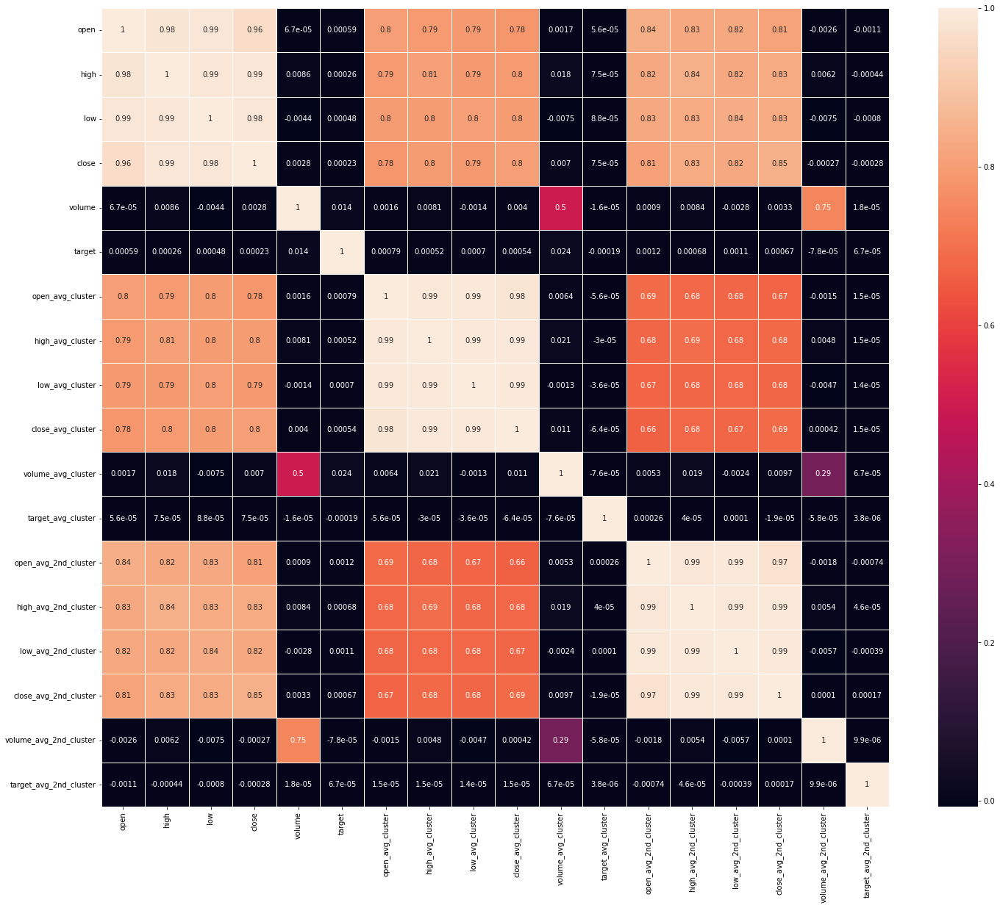

In [203]:
corrMatrix = stock_prices.corr()
fig, ax = plt.subplots(figsize = (24, 20))
sns.heatmap(corrMatrix, annot=True, linewidths=.5, ax=ax)
fig.show()

## Script

In [112]:
def preprocess_prices(stock_prices: pd.DataFrame, secondary_prices: pd.DataFrame):
    stock_prices = stock_prices.sort_values(by='Date')
    secondary_prices = secondary_prices.sort_values(by='Date')
    
    secondary_prices = secondary_prices.drop(['AdjustmentFactor', 'SupervisionFlag', 'ExpectedDividend', 'RowId'], axis=1)
    secondary_prices_full = secondary_prices.merge(stock_list, on='SecuritiesCode')

    secondary_prices_avg = secondary_prices_full.set_index('Date').groupby(groupers[:-1]).rolling('7D').mean().reset_index()
    secondary_prices_avg = secondary_prices_avg.drop('SecuritiesCode', axis=1).dropna(subset=['Close'])

    stock_prices = stock_prices.drop(['AdjustmentFactor', 'SupervisionFlag', 'ExpectedDividend'], axis=1)
    stock_prices_full = stock_prices.merge(stock_list, on='SecuritiesCode')

    stock_prices_avg = stock_prices_full.groupby(groupers).mean()
    stock_prices_avg = stock_prices_avg.drop_duplicates()
    stock_prices_avg = stock_prices_avg.drop('SecuritiesCode', axis=1)
    stock_prices_avg = stock_prices_avg.dropna(subset=['Close'])

    stock_prices_merged = stock_prices_full.merge(
        stock_prices_avg,
        on=groupers,
        how='left',
        suffixes=('', '_avg_cluster'),
    )
    stock_prices_merged = stock_prices_merged.merge(
        secondary_prices_avg,
        on=groupers,
        how='left',
        suffixes=('', '_avg_2nd_cluster'),
    )
    stock_prices_merged[secondary_prices_avg.columns] = stock_prices_merged.groupby(['SecuritiesCode'])[secondary_prices_avg.columns].ffill()
    stock_prices_merged = stock_prices_merged.set_index(['Date', 'SecuritiesCode']).drop(columns='RowId')

    numeric_cols = stock_prices_merged.select_dtypes(include=np.number).columns
    divided_cols = numeric_cols[~numeric_cols.str.contains('target')]
    stock_prices_merged[divided_cols] = stock_prices_merged[divided_cols].div(stock_prices_merged.groupby(groupers[:-1])[divided_cols].shift(1).bfill())

    stock_prices_merged = stock_prices_merged.reset_index().rename(columns=lambda x: camel_to_snake.sub('_', x).lower()).set_index(['date', 'securities_code'])


    column_names = ['open', 'high', 'low', 'close', 'volume']
    for name in column_names:
        cols_with_name = stock_prices_merged.columns.str.startswith(name)

        suffixed_cols = stock_prices_merged.columns.str.contains('_')
        divisor_cols = stock_prices_merged.columns[cols_with_name & suffixed_cols]

        for divisor in divisor_cols:
            stock_prices_merged.loc[:, divisor] = stock_prices_merged[name].div(stock_prices_merged[divisor], axis=0)
    return stock_prices_merged

In [113]:
%%time
secondary_prices = pd.read_csv(data_root / 'train_files/secondary_stock_prices.csv', parse_dates = ['Date'])
stock_prices = pd.read_csv(data_root / 'train_files/stock_prices.csv', parse_dates = ['Date'])

stock_prices = preprocess_prices(stock_prices, secondary_prices)
stock_prices

KeyboardInterrupt: 

# Join features

In [309]:
%%time
features = (stock_prices.reset_index()
            .merge(trades, on='date', how='left')
            .merge(financials, on=['securities_code', 'date'], how='left')
            .merge(options, on='date', how='left')
            .set_index(['date', 'securities_code'])
            )
features['day_of_week'] = features.index.get_level_values('date').dayofweek
features

CPU times: user 4 s, sys: 1.82 s, total: 5.82 s
Wall time: 5.81 s


,,open,high,low,close,volume,target,section/_products,new_market_segment,33_sector_name,17_sector_name,new_index_series_size,open_avg_cluster,high_avg_cluster,low_avg_cluster,close_avg_cluster,volume_avg_cluster,target_avg_cluster,open_avg_2nd_cluster,high_avg_2nd_cluster,low_avg_2nd_cluster,close_avg_2nd_cluster,volume_avg_2nd_cluster,target_avg_2nd_cluster,total_purchases_to_total,total_purchases_to_balance,total_sales_to_total,total_sales_to_balance,total_balance_to_total,proprietary_purchases_to_total,proprietary_purchases_to_balance,proprietary_sales_to_total,proprietary_sales_to_balance,proprietary_balance_to_total,brokerage_purchases_to_total,brokerage_purchases_to_balance,brokerage_sales_to_total,brokerage_sales_to_balance,brokerage_balance_to_total,individuals_purchases_to_total,individuals_purchases_to_balance,individuals_sales_to_total,individuals_sales_to_balance,individuals_balance_to_total,foreigners_purchases_to_total,foreigners_purchases_to_balance,foreigners_sales_to_total,foreigners_sales_to_balance,foreigners_balance_to_total,securities_cos_purchases_to_total,securities_cos_purchases_to_balance,securities_cos_sales_to_total,securities_cos_sales_to_balance,securities_cos_balance_to_total,investment_trusts_purchases_to_total,investment_trusts_purchases_to_balance,investment_trusts_sales_to_total,investment_trusts_sales_to_balance,investment_trusts_balance_to_total,business_cos_purchases_to_total,business_cos_purchases_to_balance,business_cos_sales_to_total,business_cos_sales_to_balance,business_cos_balance_to_total,other_institutions_purchases_to_total,other_institutions_purchases_to_balance,other_institutions_sales_to_total,other_institutions_sales_to_balance,other_institutions_balance_to_total,insurance_cos_purchases_to_total,insurance_cos_purchases_to_balance,insurance_cos_sales_to_total,insurance_cos_sales_to_balance,insurance_cos_balance_to_total,city_b_ks_regional_b_ks_etc_purchases_to_total,city_b_ks_regional_b_ks_etc_purchases_to_balance,city_b_ks_regional_b_ks_etc_sales_to_total,city_b_ks_regional_b_ks_etc_sales_to_balance,city_b_ks_regional_b_ks_etc_balance_to_total,trust_banks_purchases_to_total,trust_banks_purchases_to_balance,trust_banks_sales_to_total,trust_banks_sales_to_balance,trust_banks_balance_to_total,other_financial_institutions_purchases_to_total,other_financial_institutions_purchases_to_balance,other_financial_institutions_sales_to_total,other_financial_institutions_sales_to_balance,other_financial_institutions_balance_to_total,day_of_week,disclosure_number,current_period_end_date,type_of_current_period,net_sales,profit,earnings_per_share,total_assets,equity,equity_to_asset_ratio,book_value_per_share,result_dividend_per_share1st_quarter,result_dividend_per_share2nd_quarter,result_dividend_per_share3rd_quarter,result_dividend_per_share_fiscal_year_end,result_dividend_per_share_annual,forecast_dividend_per_share1st_quarter,forecast_dividend_per_share2nd_quarter,forecast_dividend_per_share3rd_quarter,forecast_dividend_per_share_annual,forecast_ordinary_profit,forecast_profit,forecast_earnings_per_share,material_changes_in_subsidiaries,changes_based_on_revisions_of_accounting_standard,changes_other_than_ones_based_on_revisions_of_accounting_standard,changes_in_accounting_estimates,retrospective_restatement,number_of_treasury_stock_at_the_end_of_fiscal_year,average_number_of_shares,is_nonconsolidated,is_consolidated,agency,is_correction,is_forecast,disclosure_number_cluster_avg,net_sales_cluster_avg,profit_cluster_avg,earnings_per_share_cluster_avg,total_assets_cluster_avg,equity_cluster_avg,equity_to_asset_ratio_cluster_avg,book_value_per_share_cluster_avg,result_dividend_per_share1st_quarter_cluster_avg,result_dividend_per_share2nd_quarter_cluster_avg,result_dividend_per_share3rd_quarter_cluster_avg,result_dividend_per_share_fiscal_year_end_cluster_avg,result_dividend_per_share_annual_cluster_avg,forecast_dividend_per_share1st_quarter_cluster_avg,forecast_dividend_per_share2nd_quarter_clus

# Combinatorial Purged Cross-Validation

In [14]:
from itertools import combinations

def cpcv_split(
    folds: int = 5,
    test_folds: int = 3,
    start_embargo: bool = True,
) -> dict:
    if test_folds > folds:
        raise ValueError('Test folds count should be smaller than overall folds.')
    test_variants = list(combinations(range(folds), test_folds))
    
    splits = []
    for test_parts in test_variants:
        train_parts = list(set(range(folds)).difference(test_parts))
        parts = {k: 'test' for k in test_parts}
        
        if start_embargo:
            parts[-1] = 'embargo'
        parts.update({k: 'train' for k in train_parts})
        
        # embargo adding
        parts.update({k - 0.5: 'embargo' for k in test_parts})
        parts.update({k + 0.5: 'embargo' for k in test_parts})
        
        parts = dict(sorted(parts.items(), key=lambda item: item[0]))
        # reindex
        parts = {k: v for k, v in zip(range(len(parts)), parts.values())}

        purged_elements = []
        if parts[0] == 'embargo' and parts[1] == 'embargo':
            purged_elements = [0, 1] if parts[2] == 'embargo' else [0]

        left = 0
        while left < len(parts) - 2:
            if parts[left] == 'test' and parts[left + 1] == 'embargo' and parts[left + 2] == 'test':
                purged_elements.append(left + 1)
                left += 1
            left += 1
        
        if parts[len(parts) - 1] == 'embargo':
            purged_elements.append(len(parts) - 1)
        
        parts = {k: parts[k] for k in range(len(parts)) if k not in purged_elements}
        # reindex
        parts = {k: v for k, v in zip(range(len(parts)), parts.values())}
        splits.append(parts)
    return splits

In [15]:
def cpcv(
    timeline: pd.DatetimeIndex,
    embargo_size: pd.Timedelta = pd.Timedelta(days=30),
    folds: int = 5,
    test_folds: int = 3,
    start_embargo: bool = True,
):
    split_dicts = cpcv_split(folds, test_folds, start_embargo)
    print(f'splits count: {len(split_dicts)}\n')
    splits = []
    for idx, split in enumerate(split_dicts):
        print(f'split number {idx}')
        embargo_delta = len(list(filter(lambda x: x == 'embargo', split.values()))) * embargo_size
        timeline_delta = np.timedelta64(max(timeline) - min(timeline), 'D')

        if embargo_delta > timeline_delta:
            raise ValueError('Embargo is greater than the whole timeline!\n',
                             f'emb: {embargo_delta}, timeline delta: {timeline_delta}.'
                             )
        fold_size = np.timedelta64((timeline_delta - embargo_delta) // folds, 'D')
        print(f'fold size: {fold_size}')

        if fold_size < pd.Timedelta(days=30):
            raise ValueError('Fold size is less than 30 days!\n',
                             f'fold size: {fold_size}'
                             )

        timedeltas = []
        prev_timedelta = pd.Timedelta(days=0)
        for count, value in split.items():
            delta = fold_size if value in {'test', 'train'} else embargo_size
            timedeltas.append(delta + prev_timedelta)
            prev_timedelta += delta

        splits.append((timedeltas, list(split.values())))
    return splits

In [275]:
cpcv(stock_prices.index.get_level_values(0), test_folds=2)

splits count: 10

split number 0
fold size: 346 days
split number 1
fold size: 334 days
split number 2
fold size: 334 days
split number 3
fold size: 340 days
split number 4
fold size: 340 days
split number 5
fold size: 328 days
split number 6
fold size: 334 days
split number 7
fold size: 340 days
split number 8
fold size: 334 days
split number 9
fold size: 346 days


[([Timedelta('30 days 00:00:00'),
   Timedelta('376 days 00:00:00'),
   Timedelta('722 days 00:00:00'),
   Timedelta('752 days 00:00:00'),
   Timedelta('1098 days 00:00:00'),
   Timedelta('1444 days 00:00:00'),
   Timedelta('1790 days 00:00:00')],
  ['embargo', 'test', 'test', 'embargo', 'train', 'train', 'train']),
 ([Timedelta('30 days 00:00:00'),
   Timedelta('364 days 00:00:00'),
   Timedelta('394 days 00:00:00'),
   Timedelta('728 days 00:00:00'),
   Timedelta('758 days 00:00:00'),
   Timedelta('1092 days 00:00:00'),
   Timedelta('1122 days 00:00:00'),
   Timedelta('1456 days 00:00:00'),
   Timedelta('1790 days 00:00:00')],
  ['embargo',
   'test',
   'embargo',
   'train',
   'embargo',
   'test',
   'embargo',
   'train',
   'train']),
 ([Timedelta('30 days 00:00:00'),
   Timedelta('364 days 00:00:00'),
   Timedelta('394 days 00:00:00'),
   Timedelta('728 days 00:00:00'),
   Timedelta('1062 days 00:00:00'),
   Timedelta('1092 days 00:00:00'),
   Timedelta('1426 days 00:00:00'),


In [16]:
def get_cpcv_timelines(
    timeline: pd.DatetimeIndex,
    embargo_size: pd.Timedelta = pd.Timedelta(days=30),
    folds: int = 5,
    test_folds: int = 3,
    start_embargo: bool = True,
    ):
    min_date = timeline.min()
    splits = cpcv(timeline, embargo_size, folds, test_folds, start_embargo)
#     print("splits", splits)

    timelines = []
    for deltas, names in splits:
        deltas_cp = deltas[:]
        deltas_cp.insert(0, pd.Timedelta(days=0))
        left, right = 0, 1
        pairs = []
        while right < len(deltas_cp):
            pairs.append((min_date + deltas_cp[left], min_date + deltas_cp[right] - pd.Timedelta(days=1)))
            left += 1
            right += 1
        timelines.append((pairs, names))
    return timelines

In [17]:
def get_train_test_cpcv(timeline: tuple, indices: pd.DatetimeIndex):
    train_idx = pd.DatetimeIndex([])
    test_idx = pd.DatetimeIndex([])
    for starts_stops, name in zip(*timeline):
        if name == 'train':
            train_idx = train_idx.append(indices.intersection(pd.bdate_range(*starts_stops)))
        elif name == 'test':
            test_idx = test_idx.append(indices.intersection(pd.bdate_range(*starts_stops)))
    return train_idx, test_idx

In [290]:
%%time

timelines = get_cpcv_timelines(stock_prices.index.get_level_values(0), folds=7, test_folds=3)

splits count: 35

split number 0
fold size: 247 days
split number 1
fold size: 239 days
split number 2
fold size: 239 days
split number 3
fold size: 239 days
split number 4
fold size: 243 days
split number 5
fold size: 239 days
split number 6
fold size: 230 days
split number 7
fold size: 230 days
split number 8
fold size: 234 days
split number 9
fold size: 239 days
split number 10
fold size: 230 days
split number 11
fold size: 234 days
split number 12
fold size: 239 days
split number 13
fold size: 234 days
split number 14
fold size: 243 days
split number 15
fold size: 243 days
split number 16
fold size: 234 days
split number 17
fold size: 234 days
split number 18
fold size: 239 days
split number 19
fold size: 234 days
split number 20
fold size: 226 days
split number 21
fold size: 230 days
split number 22
fold size: 234 days
split number 23
fold size: 230 days
split number 24
fold size: 239 days
split number 25
fold size: 243 days
split number 26
fold size: 234 days
split number 27
fold

In [293]:
from pprint import pprint

train_test_idx = list(map(get_train_test_cpcv, timelines))
pprint(train_test_idx[0])

(DatetimeIndex(['2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29',
               ...
               '2021-11-15', '2021-11-16', '2021-11-17', '2021-11-18', '2021-11-19', '2021-11-22', '2021-11-23', '2021-11-24', '2021-11-25', '2021-11-26'], dtype='datetime64[ns]', length=705, freq='B'),
 DatetimeIndex(['2017-02-03', '2017-02-06', '2017-02-07', '2017-02-08', '2017-02-09', '2017-02-10', '2017-02-13', '2017-02-14', '2017-02-15', '2017-02-16',
               ...
               '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13'], dtype='datetime64[ns]', length=529, freq='B'))


ух сука работает

# Split train & test folds

In [325]:
features.sample(5)

,,open,high,low,close,volume,target,section/_products,new_market_segment,33_sector_name,17_sector_name,new_index_series_size,open_avg_cluster,high_avg_cluster,low_avg_cluster,close_avg_cluster,volume_avg_cluster,target_avg_cluster,open_avg_2nd_cluster,high_avg_2nd_cluster,low_avg_2nd_cluster,close_avg_2nd_cluster,volume_avg_2nd_cluster,target_avg_2nd_cluster,total_purchases_to_total,total_purchases_to_balance,total_sales_to_total,total_sales_to_balance,total_balance_to_total,proprietary_purchases_to_total,proprietary_purchases_to_balance,proprietary_sales_to_total,proprietary_sales_to_balance,proprietary_balance_to_total,brokerage_purchases_to_total,brokerage_purchases_to_balance,brokerage_sales_to_total,brokerage_sales_to_balance,brokerage_balance_to_total,individuals_purchases_to_total,individuals_purchases_to_balance,individuals_sales_to_total,individuals_sales_to_balance,individuals_balance_to_total,foreigners_purchases_to_total,foreigners_purchases_to_balance,foreigners_sales_to_total,foreigners_sales_to_balance,foreigners_balance_to_total,securities_cos_purchases_to_total,securities_cos_purchases_to_balance,securities_cos_sales_to_total,securities_cos_sales_to_balance,securities_cos_balance_to_total,investment_trusts_purchases_to_total,investment_trusts_purchases_to_balance,investment_trusts_sales_to_total,investment_trusts_sales_to_balance,investment_trusts_balance_to_total,business_cos_purchases_to_total,business_cos_purchases_to_balance,business_cos_sales_to_total,business_cos_sales_to_balance,business_cos_balance_to_total,other_institutions_purchases_to_total,other_institutions_purchases_to_balance,other_institutions_sales_to_total,other_institutions_sales_to_balance,other_institutions_balance_to_total,insurance_cos_purchases_to_total,insurance_cos_purchases_to_balance,insurance_cos_sales_to_total,insurance_cos_sales_to_balance,insurance_cos_balance_to_total,city_b_ks_regional_b_ks_etc_purchases_to_total,city_b_ks_regional_b_ks_etc_purchases_to_balance,city_b_ks_regional_b_ks_etc_sales_to_total,city_b_ks_regional_b_ks_etc_sales_to_balance,city_b_ks_regional_b_ks_etc_balance_to_total,trust_banks_purchases_to_total,trust_banks_purchases_to_balance,trust_banks_sales_to_total,trust_banks_sales_to_balance,trust_banks_balance_to_total,other_financial_institutions_purchases_to_total,other_financial_institutions_purchases_to_balance,other_financial_institutions_sales_to_total,other_financial_institutions_sales_to_balance,other_financial_institutions_balance_to_total,day_of_week,disclosure_number,current_period_end_date,type_of_current_period,net_sales,profit,earnings_per_share,total_assets,equity,equity_to_asset_ratio,book_value_per_share,result_dividend_per_share1st_quarter,result_dividend_per_share2nd_quarter,result_dividend_per_share3rd_quarter,result_dividend_per_share_fiscal_year_end,result_dividend_per_share_annual,forecast_dividend_per_share1st_quarter,forecast_dividend_per_share2nd_quarter,forecast_dividend_per_share3rd_quarter,forecast_dividend_per_share_annual,forecast_ordinary_profit,forecast_profit,forecast_earnings_per_share,material_changes_in_subsidiaries,changes_based_on_revisions_of_accounting_standard,changes_other_than_ones_based_on_revisions_of_accounting_standard,changes_in_accounting_estimates,retrospective_restatement,number_of_treasury_stock_at_the_end_of_fiscal_year,average_number_of_shares,is_nonconsolidated,is_consolidated,agency,is_correction,is_forecast,disclosure_number_cluster_avg,net_sales_cluster_avg,profit_cluster_avg,earnings_per_share_cluster_avg,total_assets_cluster_avg,equity_cluster_avg,equity_to_asset_ratio_cluster_avg,book_value_per_share_cluster_avg,result_dividend_per_share1st_quarter_cluster_avg,result_dividend_per_share2nd_quarter_cluster_avg,result_dividend_per_share3rd_quarter_cluster_avg,result_dividend_per_share_fiscal_year_end_cluster_avg,result_dividend_per_share_annual_cluster_avg,forecast_dividend_per_share1st_quarter_cluster_avg,forecast_dividend_per_share2nd_quarter_clus

In [323]:
first_train = features.loc(axis=0)[features.index.get_level_values(0).intersection(train_test_idx[0][0])]

In [324]:
first_test = features.loc(axis=0)[features.index.get_level_values(0).intersection(train_test_idx[0][1])]

# Whole pipeline

In [1]:
BAD_COLS = ['material_changes_in_subsidiaries',
 'changes_based_on_revisions_of_accounting_standard',
 'changes_other_than_ones_based_on_revisions_of_accounting_standard',
 'changes_in_accounting_estimates',
 'retrospective_restatement',
 'forecast_dividend_per_share1st_quarter_cluster_avg',
 'puts_close_0d',
 'puts_close_30d',
 'puts_volume_0d',
 'puts_volume_30d',
 'brokerage_balance_to_total_prev_day_ratio',
 'brokerage_purchases_to_balance_prev_day_ratio',
 'brokerage_purchases_to_total_prev_day_ratio',
 'brokerage_sales_to_balance_prev_day_ratio',
 'brokerage_sales_to_total_prev_day_ratio',
 'business_cos_balance_to_total_prev_day_ratio',
 'business_cos_purchases_to_balance_prev_day_ratio',
 'business_cos_purchases_to_total_prev_day_ratio',
 'business_cos_sales_to_balance_prev_day_ratio',
 'business_cos_sales_to_total_prev_day_ratio',
 'city_b_ks_regional_b_ks_etc_balance_to_total_prev_day_ratio',
 'city_b_ks_regional_b_ks_etc_purchases_to_balance_prev_day_ratio',
 'city_b_ks_regional_b_ks_etc_purchases_to_total_prev_day_ratio',
 'city_b_ks_regional_b_ks_etc_sales_to_balance_prev_day_ratio',
 'city_b_ks_regional_b_ks_etc_sales_to_total_prev_day_ratio',
 'forecast_dividend_per_share1st_quarter_cluster_avg_prev_day_ratio',
 'foreigners_balance_to_total_prev_day_ratio',
 'foreigners_purchases_to_balance_prev_day_ratio',
 'foreigners_purchases_to_total_prev_day_ratio',
 'foreigners_sales_to_balance_prev_day_ratio',
 'foreigners_sales_to_total_prev_day_ratio',
 'individuals_balance_to_total_prev_day_ratio',
 'individuals_purchases_to_balance_prev_day_ratio',
 'individuals_purchases_to_total_prev_day_ratio',
 'individuals_sales_to_balance_prev_day_ratio',
 'individuals_sales_to_total_prev_day_ratio',
 'insurance_cos_balance_to_total_prev_day_ratio',
 'insurance_cos_purchases_to_balance_prev_day_ratio',
 'insurance_cos_purchases_to_total_prev_day_ratio',
 'insurance_cos_sales_to_balance_prev_day_ratio',
 'insurance_cos_sales_to_total_prev_day_ratio',
 'investment_trusts_balance_to_total_prev_day_ratio',
 'investment_trusts_purchases_to_balance_prev_day_ratio',
 'investment_trusts_purchases_to_total_prev_day_ratio',
 'investment_trusts_sales_to_balance_prev_day_ratio',
 'investment_trusts_sales_to_total_prev_day_ratio',
 'other_financial_institutions_balance_to_total_prev_day_ratio',
 'other_financial_institutions_purchases_to_balance_prev_day_ratio',
 'other_financial_institutions_purchases_to_total_prev_day_ratio',
 'other_financial_institutions_sales_to_balance_prev_day_ratio',
 'other_financial_institutions_sales_to_total_prev_day_ratio',
 'other_institutions_balance_to_total_prev_day_ratio',
 'other_institutions_purchases_to_balance_prev_day_ratio',
 'other_institutions_purchases_to_total_prev_day_ratio',
 'other_institutions_sales_to_balance_prev_day_ratio',
 'other_institutions_sales_to_total_prev_day_ratio',
 'proprietary_balance_to_total_prev_day_ratio',
 'proprietary_purchases_to_balance_prev_day_ratio',
 'proprietary_purchases_to_total_prev_day_ratio',
 'proprietary_sales_to_balance_prev_day_ratio',
 'proprietary_sales_to_total_prev_day_ratio',
 'puts_close_0d_prev_day_ratio',
 'puts_close_30d_prev_day_ratio',
 'puts_volume_0d_prev_day_ratio',
 'puts_volume_30d_prev_day_ratio',
 'securities_cos_balance_to_total_prev_day_ratio',
 'securities_cos_purchases_to_balance_prev_day_ratio',
 'securities_cos_purchases_to_total_prev_day_ratio',
 'securities_cos_sales_to_balance_prev_day_ratio',
 'securities_cos_sales_to_total_prev_day_ratio',
 'total_balance_to_total_prev_day_ratio',
 'total_purchases_to_balance_prev_day_ratio',
 'total_purchases_to_total_prev_day_ratio',
 'total_sales_to_balance_prev_day_ratio',
 'total_sales_to_total_prev_day_ratio',
 'trust_banks_balance_to_total_prev_day_ratio',
 'trust_banks_purchases_to_balance_prev_day_ratio',
 'trust_banks_purchases_to_total_prev_day_ratio',
 'trust_banks_sales_to_balance_prev_day_ratio',
 'trust_banks_sales_to_total_prev_day_ratio']

In [2]:
from preprocess import *
from pathlib import Path

In [3]:
def get_all_features(options, financials, trades, secondary_prices, stock_prices):
    index_selected = 1321
    index_cols = ['Date', 'Close', 'Volume']
    index_data = secondary_prices.loc[secondary_prices['SecuritiesCode'] == index_selected]
    index_data = index_data.loc[:, index_cols]
    options = preprocess_options(options, index_data)

    financials = preprocess_financials(financials)
    trades = preprocess_trades(trades)
    stock_prices = preprocess_prices(stock_prices, secondary_prices)
    features = (stock_prices.reset_index()
                .merge(trades, on='date', how='left')
                .merge(financials, on=['securities_code', 'date'], how='left')
                .merge(options, on='date', how='left')
                .set_index(['date', 'securities_code'])
                .sort_index()
                )
    fin_trades_cols = financials.columns.union(trades.columns).difference(['securities_code', 'date'])
    features[fin_trades_cols] = features.groupby(level=['date', 'securities_code'])[fin_trades_cols].ffill()

    # gonna shift them by one
    numeric_cols = features.select_dtypes(include=np.number).columns.difference(['target']).to_list()
    suff_num_cols = list(map(lambda x: x + '_prev_day_ratio', numeric_cols))
    features[suff_num_cols] = features[numeric_cols].div(features[numeric_cols].groupby(level=1).shift(1).bfill())
    bool_cols = ['is_nonconsolidated', 'is_consolidated', 'is_correction', 'is_forecast']
    features[bool_cols] = features[bool_cols].astype(bool)
    categorical_cols = features.select_dtypes('object').columns.to_list()
    features[categorical_cols] = features[categorical_cols].fillna('nan')
    features = features.drop(columns=BAD_COLS)
    features = features.replace([np.inf, -np.inf], np.nan)
    return features['2017-01-05':].dropna(subset=['target'])


def get_all_features_from_root(data_root):
    options = pd.read_csv(data_root / 'train_files/options.csv', parse_dates=['Date'])
    financials = pd.read_csv(data_root / 'train_files/financials.csv', parse_dates=['Date'])
    trades = pd.read_csv(data_root / 'train_files/trades.csv', parse_dates=['Date', 'StartDate', 'EndDate'])
    secondary_prices = pd.read_csv(data_root / 'train_files/secondary_stock_prices.csv', parse_dates = ['Date'])
    stock_prices = pd.read_csv(data_root / 'train_files/stock_prices.csv', parse_dates = ['Date'])
    return get_all_features(options, financials, trades, secondary_prices, stock_prices)

In [78]:
features['rank'].loc[('2021-12-02', 9684):('2021-12-03', 9684)]

date        securities_code
2021-12-02  9684               1871
            9687                371
            9692                252
            9697               1644
            9699               1582
                               ... 
2021-12-03  9663                645
            9672                196
            9678               1734
            9682               1652
            9684               1479
Name: rank, Length: 1920, dtype: int64

In [80]:
features.groupby(level='securities_code')['rank'].shift(1).loc[('2021-12-03', 9684)]#.columns[features.columns.str.contains('target')]

date        securities_code
2021-12-03  9684               1871.0
Name: rank, dtype: float64

In [4]:
%%time
data_root = Path('../data/')
features = get_all_features_from_root(data_root)
features

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/ipykernel/__main__.py:2: DtypeWarning: Columns (7,8,9,10) have mixed types.Specify dtype option on import or set low_memory=False.
  from ipykernel import kernelapp as app
/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/ipykernel/__main__.py:2: DtypeWarning: Columns (14,15,16,17,18,19,42,44) have mixed types.Specify dtype option on import or set low_memory=False.
  from ipykernel import kernelapp as app
/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/pandas/core/missing.py:94: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= arr == x


divisor_cols Index(['open_avg_cluster', 'open_avg_2nd_cluster'], dtype='object')
divisor_cols Index(['high_avg_cluster', 'high_avg_2nd_cluster'], dtype='object')
divisor_cols Index(['low_avg_cluster', 'low_avg_2nd_cluster'], dtype='object')
divisor_cols Index(['close_avg_cluster', 'close_avg_2nd_cluster'], dtype='object')
divisor_cols Index(['volume_avg_cluster', 'volume_avg_2nd_cluster'], dtype='object')


/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/pandas/core/frame.py:3641: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self[k1] = value[k2]


CPU times: user 1min 36s, sys: 10.1 s, total: 1min 46s
Wall time: 1min 42s


open      high       low     close    volume  \
date       securities_code                                                     
2017-01-05 1301             1.003292  0.997096  1.001832  0.998541  0.570064   
           1332             1.007042  0.994792  1.003552  0.994746  0.772878   
           1333             1.023810  1.017134  1.017516  1.012461  1.229321   
           1376             1.026490  1.018710  0.978146  0.992258  1.203540   
           1377             1.021407  1.001493  1.007645  0.992492  1.032493   
...                              ...       ...       ...       ...       ...   
2021-12-03 9990             0.992278  1.017341  1.011834  1.041420  0.403653   
           9991             1.006435  1.003793  1.009032  1.020566  0.770386   
           9993             1.010766  1.002967  0.996970  0.996970  1.043478   
           9994             1.020513  1.005877  1.017094  1.011431  0.706522   
           9997             1.013216  1.027457  1.008824  1.017544  1.111403   

                              target         section/_products  \
date       securities_code                                       
2017-01-05 1301             3.997080  First Section (Domestic)   
           1332            -1.834534  First Section (Domestic)   
           1333            -1.739297  First Section (Domestic)   
           1376             0.465444  First Section (Domestic)   
           1377             1.495475  First Section (Domestic)   
...                              ...                       ...   
2021-12-03 9990            -1.671180  First Section (Domestic)   
           9991            -2.247700  First Section (Domestic)   
           9993             0.393191  First Section (Domestic)   
           9994             0.749522  First Section (Domestic)   
           9997             1.281586  First Section (Domestic)   

                           new_market_segment  \
date       securities_code                      
2017-01-05 1301                  Prime Market   
           1332                  Prime Market   
           1333                  Prime Market   
           1376               Standard Market   
           1377                  Prime Market   
...                                       ...   
2021-12-03 9990                  Prime Market   
           9991                  Prime Market   
           9993               Standard Market   
           9994               Standard Market   
           9997                  Prime Market   

                                               33_sector_name  \
date       securities_code                                      
2017-01-05 1301             Fishery, Agriculture and Forestry   
           1332             Fishery, Agriculture and Forestry   
           1333             Fishery, Agriculture and Forestry   
           1376             Fishery, Agriculture and Forestry   
           1377             Fishery, Agriculture and Forestry   
...                                                       ...   
2021-12-03 9990                                  Retail Trade   
           9991                               Wholesale Trade   
           9993                                  Retail Trade   
           9994                                  Retail Trade   
           9997                                  Retail Trade   

                                           17_sector_name  ...  \
date       securities_code                                 ...   
2017-01-05 1301                                    FOODS   ...   
           1332                                    FOODS   ...   
           1333                                    FOODS   ...   
           1376                                    FOODS   ...   
           1377                                    FOODS   ...   
...                                                   ...  ...   
2021-12-03 9990                             RETAIL TRADE   ...   
           9991             COMMERCIAL & WHOLESALE TRA

In [5]:
%%time
indices = features.index.get_level_values(0)
timelines = get_cpcv_timelines(indices, folds=7, test_folds=3)
train_test_idx = list(map(lambda x: get_train_test_cpcv(x, indices), timelines))

# first_train = features.loc(axis=0)[train_test_idx[0][0]]
# first_test = features.loc(axis=0)[train_test_idx[0][1]]

splits count: 35

split number 0
fold size: 247 days
split number 1
fold size: 239 days
split number 2
fold size: 239 days
split number 3
fold size: 239 days
split number 4
fold size: 243 days
split number 5
fold size: 239 days
split number 6
fold size: 230 days
split number 7
fold size: 230 days
split number 8
fold size: 234 days
split number 9
fold size: 239 days
split number 10
fold size: 230 days
split number 11
fold size: 234 days
split number 12
fold size: 239 days
split number 13
fold size: 234 days
split number 14
fold size: 243 days
split number 15
fold size: 243 days
split number 16
fold size: 234 days
split number 17
fold size: 234 days
split number 18
fold size: 239 days
split number 19
fold size: 234 days
split number 20
fold size: 226 days
split number 21
fold size: 230 days
split number 22
fold size: 234 days
split number 23
fold size: 230 days
split number 24
fold size: 239 days
split number 25
fold size: 243 days
split number 26
fold size: 234 days
split number 27
fold

# EDA qlib

In [1]:
from functools import partial

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True, rc={"figure.dpi":300})

import qlib

from qlib.data.dataset.handler import DataHandlerLP
from qlib.data.dataset.loader import StaticDataLoader
from qlib.data.dataset import DatasetH
from qlib.contrib.model.pytorch_nn import DNNModelPytorch

from qlib.contrib.report.data.ana import CombFeaAna, FeaDistAna, FeaNanAnaRatio, FeaInfAna, FeaMeanStd, ValueCNT, FeaACAna, RawFeaAna

In [2]:
features_cp.index = features_cp.index.rename(names='datetime', level=0).rename(names='instrument', level=1)
dropped_cols = ['section/_products', 'new_market_segment', '33_sector_name', '17_sector_name', 'new_index_series_size', 'current_period_end_date', 'type_of_current_period', 'is_nonconsolidated', 'is_consolidated', 'agency', 'is_correction', 'is_forecast']
features_cp = features_cp.drop(columns=dropped_cols)

NameError: name 'features_cp' is not defined

In [ ]:
%%time
fa_full = CombFeaAna(features_cp, FeaDistAna, FeaMeanStd, partial(ValueCNT, ratio=True), FeaACAna)
fa_full.plot_all(sub_fs=(10, 4), col_n=5)#, wspace=0.5)

# Train models

check out [kaggle](https://www.kaggle.com/code/youngyang/qlibnaiveexample-en/notebook)

In [8]:
features['rank'] = features.groupby('date')['target'].rank().astype(int)
features = features.drop(columns='target')
features['mean_rank'] = features.groupby('date')['target']
features

open      high       low     close    volume  \
date       securities_code                                                     
2017-01-05 1301             1.003292  0.997096  1.001832  0.998541  0.570064   
           1332             1.007042  0.994792  1.003552  0.994746  0.772878   
           1333             1.023810  1.017134  1.017516  1.012461  1.229321   
           1376             1.026490  1.018710  0.978146  0.992258  1.203540   
           1377             1.021407  1.001493  1.007645  0.992492  1.032493   
...                              ...       ...       ...       ...       ...   
2021-12-03 9990             0.992278  1.017341  1.011834  1.041420  0.403653   
           9991             1.006435  1.003793  1.009032  1.020566  0.770386   
           9993             1.010766  1.002967  0.996970  0.996970  1.043478   
           9994             1.020513  1.005877  1.017094  1.011431  0.706522   
           9997             1.013216  1.027457  1.008824  1.017544  1.111403   

                                   section/_products new_market_segment  \
date       securities_code                                                
2017-01-05 1301             First Section (Domestic)       Prime Market   
           1332             First Section (Domestic)       Prime Market   
           1333             First Section (Domestic)       Prime Market   
           1376             First Section (Domestic)    Standard Market   
           1377             First Section (Domestic)       Prime Market   
...                                              ...                ...   
2021-12-03 9990             First Section (Domestic)       Prime Market   
           9991             First Section (Domestic)       Prime Market   
           9993             First Section (Domestic)    Standard Market   
           9994             First Section (Domestic)    Standard Market   
           9997             First Section (Domestic)       Prime Market   

                                               33_sector_name  \
date       securities_code                                      
2017-01-05 1301             Fishery, Agriculture and Forestry   
           1332             Fishery, Agriculture and Forestry   
           1333             Fishery, Agriculture and Forestry   
           1376             Fishery, Agriculture and Forestry   
           1377             Fishery, Agriculture and Forestry   
...                                                       ...   
2021-12-03 9990                                  Retail Trade   
           9991                               Wholesale Trade   
           9993                                  Retail Trade   
           9994                                  Retail Trade   
           9997                                  Retail Trade   

                                           17_sector_name  \
date       securities_code                                  
2017-01-05 1301                                    FOODS    
           1332                                    FOODS    
           1333                                    FOODS    
           1376                                    FOODS    
           1377                                    FOODS    
...                                                   ...   
2021-12-03 9990                             RETAIL TRADE    
           9991             COMMERCIAL & WHOLESALE TRADE    
           9993                             RETAIL TRADE    
           9994                             RETAIL TRADE    
           9997                             RETAIL TRADE    

                           new_index_series_size  ...  \
date       securities_code                        ...   
2017-01-05 1301                    TOPIX Small 2  ...   
           1332                     TOPIX Mid400  ...   
           1333                     TOPIX Mid400  ...   
           1376                    TOPIX Small 2  ...   
           1377                  

In [63]:
%%time
from tqdm.notebook import tqdm
from catboost import CatBoostRanker, Pool


categorical_cols = list(set(features.select_dtypes('object').columns).intersection(good_columns))# + ['securities_code']
cb_models = []
feature_importances = []
for train_idx, test_idx in tqdm(train_test_idx):
    model = CatBoostRanker(depth=6, iterations=1000, random_seed=42, task_type='GPU', loss_function='YetiRank')#, custom_metric=['YetiRank', 'QueryRMSE'])
    train_dataframe = features.loc(axis=0)[train_idx].swaplevel().sort_index()
    train_ts = train_dataframe.index.get_level_values('date').asi8
    train_weights = (train_ts - train_ts.min()) / (train_ts.max() - train_ts.min()) + 0.00001
    train_pool = Pool(
        train_dataframe.drop(columns='rank')[good_columns],
        label=train_dataframe['rank'],
        cat_features=categorical_cols,
        timestamp=train_ts,
        group_id=train_dataframe.index.get_level_values('securities_code').values,
        weight=train_weights,
    )

    eval_dataframe = features.loc(axis=0)[test_idx].swaplevel().sort_index()
    eval_ts = eval_dataframe.index.get_level_values('date').asi8
    eval_weights = (eval_ts - eval_ts.min()) / (eval_ts.max() - eval_ts.min()) + 0.00001
    eval_pool = Pool(
        eval_dataframe.drop(columns='rank')[good_columns],
        label=eval_dataframe['rank'],
        cat_features=categorical_cols,
        timestamp=eval_ts,
        group_id=eval_dataframe.index.get_level_values('securities_code').values,
        weight=eval_weights,
    )
    model.fit(train_pool, eval_set=eval_pool, verbose=50)
    
    feature_importances.append(model.get_feature_importance(data=eval_pool, prettified=True))
    cb_models.append(model)

  0%|          | 0/35 [00:00<?, ?it/s]

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8380883	best: 0.8380883 (0)	total: 124ms	remaining: 2m 3s
50:	test: 0.8568653	best: 0.8568653 (50)	total: 1.93s	remaining: 35.9s
100:	test: 0.8587376	best: 0.8589281 (80)	total: 3.73s	remaining: 33.2s
150:	test: 0.8588620	best: 0.8591382 (145)	total: 5.53s	remaining: 31.1s
200:	test: 0.8596432	best: 0.8596432 (200)	total: 7.33s	remaining: 29.2s
250:	test: 0.8587136	best: 0.8596432 (200)	total: 9.14s	remaining: 27.3s
300:	test: 0.8589152	best: 0.8596432 (200)	total: 10.9s	remaining: 25.4s
350:	test: 0.8584776	best: 0.8596432 (200)	total: 12.7s	remaining: 23.5s
400:	test: 0.8585384	best: 0.8596432 (200)	total: 14.5s	remaining: 21.7s
450:	test: 0.8575439	best: 0.8596432 (200)	total: 16.4s	remaining: 19.9s
500:	test: 0.8574012	best: 0.8596432 (200)	total: 18.2s	remaining: 18.1s
550:	test: 0.8564239	best: 0.8596432 (200)	total: 20s	remaining: 16.3s
600:	test: 0.8548997	best: 0.8596432 (200)	total: 21.8s	remaining: 14.5s
650:	test: 0.8547016	best: 0.8596432 (200)	total: 23.6s	rema

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8233848	best: 0.8233848 (0)	total: 117ms	remaining: 1m 57s
50:	test: 0.8469165	best: 0.8499312 (20)	total: 1.87s	remaining: 34.8s
100:	test: 0.8471911	best: 0.8499312 (20)	total: 3.62s	remaining: 32.2s
150:	test: 0.8482868	best: 0.8499312 (20)	total: 5.37s	remaining: 30.2s
200:	test: 0.8508678	best: 0.8531925 (195)	total: 7.12s	remaining: 28.3s
250:	test: 0.8501479	best: 0.8531925 (195)	total: 8.86s	remaining: 26.5s
300:	test: 0.8513690	best: 0.8531925 (195)	total: 10.6s	remaining: 24.6s
350:	test: 0.8517493	best: 0.8531925 (195)	total: 12.4s	remaining: 22.9s
400:	test: 0.8529564	best: 0.8531925 (195)	total: 14.1s	remaining: 21.1s
450:	test: 0.8512980	best: 0.8531925 (195)	total: 15.9s	remaining: 19.3s
500:	test: 0.8523521	best: 0.8531925 (195)	total: 17.6s	remaining: 17.5s
550:	test: 0.8527198	best: 0.8531925 (195)	total: 19.4s	remaining: 15.8s
600:	test: 0.8529243	best: 0.8531925 (195)	total: 21.1s	remaining: 14s
650:	test: 0.8532575	best: 0.8534774 (625)	total: 22.9s	rema

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8392396	best: 0.8392396 (0)	total: 119ms	remaining: 1m 58s
50:	test: 0.8562278	best: 0.8606378 (15)	total: 1.89s	remaining: 35.2s
100:	test: 0.8574104	best: 0.8607982 (70)	total: 3.64s	remaining: 32.4s
150:	test: 0.8593148	best: 0.8623660 (145)	total: 5.4s	remaining: 30.3s
200:	test: 0.8605449	best: 0.8623660 (145)	total: 7.15s	remaining: 28.4s
250:	test: 0.8582017	best: 0.8623660 (145)	total: 8.91s	remaining: 26.6s
300:	test: 0.8581619	best: 0.8623660 (145)	total: 10.7s	remaining: 24.8s
350:	test: 0.8584667	best: 0.8623660 (145)	total: 12.4s	remaining: 23s
400:	test: 0.8585209	best: 0.8623660 (145)	total: 14.2s	remaining: 21.2s
450:	test: 0.8591062	best: 0.8623660 (145)	total: 15.9s	remaining: 19.4s
500:	test: 0.8591428	best: 0.8623660 (145)	total: 17.7s	remaining: 17.6s
550:	test: 0.8592191	best: 0.8623660 (145)	total: 19.5s	remaining: 15.9s
600:	test: 0.8596086	best: 0.8623660 (145)	total: 21.2s	remaining: 14.1s
650:	test: 0.8598151	best: 0.8623660 (145)	total: 22.9s	rema

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8380326	best: 0.8380326 (0)	total: 125ms	remaining: 2m 4s
50:	test: 0.8540330	best: 0.8540330 (50)	total: 1.91s	remaining: 35.5s
100:	test: 0.8537351	best: 0.8547693 (55)	total: 3.66s	remaining: 32.6s
150:	test: 0.8533887	best: 0.8547693 (55)	total: 5.41s	remaining: 30.4s
200:	test: 0.8532380	best: 0.8547693 (55)	total: 7.15s	remaining: 28.4s
250:	test: 0.8527890	best: 0.8547693 (55)	total: 8.9s	remaining: 26.6s
300:	test: 0.8516486	best: 0.8547693 (55)	total: 10.6s	remaining: 24.7s
350:	test: 0.8517631	best: 0.8547693 (55)	total: 12.4s	remaining: 22.9s
400:	test: 0.8514750	best: 0.8547693 (55)	total: 14.1s	remaining: 21.1s
450:	test: 0.8518986	best: 0.8547693 (55)	total: 15.9s	remaining: 19.3s
500:	test: 0.8521089	best: 0.8547693 (55)	total: 17.6s	remaining: 17.6s
550:	test: 0.8520553	best: 0.8547693 (55)	total: 19.4s	remaining: 15.8s
600:	test: 0.8522072	best: 0.8547693 (55)	total: 21.1s	remaining: 14s
650:	test: 0.8521978	best: 0.8547693 (55)	total: 22.9s	remaining: 12.3s

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8295978	best: 0.8295978 (0)	total: 122ms	remaining: 2m 1s
50:	test: 0.8604294	best: 0.8623342 (45)	total: 1.91s	remaining: 35.6s
100:	test: 0.8619181	best: 0.8623342 (45)	total: 3.69s	remaining: 32.8s
150:	test: 0.8617672	best: 0.8623342 (45)	total: 5.46s	remaining: 30.7s
200:	test: 0.8616633	best: 0.8623342 (45)	total: 7.23s	remaining: 28.7s
250:	test: 0.8611137	best: 0.8623342 (45)	total: 9s	remaining: 26.9s
300:	test: 0.8615353	best: 0.8623342 (45)	total: 10.8s	remaining: 25s
350:	test: 0.8618016	best: 0.8623342 (45)	total: 12.5s	remaining: 23.2s
400:	test: 0.8618604	best: 0.8623342 (45)	total: 14.3s	remaining: 21.4s
450:	test: 0.8617263	best: 0.8623342 (45)	total: 16.1s	remaining: 19.6s
500:	test: 0.8611834	best: 0.8623342 (45)	total: 17.9s	remaining: 17.8s
550:	test: 0.8611219	best: 0.8623342 (45)	total: 19.6s	remaining: 16s
600:	test: 0.8609698	best: 0.8623342 (45)	total: 21.4s	remaining: 14.2s
650:	test: 0.8609618	best: 0.8623342 (45)	total: 23.2s	remaining: 12.4s
700

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8386943	best: 0.8386943 (0)	total: 120ms	remaining: 1m 59s
50:	test: 0.8531284	best: 0.8571241 (35)	total: 1.89s	remaining: 35.2s
100:	test: 0.8554517	best: 0.8571241 (35)	total: 3.64s	remaining: 32.4s
150:	test: 0.8567715	best: 0.8571241 (35)	total: 5.4s	remaining: 30.3s
200:	test: 0.8574858	best: 0.8574858 (200)	total: 7.15s	remaining: 28.4s
250:	test: 0.8577265	best: 0.8577265 (250)	total: 8.9s	remaining: 26.6s
300:	test: 0.8573891	best: 0.8577265 (250)	total: 10.7s	remaining: 24.7s
350:	test: 0.8574276	best: 0.8577265 (250)	total: 12.4s	remaining: 23s
400:	test: 0.8572893	best: 0.8577265 (250)	total: 14.2s	remaining: 21.2s
450:	test: 0.8572469	best: 0.8577265 (250)	total: 15.9s	remaining: 19.4s
500:	test: 0.8570476	best: 0.8577265 (250)	total: 17.7s	remaining: 17.6s
550:	test: 0.8574212	best: 0.8577265 (250)	total: 19.4s	remaining: 15.8s
600:	test: 0.8572936	best: 0.8577265 (250)	total: 21.2s	remaining: 14.1s
650:	test: 0.8562306	best: 0.8577265 (250)	total: 23s	remainin

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8382976	best: 0.8382976 (0)	total: 116ms	remaining: 1m 55s
50:	test: 0.8623311	best: 0.8626003 (45)	total: 1.83s	remaining: 34.1s
100:	test: 0.8626168	best: 0.8636445 (70)	total: 3.53s	remaining: 31.4s
150:	test: 0.8605451	best: 0.8636445 (70)	total: 5.23s	remaining: 29.4s
200:	test: 0.8600904	best: 0.8636445 (70)	total: 6.93s	remaining: 27.6s
250:	test: 0.8596867	best: 0.8636445 (70)	total: 8.63s	remaining: 25.8s
300:	test: 0.8607648	best: 0.8636445 (70)	total: 10.3s	remaining: 24s
350:	test: 0.8605714	best: 0.8636445 (70)	total: 12s	remaining: 22.3s
400:	test: 0.8600422	best: 0.8636445 (70)	total: 13.7s	remaining: 20.5s
450:	test: 0.8570702	best: 0.8636445 (70)	total: 15.4s	remaining: 18.8s
500:	test: 0.8572392	best: 0.8636445 (70)	total: 17.1s	remaining: 17.1s
550:	test: 0.8575839	best: 0.8636445 (70)	total: 18.8s	remaining: 15.4s
600:	test: 0.8573789	best: 0.8636445 (70)	total: 20.6s	remaining: 13.6s
650:	test: 0.8566520	best: 0.8636445 (70)	total: 22.3s	remaining: 11.9s

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8248842	best: 0.8248842 (0)	total: 115ms	remaining: 1m 55s
50:	test: 0.8562720	best: 0.8562720 (50)	total: 1.86s	remaining: 34.6s
100:	test: 0.8525860	best: 0.8562720 (50)	total: 3.56s	remaining: 31.7s
150:	test: 0.8523020	best: 0.8562720 (50)	total: 5.25s	remaining: 29.5s
200:	test: 0.8545027	best: 0.8562720 (50)	total: 6.95s	remaining: 27.6s
250:	test: 0.8543609	best: 0.8562720 (50)	total: 8.65s	remaining: 25.8s
300:	test: 0.8553262	best: 0.8562720 (50)	total: 10.3s	remaining: 24s
350:	test: 0.8556126	best: 0.8562720 (50)	total: 12.1s	remaining: 22.3s
400:	test: 0.8555876	best: 0.8562720 (50)	total: 13.8s	remaining: 20.6s
450:	test: 0.8556448	best: 0.8562720 (50)	total: 15.5s	remaining: 18.8s
500:	test: 0.8550368	best: 0.8562720 (50)	total: 17.2s	remaining: 17.1s
550:	test: 0.8549833	best: 0.8562720 (50)	total: 18.9s	remaining: 15.4s
600:	test: 0.8549943	best: 0.8562720 (50)	total: 20.6s	remaining: 13.7s
650:	test: 0.8549162	best: 0.8562720 (50)	total: 22.3s	remaining: 12s

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8432374	best: 0.8432374 (0)	total: 118ms	remaining: 1m 58s
50:	test: 0.8617675	best: 0.8617675 (50)	total: 1.86s	remaining: 34.7s
100:	test: 0.8634080	best: 0.8643777 (55)	total: 3.59s	remaining: 32s
150:	test: 0.8643910	best: 0.8645122 (115)	total: 5.32s	remaining: 29.9s
200:	test: 0.8646317	best: 0.8651122 (160)	total: 7.05s	remaining: 28s
250:	test: 0.8648095	best: 0.8651122 (160)	total: 8.8s	remaining: 26.2s
300:	test: 0.8647491	best: 0.8653543 (295)	total: 10.5s	remaining: 24.5s
350:	test: 0.8648650	best: 0.8657328 (305)	total: 12.3s	remaining: 22.7s
400:	test: 0.8649717	best: 0.8657328 (305)	total: 14s	remaining: 21s
450:	test: 0.8654678	best: 0.8657328 (305)	total: 15.8s	remaining: 19.2s
500:	test: 0.8654855	best: 0.8657832 (495)	total: 17.6s	remaining: 17.5s
550:	test: 0.8637037	best: 0.8657832 (495)	total: 19.3s	remaining: 15.7s
600:	test: 0.8624692	best: 0.8657832 (495)	total: 21s	remaining: 14s
650:	test: 0.8627555	best: 0.8657832 (495)	total: 22.8s	remaining: 12.

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8516297	best: 0.8516297 (0)	total: 121ms	remaining: 2m 1s
50:	test: 0.8660109	best: 0.8719459 (20)	total: 1.9s	remaining: 35.4s
100:	test: 0.8651371	best: 0.8719459 (20)	total: 3.67s	remaining: 32.6s
150:	test: 0.8653051	best: 0.8719459 (20)	total: 5.44s	remaining: 30.6s
200:	test: 0.8678320	best: 0.8719459 (20)	total: 7.23s	remaining: 28.7s
250:	test: 0.8684537	best: 0.8719459 (20)	total: 9.01s	remaining: 26.9s
300:	test: 0.8692564	best: 0.8719459 (20)	total: 10.8s	remaining: 25.1s
350:	test: 0.8670034	best: 0.8719459 (20)	total: 12.6s	remaining: 23.2s
400:	test: 0.8655222	best: 0.8719459 (20)	total: 14.3s	remaining: 21.4s
450:	test: 0.8658149	best: 0.8719459 (20)	total: 16.1s	remaining: 19.6s
500:	test: 0.8654867	best: 0.8719459 (20)	total: 17.9s	remaining: 17.8s
550:	test: 0.8639849	best: 0.8719459 (20)	total: 19.7s	remaining: 16s
600:	test: 0.8638370	best: 0.8719459 (20)	total: 21.4s	remaining: 14.2s
650:	test: 0.8645006	best: 0.8719459 (20)	total: 23.2s	remaining: 12.4s

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8393598	best: 0.8393598 (0)	total: 120ms	remaining: 1m 59s
50:	test: 0.8577998	best: 0.8586234 (35)	total: 1.86s	remaining: 34.6s
100:	test: 0.8588914	best: 0.8588914 (100)	total: 3.59s	remaining: 31.9s
150:	test: 0.8597191	best: 0.8597191 (150)	total: 5.32s	remaining: 29.9s
200:	test: 0.8594105	best: 0.8597191 (150)	total: 7.06s	remaining: 28.1s
250:	test: 0.8583634	best: 0.8597191 (150)	total: 8.79s	remaining: 26.2s
300:	test: 0.8586268	best: 0.8597191 (150)	total: 10.5s	remaining: 24.4s
350:	test: 0.8591497	best: 0.8597191 (150)	total: 12.3s	remaining: 22.7s
400:	test: 0.8595199	best: 0.8597191 (150)	total: 14s	remaining: 20.9s
450:	test: 0.8593995	best: 0.8597191 (150)	total: 15.7s	remaining: 19.1s
500:	test: 0.8592015	best: 0.8597191 (150)	total: 17.4s	remaining: 17.4s
550:	test: 0.8594412	best: 0.8597191 (150)	total: 19.2s	remaining: 15.6s
600:	test: 0.8592926	best: 0.8597191 (150)	total: 20.9s	remaining: 13.9s
650:	test: 0.8596077	best: 0.8597191 (150)	total: 22.6s	re

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8458062	best: 0.8458062 (0)	total: 119ms	remaining: 1m 58s
50:	test: 0.8614040	best: 0.8624973 (25)	total: 1.88s	remaining: 35s
100:	test: 0.8615514	best: 0.8624973 (25)	total: 3.62s	remaining: 32.2s
150:	test: 0.8613109	best: 0.8641244 (135)	total: 5.35s	remaining: 30.1s
200:	test: 0.8615166	best: 0.8641244 (135)	total: 7.09s	remaining: 28.2s
250:	test: 0.8612899	best: 0.8641244 (135)	total: 8.82s	remaining: 26.3s
300:	test: 0.8615211	best: 0.8641244 (135)	total: 10.5s	remaining: 24.5s
350:	test: 0.8609804	best: 0.8641244 (135)	total: 12.3s	remaining: 22.7s
400:	test: 0.8604176	best: 0.8641244 (135)	total: 14s	remaining: 20.9s
450:	test: 0.8604760	best: 0.8641244 (135)	total: 15.7s	remaining: 19.2s
500:	test: 0.8604059	best: 0.8641244 (135)	total: 17.5s	remaining: 17.4s
550:	test: 0.8603600	best: 0.8641244 (135)	total: 19.2s	remaining: 15.6s
600:	test: 0.8605355	best: 0.8641244 (135)	total: 20.9s	remaining: 13.9s
650:	test: 0.8602548	best: 0.8641244 (135)	total: 22.7s	remai

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8354381	best: 0.8354381 (0)	total: 123ms	remaining: 2m 3s
50:	test: 0.8614869	best: 0.8640939 (10)	total: 1.95s	remaining: 36.2s
100:	test: 0.8626527	best: 0.8640939 (10)	total: 3.72s	remaining: 33.1s
150:	test: 0.8630110	best: 0.8640939 (10)	total: 5.5s	remaining: 30.9s
200:	test: 0.8634970	best: 0.8640939 (10)	total: 7.28s	remaining: 29s
250:	test: 0.8642119	best: 0.8646934 (235)	total: 9.06s	remaining: 27s
300:	test: 0.8644058	best: 0.8646934 (235)	total: 10.8s	remaining: 25.2s
350:	test: 0.8647168	best: 0.8647168 (350)	total: 12.6s	remaining: 23.3s
400:	test: 0.8647240	best: 0.8647278 (355)	total: 14.4s	remaining: 21.5s
450:	test: 0.8640606	best: 0.8647304 (405)	total: 16.1s	remaining: 19.7s
500:	test: 0.8640725	best: 0.8647304 (405)	total: 17.9s	remaining: 17.9s
550:	test: 0.8642882	best: 0.8647304 (405)	total: 19.7s	remaining: 16s
600:	test: 0.8642075	best: 0.8647304 (405)	total: 21.5s	remaining: 14.2s
650:	test: 0.8642306	best: 0.8647304 (405)	total: 23.3s	remaining: 

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8584480	best: 0.8584480 (0)	total: 118ms	remaining: 1m 58s
50:	test: 0.8653748	best: 0.8653748 (50)	total: 1.87s	remaining: 34.8s
100:	test: 0.8705934	best: 0.8709102 (70)	total: 3.61s	remaining: 32.1s
150:	test: 0.8704965	best: 0.8709102 (70)	total: 5.35s	remaining: 30.1s
200:	test: 0.8687382	best: 0.8709102 (70)	total: 7.11s	remaining: 28.3s
250:	test: 0.8681045	best: 0.8709102 (70)	total: 8.85s	remaining: 26.4s
300:	test: 0.8676192	best: 0.8709102 (70)	total: 10.6s	remaining: 24.6s
350:	test: 0.8675304	best: 0.8709102 (70)	total: 12.3s	remaining: 22.8s
400:	test: 0.8677551	best: 0.8709102 (70)	total: 14.1s	remaining: 21s
450:	test: 0.8676631	best: 0.8709102 (70)	total: 15.8s	remaining: 19.3s
500:	test: 0.8676183	best: 0.8709102 (70)	total: 17.6s	remaining: 17.5s
550:	test: 0.8675384	best: 0.8709102 (70)	total: 19.3s	remaining: 15.8s
600:	test: 0.8676314	best: 0.8709102 (70)	total: 21.1s	remaining: 14s
650:	test: 0.8674636	best: 0.8709102 (70)	total: 22.9s	remaining: 12.3s

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8536152	best: 0.8536152 (0)	total: 123ms	remaining: 2m 3s
50:	test: 0.8701233	best: 0.8701233 (50)	total: 1.93s	remaining: 36s
100:	test: 0.8714622	best: 0.8715769 (95)	total: 3.74s	remaining: 33.3s
150:	test: 0.8715391	best: 0.8715769 (95)	total: 5.55s	remaining: 31.2s
200:	test: 0.8711882	best: 0.8715769 (95)	total: 7.34s	remaining: 29.2s
250:	test: 0.8714459	best: 0.8715769 (95)	total: 9.13s	remaining: 27.2s
300:	test: 0.8715555	best: 0.8715769 (95)	total: 10.9s	remaining: 25.4s
350:	test: 0.8716905	best: 0.8716905 (350)	total: 12.7s	remaining: 23.5s
400:	test: 0.8716703	best: 0.8717440 (375)	total: 14.5s	remaining: 21.7s
450:	test: 0.8714980	best: 0.8717440 (375)	total: 16.3s	remaining: 19.9s
500:	test: 0.8718015	best: 0.8718015 (500)	total: 18.1s	remaining: 18.1s
550:	test: 0.8718723	best: 0.8718723 (550)	total: 19.9s	remaining: 16.2s
600:	test: 0.8718672	best: 0.8718759 (555)	total: 21.7s	remaining: 14.4s
650:	test: 0.8719272	best: 0.8727231 (605)	total: 23.5s	remainin

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8451740	best: 0.8451740 (0)	total: 121ms	remaining: 2m 1s
50:	test: 0.8472456	best: 0.8522303 (10)	total: 1.9s	remaining: 35.3s
100:	test: 0.8487232	best: 0.8522303 (10)	total: 3.67s	remaining: 32.6s
150:	test: 0.8511476	best: 0.8522303 (10)	total: 5.43s	remaining: 30.5s
200:	test: 0.8514271	best: 0.8522303 (10)	total: 7.2s	remaining: 28.6s
250:	test: 0.8519192	best: 0.8522303 (10)	total: 8.98s	remaining: 26.8s
300:	test: 0.8517598	best: 0.8522303 (10)	total: 10.7s	remaining: 25s
350:	test: 0.8517613	best: 0.8522303 (10)	total: 12.5s	remaining: 23.2s
400:	test: 0.8515902	best: 0.8522303 (10)	total: 14.3s	remaining: 21.4s
450:	test: 0.8519810	best: 0.8522303 (10)	total: 16.1s	remaining: 19.6s
500:	test: 0.8525303	best: 0.8525372 (495)	total: 17.9s	remaining: 17.8s
550:	test: 0.8528398	best: 0.8528398 (550)	total: 19.6s	remaining: 16s
600:	test: 0.8520711	best: 0.8528398 (550)	total: 21.4s	remaining: 14.2s
650:	test: 0.8520819	best: 0.8528398 (550)	total: 23.2s	remaining: 12.4

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8247267	best: 0.8247267 (0)	total: 125ms	remaining: 2m 4s
50:	test: 0.8499025	best: 0.8499025 (50)	total: 1.85s	remaining: 34.5s
100:	test: 0.8482064	best: 0.8499025 (50)	total: 3.58s	remaining: 31.9s
150:	test: 0.8575732	best: 0.8575732 (150)	total: 5.3s	remaining: 29.8s
200:	test: 0.8600007	best: 0.8600007 (200)	total: 7.03s	remaining: 27.9s
250:	test: 0.8643331	best: 0.8645224 (235)	total: 8.75s	remaining: 26.1s
300:	test: 0.8650073	best: 0.8650073 (300)	total: 10.5s	remaining: 24.3s
350:	test: 0.8649135	best: 0.8650797 (315)	total: 12.2s	remaining: 22.6s
400:	test: 0.8648035	best: 0.8650797 (315)	total: 13.9s	remaining: 20.8s
450:	test: 0.8650464	best: 0.8652120 (440)	total: 15.7s	remaining: 19.1s
500:	test: 0.8651981	best: 0.8652120 (440)	total: 17.4s	remaining: 17.3s
550:	test: 0.8646299	best: 0.8652120 (440)	total: 19.1s	remaining: 15.6s
600:	test: 0.8641782	best: 0.8652120 (440)	total: 20.8s	remaining: 13.8s
650:	test: 0.8643743	best: 0.8652120 (440)	total: 22.6s	rem

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.7950635	best: 0.7950635 (0)	total: 117ms	remaining: 1m 57s
50:	test: 0.8534459	best: 0.8536020 (45)	total: 1.85s	remaining: 34.5s
100:	test: 0.8539742	best: 0.8541284 (80)	total: 3.58s	remaining: 31.9s
150:	test: 0.8544814	best: 0.8547538 (145)	total: 5.3s	remaining: 29.8s
200:	test: 0.8536601	best: 0.8547538 (145)	total: 7.03s	remaining: 28s
250:	test: 0.8538109	best: 0.8547538 (145)	total: 8.76s	remaining: 26.1s
300:	test: 0.8538496	best: 0.8547538 (145)	total: 10.5s	remaining: 24.4s
350:	test: 0.8542940	best: 0.8547538 (145)	total: 12.2s	remaining: 22.6s
400:	test: 0.8542011	best: 0.8547538 (145)	total: 13.9s	remaining: 20.8s
450:	test: 0.8544696	best: 0.8547538 (145)	total: 15.7s	remaining: 19.1s
500:	test: 0.8546925	best: 0.8547538 (145)	total: 17.4s	remaining: 17.3s
550:	test: 0.8549320	best: 0.8549320 (550)	total: 19.1s	remaining: 15.6s
600:	test: 0.8551146	best: 0.8551146 (600)	total: 20.9s	remaining: 13.9s
650:	test: 0.8551178	best: 0.8551316 (605)	total: 22.6s	rema

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8330523	best: 0.8330523 (0)	total: 121ms	remaining: 2m
50:	test: 0.8593737	best: 0.8593737 (50)	total: 1.89s	remaining: 35.1s
100:	test: 0.8612698	best: 0.8613563 (90)	total: 3.65s	remaining: 32.5s
150:	test: 0.8618376	best: 0.8618376 (150)	total: 5.42s	remaining: 30.5s
200:	test: 0.8622020	best: 0.8622020 (200)	total: 7.18s	remaining: 28.5s
250:	test: 0.8627341	best: 0.8627421 (245)	total: 8.93s	remaining: 26.6s
300:	test: 0.8630649	best: 0.8630649 (300)	total: 10.7s	remaining: 24.8s
350:	test: 0.8631134	best: 0.8631134 (350)	total: 12.5s	remaining: 23s
400:	test: 0.8633289	best: 0.8633805 (380)	total: 14.2s	remaining: 21.3s
450:	test: 0.8635412	best: 0.8635412 (450)	total: 16s	remaining: 19.5s
500:	test: 0.8634959	best: 0.8635412 (450)	total: 17.8s	remaining: 17.7s
550:	test: 0.8634402	best: 0.8635412 (450)	total: 19.5s	remaining: 15.9s
600:	test: 0.8632632	best: 0.8635412 (450)	total: 21.3s	remaining: 14.1s
650:	test: 0.8630637	best: 0.8635412 (450)	total: 23.1s	remaining

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8296806	best: 0.8296806 (0)	total: 118ms	remaining: 1m 57s
50:	test: 0.8560208	best: 0.8560208 (50)	total: 1.9s	remaining: 35.4s
100:	test: 0.8565390	best: 0.8566961 (90)	total: 3.63s	remaining: 32.3s
150:	test: 0.8569588	best: 0.8571036 (125)	total: 5.36s	remaining: 30.1s
200:	test: 0.8576303	best: 0.8576303 (200)	total: 7.09s	remaining: 28.2s
250:	test: 0.8559757	best: 0.8576303 (200)	total: 8.82s	remaining: 26.3s
300:	test: 0.8563439	best: 0.8576303 (200)	total: 10.5s	remaining: 24.5s
350:	test: 0.8565490	best: 0.8576303 (200)	total: 12.3s	remaining: 22.7s
400:	test: 0.8569343	best: 0.8576303 (200)	total: 14s	remaining: 21s
450:	test: 0.8568097	best: 0.8576303 (200)	total: 15.8s	remaining: 19.2s
500:	test: 0.8558530	best: 0.8576303 (200)	total: 17.5s	remaining: 17.4s
550:	test: 0.8559718	best: 0.8576303 (200)	total: 19.3s	remaining: 15.7s
600:	test: 0.8563243	best: 0.8576303 (200)	total: 21s	remaining: 13.9s
650:	test: 0.8565825	best: 0.8576303 (200)	total: 22.7s	remainin

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8242319	best: 0.8242319 (0)	total: 113ms	remaining: 1m 53s
50:	test: 0.8560601	best: 0.8560601 (50)	total: 1.81s	remaining: 33.6s
100:	test: 0.8537042	best: 0.8560601 (50)	total: 3.48s	remaining: 31s
150:	test: 0.8539585	best: 0.8560601 (50)	total: 5.16s	remaining: 29s
200:	test: 0.8567638	best: 0.8567638 (200)	total: 6.85s	remaining: 27.2s
250:	test: 0.8560027	best: 0.8568491 (245)	total: 8.55s	remaining: 25.5s
300:	test: 0.8569526	best: 0.8569572 (295)	total: 10.2s	remaining: 23.8s
350:	test: 0.8565469	best: 0.8569700 (305)	total: 11.9s	remaining: 22.1s
400:	test: 0.8569146	best: 0.8569700 (305)	total: 13.6s	remaining: 20.3s
450:	test: 0.8568109	best: 0.8569700 (305)	total: 15.2s	remaining: 18.6s
500:	test: 0.8563067	best: 0.8569700 (305)	total: 16.9s	remaining: 16.8s
550:	test: 0.8568440	best: 0.8569700 (305)	total: 18.6s	remaining: 15.1s
600:	test: 0.8580437	best: 0.8580437 (600)	total: 20.3s	remaining: 13.5s
650:	test: 0.8571375	best: 0.8580437 (600)	total: 21.9s	remain

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8328969	best: 0.8328969 (0)	total: 115ms	remaining: 1m 55s
50:	test: 0.8622268	best: 0.8622546 (15)	total: 1.8s	remaining: 33.6s
100:	test: 0.8620414	best: 0.8624488 (65)	total: 3.47s	remaining: 30.9s
150:	test: 0.8627379	best: 0.8627379 (150)	total: 5.14s	remaining: 28.9s
200:	test: 0.8632936	best: 0.8634465 (185)	total: 6.82s	remaining: 27.1s
250:	test: 0.8632480	best: 0.8635388 (210)	total: 8.49s	remaining: 25.4s
300:	test: 0.8634305	best: 0.8635388 (210)	total: 10.2s	remaining: 23.8s
350:	test: 0.8631977	best: 0.8635388 (210)	total: 12s	remaining: 22.2s
400:	test: 0.8632509	best: 0.8635388 (210)	total: 13.7s	remaining: 20.5s
450:	test: 0.8633019	best: 0.8635388 (210)	total: 15.4s	remaining: 18.7s
500:	test: 0.8631393	best: 0.8635388 (210)	total: 17.1s	remaining: 17s
550:	test: 0.8631997	best: 0.8635388 (210)	total: 18.8s	remaining: 15.3s
600:	test: 0.8631336	best: 0.8635388 (210)	total: 20.5s	remaining: 13.6s
650:	test: 0.8624947	best: 0.8635388 (210)	total: 22.3s	remain

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8068590	best: 0.8068590 (0)	total: 119ms	remaining: 1m 58s
50:	test: 0.8657661	best: 0.8657661 (50)	total: 1.84s	remaining: 34.3s
100:	test: 0.8636134	best: 0.8657661 (50)	total: 3.58s	remaining: 31.8s
150:	test: 0.8638946	best: 0.8657661 (50)	total: 5.3s	remaining: 29.8s
200:	test: 0.8632719	best: 0.8657661 (50)	total: 7.02s	remaining: 27.9s
250:	test: 0.8633245	best: 0.8657661 (50)	total: 8.74s	remaining: 26.1s
300:	test: 0.8640188	best: 0.8657661 (50)	total: 10.5s	remaining: 24.3s
350:	test: 0.8638818	best: 0.8657661 (50)	total: 12.2s	remaining: 22.5s
400:	test: 0.8639103	best: 0.8657661 (50)	total: 13.9s	remaining: 20.8s
450:	test: 0.8641077	best: 0.8657661 (50)	total: 15.6s	remaining: 19s
500:	test: 0.8642012	best: 0.8657661 (50)	total: 17.4s	remaining: 17.3s
550:	test: 0.8642087	best: 0.8657661 (50)	total: 19.1s	remaining: 15.6s
600:	test: 0.8645951	best: 0.8657661 (50)	total: 20.8s	remaining: 13.8s
650:	test: 0.8641998	best: 0.8657661 (50)	total: 22.5s	remaining: 12.1

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8431015	best: 0.8431015 (0)	total: 116ms	remaining: 1m 55s
50:	test: 0.8626456	best: 0.8634480 (45)	total: 1.88s	remaining: 35.1s
100:	test: 0.8637559	best: 0.8637603 (95)	total: 3.61s	remaining: 32.2s
150:	test: 0.8654277	best: 0.8654277 (150)	total: 5.32s	remaining: 29.9s
200:	test: 0.8657046	best: 0.8657335 (175)	total: 7.04s	remaining: 28s
250:	test: 0.8667402	best: 0.8667402 (250)	total: 8.77s	remaining: 26.2s
300:	test: 0.8676127	best: 0.8676172 (295)	total: 10.5s	remaining: 24.4s
350:	test: 0.8671668	best: 0.8678798 (305)	total: 12.2s	remaining: 22.6s
400:	test: 0.8676718	best: 0.8678798 (305)	total: 13.9s	remaining: 20.8s
450:	test: 0.8679951	best: 0.8679951 (450)	total: 15.6s	remaining: 19s
500:	test: 0.8674773	best: 0.8680100 (465)	total: 17.3s	remaining: 17.3s
550:	test: 0.8672600	best: 0.8680100 (465)	total: 19.1s	remaining: 15.5s
600:	test: 0.8672198	best: 0.8680100 (465)	total: 20.8s	remaining: 13.8s
650:	test: 0.8672524	best: 0.8680100 (465)	total: 22.5s	remai

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8400271	best: 0.8400271 (0)	total: 124ms	remaining: 2m 3s
50:	test: 0.8693530	best: 0.8693530 (50)	total: 1.91s	remaining: 35.5s
100:	test: 0.8689308	best: 0.8695343 (65)	total: 3.7s	remaining: 32.9s
150:	test: 0.8682412	best: 0.8695343 (65)	total: 5.49s	remaining: 30.8s
200:	test: 0.8686361	best: 0.8695343 (65)	total: 7.29s	remaining: 29s
250:	test: 0.8687742	best: 0.8695343 (65)	total: 9.07s	remaining: 27.1s
300:	test: 0.8688490	best: 0.8695343 (65)	total: 10.8s	remaining: 25.2s
350:	test: 0.8688611	best: 0.8695343 (65)	total: 12.6s	remaining: 23.3s
400:	test: 0.8690238	best: 0.8695343 (65)	total: 14.4s	remaining: 21.5s
450:	test: 0.8692703	best: 0.8695343 (65)	total: 16.2s	remaining: 19.7s
500:	test: 0.8689549	best: 0.8695343 (65)	total: 17.9s	remaining: 17.9s
550:	test: 0.8689603	best: 0.8695343 (65)	total: 19.7s	remaining: 16.1s
600:	test: 0.8690240	best: 0.8695343 (65)	total: 21.5s	remaining: 14.3s
650:	test: 0.8690130	best: 0.8695343 (65)	total: 23.3s	remaining: 12.5s

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8378284	best: 0.8378284 (0)	total: 123ms	remaining: 2m 3s
50:	test: 0.8661556	best: 0.8669632 (45)	total: 1.94s	remaining: 36.1s
100:	test: 0.8681605	best: 0.8681605 (100)	total: 3.73s	remaining: 33.2s
150:	test: 0.8692142	best: 0.8692799 (140)	total: 5.51s	remaining: 31s
200:	test: 0.8723632	best: 0.8726705 (170)	total: 7.32s	remaining: 29.1s
250:	test: 0.8731665	best: 0.8736890 (245)	total: 9.13s	remaining: 27.3s
300:	test: 0.8742620	best: 0.8742620 (300)	total: 11s	remaining: 25.5s
350:	test: 0.8729809	best: 0.8745854 (310)	total: 12.8s	remaining: 23.6s
400:	test: 0.8732007	best: 0.8745854 (310)	total: 14.6s	remaining: 21.8s
450:	test: 0.8728598	best: 0.8745854 (310)	total: 16.4s	remaining: 19.9s
500:	test: 0.8724984	best: 0.8745854 (310)	total: 18.1s	remaining: 18.1s
550:	test: 0.8722433	best: 0.8745854 (310)	total: 19.9s	remaining: 16.2s
600:	test: 0.8723493	best: 0.8745854 (310)	total: 21.7s	remaining: 14.4s
650:	test: 0.8718019	best: 0.8745854 (310)	total: 23.5s	remai

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8288573	best: 0.8288573 (0)	total: 118ms	remaining: 1m 57s
50:	test: 0.8488139	best: 0.8503123 (20)	total: 1.86s	remaining: 34.6s
100:	test: 0.8499252	best: 0.8539943 (60)	total: 3.59s	remaining: 32s
150:	test: 0.8520120	best: 0.8539943 (60)	total: 5.33s	remaining: 29.9s
200:	test: 0.8509969	best: 0.8539943 (60)	total: 7.07s	remaining: 28.1s
250:	test: 0.8506702	best: 0.8539943 (60)	total: 8.83s	remaining: 26.3s
300:	test: 0.8509650	best: 0.8539943 (60)	total: 10.6s	remaining: 24.5s
350:	test: 0.8509268	best: 0.8539943 (60)	total: 12.3s	remaining: 22.7s
400:	test: 0.8508665	best: 0.8539943 (60)	total: 14s	remaining: 21s
450:	test: 0.8510824	best: 0.8539943 (60)	total: 15.8s	remaining: 19.2s
500:	test: 0.8536474	best: 0.8539943 (60)	total: 17.5s	remaining: 17.4s
550:	test: 0.8534007	best: 0.8539943 (60)	total: 19.2s	remaining: 15.7s
600:	test: 0.8535173	best: 0.8539943 (60)	total: 21s	remaining: 13.9s
650:	test: 0.8532572	best: 0.8539943 (60)	total: 22.7s	remaining: 12.2s
700

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8298780	best: 0.8298780 (0)	total: 130ms	remaining: 2m 10s
50:	test: 0.8530390	best: 0.8530390 (50)	total: 1.94s	remaining: 36.1s
100:	test: 0.8638063	best: 0.8650432 (95)	total: 3.71s	remaining: 33s
150:	test: 0.8639879	best: 0.8655467 (110)	total: 5.47s	remaining: 30.8s
200:	test: 0.8632479	best: 0.8655467 (110)	total: 7.23s	remaining: 28.7s
250:	test: 0.8635830	best: 0.8655467 (110)	total: 8.99s	remaining: 26.8s
300:	test: 0.8640714	best: 0.8655467 (110)	total: 10.8s	remaining: 25s
350:	test: 0.8648106	best: 0.8655467 (110)	total: 12.5s	remaining: 23.2s
400:	test: 0.8647920	best: 0.8655467 (110)	total: 14.3s	remaining: 21.4s
450:	test: 0.8649923	best: 0.8655467 (110)	total: 16.1s	remaining: 19.6s
500:	test: 0.8642905	best: 0.8655467 (110)	total: 17.9s	remaining: 17.8s
550:	test: 0.8640061	best: 0.8655467 (110)	total: 19.6s	remaining: 16s
600:	test: 0.8639618	best: 0.8655467 (110)	total: 21.5s	remaining: 14.2s
650:	test: 0.8639613	best: 0.8655467 (110)	total: 23.2s	remaini

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8341512	best: 0.8341512 (0)	total: 120ms	remaining: 1m 59s
50:	test: 0.8617962	best: 0.8617962 (50)	total: 1.89s	remaining: 35.1s
100:	test: 0.8585608	best: 0.8617962 (50)	total: 3.62s	remaining: 32.3s
150:	test: 0.8595116	best: 0.8617962 (50)	total: 5.38s	remaining: 30.3s
200:	test: 0.8611687	best: 0.8617962 (50)	total: 7.14s	remaining: 28.4s
250:	test: 0.8604942	best: 0.8617962 (50)	total: 8.88s	remaining: 26.5s
300:	test: 0.8599571	best: 0.8617962 (50)	total: 10.6s	remaining: 24.7s
350:	test: 0.8600769	best: 0.8617962 (50)	total: 12.4s	remaining: 22.8s
400:	test: 0.8600932	best: 0.8617962 (50)	total: 14.1s	remaining: 21s
450:	test: 0.8595888	best: 0.8617962 (50)	total: 15.8s	remaining: 19.3s
500:	test: 0.8594962	best: 0.8617962 (50)	total: 17.6s	remaining: 17.5s
550:	test: 0.8594068	best: 0.8617962 (50)	total: 19.3s	remaining: 15.7s
600:	test: 0.8594921	best: 0.8617962 (50)	total: 21s	remaining: 14s
650:	test: 0.8595138	best: 0.8617962 (50)	total: 22.8s	remaining: 12.2s
7

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8415827	best: 0.8415827 (0)	total: 117ms	remaining: 1m 56s
50:	test: 0.8694374	best: 0.8699398 (35)	total: 1.83s	remaining: 34.1s
100:	test: 0.8696573	best: 0.8703327 (55)	total: 3.54s	remaining: 31.5s
150:	test: 0.8677955	best: 0.8703327 (55)	total: 5.23s	remaining: 29.4s
200:	test: 0.8686272	best: 0.8703327 (55)	total: 6.93s	remaining: 27.6s
250:	test: 0.8684897	best: 0.8703327 (55)	total: 8.64s	remaining: 25.8s
300:	test: 0.8677195	best: 0.8703327 (55)	total: 10.3s	remaining: 24s
350:	test: 0.8678208	best: 0.8703327 (55)	total: 12.1s	remaining: 22.3s
400:	test: 0.8675082	best: 0.8703327 (55)	total: 13.8s	remaining: 20.6s
450:	test: 0.8673041	best: 0.8703327 (55)	total: 15.5s	remaining: 18.8s
500:	test: 0.8671543	best: 0.8703327 (55)	total: 17.2s	remaining: 17.1s
550:	test: 0.8670810	best: 0.8703327 (55)	total: 18.9s	remaining: 15.4s
600:	test: 0.8670900	best: 0.8703327 (55)	total: 20.6s	remaining: 13.7s
650:	test: 0.8666167	best: 0.8703327 (55)	total: 22.3s	remaining: 12s

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8343518	best: 0.8343518 (0)	total: 124ms	remaining: 2m 4s
50:	test: 0.8682065	best: 0.8687411 (30)	total: 1.97s	remaining: 36.6s
100:	test: 0.8719192	best: 0.8719192 (100)	total: 3.74s	remaining: 33.3s
150:	test: 0.8741600	best: 0.8741600 (150)	total: 5.52s	remaining: 31s
200:	test: 0.8735485	best: 0.8742017 (155)	total: 7.29s	remaining: 29s
250:	test: 0.8733589	best: 0.8742017 (155)	total: 9.06s	remaining: 27.1s
300:	test: 0.8731090	best: 0.8742017 (155)	total: 10.8s	remaining: 25.2s
350:	test: 0.8730223	best: 0.8742017 (155)	total: 12.6s	remaining: 23.3s
400:	test: 0.8728016	best: 0.8742017 (155)	total: 14.4s	remaining: 21.5s
450:	test: 0.8726992	best: 0.8742017 (155)	total: 16.2s	remaining: 19.7s
500:	test: 0.8725518	best: 0.8742017 (155)	total: 18s	remaining: 17.9s
550:	test: 0.8726929	best: 0.8742017 (155)	total: 19.8s	remaining: 16.1s
600:	test: 0.8728452	best: 0.8742017 (155)	total: 21.6s	remaining: 14.3s
650:	test: 0.8728175	best: 0.8742017 (155)	total: 23.3s	remaini

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8240373	best: 0.8240373 (0)	total: 123ms	remaining: 2m 2s
50:	test: 0.8519501	best: 0.8519501 (50)	total: 1.97s	remaining: 36.7s
100:	test: 0.8531243	best: 0.8531243 (100)	total: 3.78s	remaining: 33.7s
150:	test: 0.8524990	best: 0.8531243 (100)	total: 5.57s	remaining: 31.3s
200:	test: 0.8514194	best: 0.8531243 (100)	total: 7.38s	remaining: 29.3s
250:	test: 0.8512536	best: 0.8531243 (100)	total: 9.2s	remaining: 27.4s
300:	test: 0.8521721	best: 0.8531243 (100)	total: 11s	remaining: 25.6s
350:	test: 0.8536097	best: 0.8536532 (330)	total: 12.8s	remaining: 23.7s
400:	test: 0.8534772	best: 0.8542878 (375)	total: 14.6s	remaining: 21.8s
450:	test: 0.8538008	best: 0.8542878 (375)	total: 16.4s	remaining: 20s
500:	test: 0.8537791	best: 0.8542878 (375)	total: 18.2s	remaining: 18.1s
550:	test: 0.8537110	best: 0.8542878 (375)	total: 20s	remaining: 16.3s
600:	test: 0.8535973	best: 0.8542878 (375)	total: 21.8s	remaining: 14.5s
650:	test: 0.8535407	best: 0.8542878 (375)	total: 23.6s	remainin

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8377798	best: 0.8377798 (0)	total: 121ms	remaining: 2m
50:	test: 0.8643620	best: 0.8673332 (40)	total: 1.9s	remaining: 35.3s
100:	test: 0.8691880	best: 0.8696089 (95)	total: 3.66s	remaining: 32.6s
150:	test: 0.8667249	best: 0.8696089 (95)	total: 5.42s	remaining: 30.5s
200:	test: 0.8670462	best: 0.8696089 (95)	total: 7.18s	remaining: 28.5s
250:	test: 0.8666956	best: 0.8696089 (95)	total: 8.94s	remaining: 26.7s
300:	test: 0.8667473	best: 0.8696089 (95)	total: 10.7s	remaining: 24.8s
350:	test: 0.8660664	best: 0.8696089 (95)	total: 12.5s	remaining: 23.1s
400:	test: 0.8659137	best: 0.8696089 (95)	total: 14.3s	remaining: 21.3s
450:	test: 0.8663606	best: 0.8696089 (95)	total: 16s	remaining: 19.5s
500:	test: 0.8651357	best: 0.8696089 (95)	total: 17.8s	remaining: 17.7s
550:	test: 0.8655783	best: 0.8696089 (95)	total: 19.6s	remaining: 15.9s
600:	test: 0.8656966	best: 0.8696089 (95)	total: 21.3s	remaining: 14.2s
650:	test: 0.8656879	best: 0.8696089 (95)	total: 23.1s	remaining: 12.4s
70

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8322587	best: 0.8322587 (0)	total: 124ms	remaining: 2m 3s
50:	test: 0.8663050	best: 0.8663050 (50)	total: 1.92s	remaining: 35.7s
100:	test: 0.8667308	best: 0.8670045 (75)	total: 3.71s	remaining: 33s
150:	test: 0.8685733	best: 0.8692329 (120)	total: 5.48s	remaining: 30.8s
200:	test: 0.8681092	best: 0.8692329 (120)	total: 7.26s	remaining: 28.8s
250:	test: 0.8680606	best: 0.8692329 (120)	total: 9.03s	remaining: 27s
300:	test: 0.8677605	best: 0.8692329 (120)	total: 10.8s	remaining: 25.1s
350:	test: 0.8683817	best: 0.8692329 (120)	total: 12.6s	remaining: 23.3s
400:	test: 0.8679888	best: 0.8692329 (120)	total: 14.4s	remaining: 21.4s
450:	test: 0.8686023	best: 0.8692329 (120)	total: 16.1s	remaining: 19.6s
500:	test: 0.8686400	best: 0.8692329 (120)	total: 17.9s	remaining: 17.8s
550:	test: 0.8686643	best: 0.8692329 (120)	total: 19.7s	remaining: 16s
600:	test: 0.8687081	best: 0.8692329 (120)	total: 21.5s	remaining: 14.3s
650:	test: 0.8687077	best: 0.8692329 (120)	total: 23.2s	remainin

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8237949	best: 0.8237949 (0)	total: 128ms	remaining: 2m 7s
50:	test: 0.8653469	best: 0.8653469 (50)	total: 1.98s	remaining: 36.9s
100:	test: 0.8638233	best: 0.8675252 (60)	total: 3.8s	remaining: 33.8s
150:	test: 0.8701899	best: 0.8701899 (150)	total: 5.62s	remaining: 31.6s
200:	test: 0.8699551	best: 0.8701899 (150)	total: 7.44s	remaining: 29.6s
250:	test: 0.8677377	best: 0.8701899 (150)	total: 9.29s	remaining: 27.7s
300:	test: 0.8675589	best: 0.8701899 (150)	total: 11.2s	remaining: 25.9s
350:	test: 0.8670357	best: 0.8701899 (150)	total: 13s	remaining: 24s
400:	test: 0.8668176	best: 0.8701899 (150)	total: 14.8s	remaining: 22.2s
450:	test: 0.8669904	best: 0.8701899 (150)	total: 16.7s	remaining: 20.3s
500:	test: 0.8670498	best: 0.8701899 (150)	total: 18.5s	remaining: 18.4s
550:	test: 0.8672550	best: 0.8701899 (150)	total: 20.3s	remaining: 16.6s
600:	test: 0.8674389	best: 0.8701899 (150)	total: 22.2s	remaining: 14.7s
650:	test: 0.8674154	best: 0.8701899 (150)	total: 24s	remaining

In [60]:
feature_importances[-1][feature_importances[-1]['Importances'] == 0]

,Feature Id,Importances
26,insurance_cos_sales_to_total,0.0


In [61]:
from functools import reduce

imp_summed = reduce(lambda a, x: a.merge(x, on='Feature Id'), feature_importances).set_index('Feature Id').sum(axis=1)
imp_summed

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/pandas/core/frame.py:9203: FutureWarning: Passing 'suffixes' which cause duplicate columns {'Importances_x'} in the result is deprecated and will raise a MergeError in a future version.
  validate=validate,


Feature Id
puts_implied_volatility_0d                        0.002551
puts_trading_value_0d                             0.000493
puts_settlement_price_0d                          0.000984
puts_settlement_to_theoretical_30d                0.000262
calls_settlement_to_theoretical_30d               0.014806
calls_implied_volatility_0d                       0.007959
calls_estimated_price_0d                          0.002307
puts_price_to_opt_0d                              0.016791
calls_price_to_opt_0d                             0.003896
puts_estimated_price_0d                           0.015502
puts_whole_day_close_0d                           0.000888
puts_estimated_price_30d                          0.000870
puts_settlement_price_0d_prev_day_ratio          -0.000262
puts_estimated_price_0d_prev_day_ratio            0.000487
puts_trading_volume_30d                          -0.000241
calls_trading_value_30d                           0.000548
calls_settlement_price_30d                   

In [62]:
good_columns = imp_summed[imp_summed > 0].index.to_list()
good_columns

['puts_implied_volatility_0d',
 'puts_trading_value_0d',
 'puts_settlement_price_0d',
 'puts_settlement_to_theoretical_30d',
 'calls_settlement_to_theoretical_30d',
 'calls_implied_volatility_0d',
 'calls_estimated_price_0d',
 'puts_price_to_opt_0d',
 'calls_price_to_opt_0d',
 'puts_estimated_price_0d',
 'puts_whole_day_close_0d',
 'puts_estimated_price_30d',
 'puts_estimated_price_0d_prev_day_ratio',
 'calls_trading_value_30d',
 'brokerage_purchases_to_balance',
 'investment_trusts_sales_to_total',
 'investment_trusts_balance_to_total',
 'insurance_cos_sales_to_total',
 'city_b_ks_regional_b_ks_etc_purchases_to_total',
 'city_b_ks_regional_b_ks_etc_balance_to_total',
 'other_financial_institutions_balance_to_total',
 'calls_whole_day_close_30d',
 'calls_estimated_price_0d_prev_day_ratio',
 'calls_implied_volatility_0d_prev_day_ratio',
 'calls_trading_volume_0d_prev_day_ratio',
 'calls_trading_volume_30d_prev_day_ratio',
 'puts_price_to_opt_30d',
 'calls_whole_day_volume_0d',
 'calls_s

In [87]:
list(filter(lambda x: not x.startswith('puts') and not x.startswith('calls'), good_columns))

['brokerage_purchases_to_balance',
 'investment_trusts_sales_to_total',
 'investment_trusts_balance_to_total',
 'insurance_cos_sales_to_total',
 'city_b_ks_regional_b_ks_etc_purchases_to_total',
 'city_b_ks_regional_b_ks_etc_balance_to_total',
 'other_financial_institutions_balance_to_total']

In [83]:
list(filter(lambda x: x.startswith('puts'), good_columns))

['puts_implied_volatility_0d',
 'puts_trading_value_0d',
 'puts_settlement_price_0d',
 'puts_settlement_to_theoretical_30d',
 'puts_price_to_opt_0d',
 'puts_estimated_price_0d',
 'puts_whole_day_close_0d',
 'puts_estimated_price_30d',
 'puts_estimated_price_0d_prev_day_ratio',
 'puts_price_to_opt_30d',
 'puts_settlement_to_theoretical_0d']

In [84]:
list(filter(lambda x: x.startswith('calls'), good_columns))

['calls_settlement_to_theoretical_30d',
 'calls_implied_volatility_0d',
 'calls_estimated_price_0d',
 'calls_price_to_opt_0d',
 'calls_trading_value_30d',
 'calls_whole_day_close_30d',
 'calls_estimated_price_0d_prev_day_ratio',
 'calls_implied_volatility_0d_prev_day_ratio',
 'calls_trading_volume_0d_prev_day_ratio',
 'calls_trading_volume_30d_prev_day_ratio',
 'calls_whole_day_volume_0d',
 'calls_strike_price_0d',
 'calls_settlement_to_theoretical_0d']

In [4]:
options = pd.read_csv(data_root / 'train_files/options.csv', parse_dates=['Date'])
trades = pd.read_csv(data_root / 'train_files/trades.csv', parse_dates=['Date', 'StartDate', 'EndDate'])
secondary_prices = pd.read_csv(data_root / 'train_files/secondary_stock_prices.csv', parse_dates = ['Date'])
stock_prices = pd.read_csv(data_root / 'train_files/stock_prices.csv', parse_dates = ['Date'])

options = options.sort_values(by='Date')
trades = trades.sort_values(by='Date')
secondary_prices = secondary_prices.sort_values(by='Date')
stock_prices = stock_prices.sort_values(by='Date')

index_selected = 1321
index_cols = ['Date', 'Close', 'Volume']
index_data = secondary_prices.loc[secondary_prices['SecuritiesCode'] == index_selected]
index_data = index_data.loc[:, index_cols]

unused_cols = ['EffectiveDate', 'TradeDate', 'Close', 'IssuedShares', 'MarketCapitalization', 'Name', '33SectorCode', '17SectorCode', 'NewIndexSeriesSizeCode', 'Universe0']
stock_list = pd.read_csv(data_root / 'stock_list.csv').drop(unused_cols, axis=1).replace("－", None)

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3553: DtypeWarning: Columns (7,8,9,10) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [5]:
OPTIONS_COLUMNS = ['puts_implied_volatility_0d',
 'puts_trading_value_0d',
 'puts_settlement_price_0d',
 'puts_settlement_to_theoretical_30d',
 'puts_price_to_opt_0d',
 'puts_estimated_price_0d',
 'puts_whole_day_close_0d',
 'puts_estimated_price_30d',
 'puts_estimated_price_0d_prev_day_ratio',
 'puts_price_to_opt_30d',
 'puts_settlement_to_theoretical_0d',
 'calls_settlement_to_theoretical_30d',
 'calls_implied_volatility_0d',
 'calls_estimated_price_0d',
 'calls_price_to_opt_0d',
 'calls_trading_value_30d',
 'calls_whole_day_close_30d',
 'calls_estimated_price_0d_prev_day_ratio',
 'calls_implied_volatility_0d_prev_day_ratio',
 'calls_trading_volume_0d_prev_day_ratio',
 'calls_trading_volume_30d_prev_day_ratio',
 'calls_whole_day_volume_0d',
 'calls_strike_price_0d',
 'calls_settlement_to_theoretical_0d',
]

def preprocess_options(
    options: pd.DataFrame,
    index_data: pd.DataFrame,
) -> pd.DataFrame:
    options = options.drop('Dividend', axis=1)
    options = options.loc[options['TradingVolume'] != 0]
    options['exercise_start'] = pd.to_datetime(options['ContractMonth'].astype(str), format='%Y%m')
    options['time_delta'] = options['exercise_start'] - options['Date']
    options['settlement_to_theoretical'] = options['SettlementPrice'] / options['TheoreticalPrice']
    
    columns_needed = ['Date', 'Putcall',
                      'WholeDayClose', 'TradingValue',
                      'TradingVolume', 'WholeDayVolume',
                      'ImpliedVolatility', 'SettlementPrice',
                      'settlement_to_theoretical', 'StrikePrice',
                      'time_delta',
                      ]
    options = options.loc[:, columns_needed]
    
    buckets = ['-30D', '0D', '30D', '60D', '150D', '9999D']
    buckets = list(map(pd.Timedelta, buckets))
    options.loc[:, 'bucket'] = pd.cut(options['time_delta'], buckets, labels=buckets[:-1])
    options = options[options['bucket'].isin([pd.Timedelta('0D'), pd.Timedelta('30D')])]
    options.loc[:, 'volume_weight'] = options.groupby(['Date', 'Putcall', 'bucket'])['WholeDayVolume'].apply(lambda x: x / x.sum())

    columns_divided = ['WholeDayClose', 'TradingValue', 'ImpliedVolatility', 'StrikePrice', 'SettlementPrice']
    options.loc[:, columns_divided] = options.loc[:, columns_divided].mul(options['volume_weight'], axis=0)
    options = options.drop(columns='volume_weight')

    options = options.groupby(['Date', 'Putcall', 'bucket']).sum()
    options = options.reset_index().dropna()

    # index
    merged_options = index_data.merge(options, on='Date')


    merged_options['estimated_price'] = merged_options['SettlementPrice'] + merged_options['Close'] + merged_options['WholeDayClose']
    merged_options.loc[:, 'price_to_opt'] = merged_options['estimated_price'] / merged_options['Close']
    merged_options = merged_options.groupby(['Date', 'Putcall', 'bucket']).mean()
    merged_options = merged_options.reset_index()


    merged_options['volume_share'] = merged_options.groupby(['Date', 'bucket'])['TradingVolume'].apply(lambda x: x / x.sum())


    merged_options = merged_options.rename(columns=lambda x: camel_to_snake.sub('_', x).lower())
    merged_options = merged_options.set_index('date')
    merged_options = merged_options.sort_values(by=['date', 'bucket'])
    numerical_cols = merged_options.select_dtypes(include=np.number).columns.difference(['putcall'])

    puts = merged_options[merged_options['putcall'] == 1].drop('putcall', axis=1)
    puts[numerical_cols] = puts[numerical_cols].div(puts[numerical_cols].groupby('date').shift(1))
    calls = merged_options[merged_options['putcall'] == 2].drop('putcall', axis=1)
    calls[numerical_cols] = calls[numerical_cols].div(calls[numerical_cols].groupby('date').shift(1))


    puts_pivoted = puts.pivot(columns='bucket')
    puts_pivoted.columns = ['{}_{}d'.format(stat, bucket.days) for stat, bucket in puts_pivoted.columns]
    calls_pivoted = calls.pivot(columns='bucket')
    calls_pivoted.columns = ['{}_{}d'.format(stat, bucket.days) for stat, bucket in calls_pivoted.columns]

    options = pd.concat([calls_pivoted.add_prefix('calls_'), puts_pivoted.add_prefix('puts_')], axis=1)
    options = options.dropna(axis=1, how='all')
    return options[options.columns.intersection(OPTIONS_COLUMNS)]

In [6]:
WINDOWS = ('2d', '7d', '15d', '30d')
def preprocess_trades(trades: pd.DataFrame) -> pd.DataFrame:
    trades = trades.rename({'CityBKsRegionalBKsEtcPurchase': 'CityBKsRegionalBKsEtcPurchases'}, axis=1)
    trades = trades.dropna()
    trades = trades.drop(['StartDate', 'EndDate', 'Section'], axis=1)
    trades = trades.groupby('Date').sum()

    sales_columns = trades.columns[trades.columns.str.endswith('Sales')]
    purch_columns = trades.columns[trades.columns.str.endswith('Purchases')]
    balance_columns = trades.columns[trades.columns.str.endswith('Balance')]
    total_columns = trades.columns[trades.columns.str.endswith('Total')]
    start_columns = list(chain(sales_columns, purch_columns, balance_columns, total_columns))

    for sales, purch, balance, total in zip(sales_columns, purch_columns, balance_columns, total_columns):
        colname = camel_to_snake.sub('_', sales[:-5]).lower()
        purch_to_total = colname + '_purchases_to_total'
        purch_to_balance = colname + '_purchases_to_balance'
        sales_to_total = colname + '_sales_to_total'
        balance_to_total = colname + '_balance_to_total'

        trades[purch_to_total] = trades[purch].div(trades[total])
        trades[purch_to_balance] = trades[purch].div(trades[balance])
        trades[sales_to_total] = trades[sales].div(trades[total])
        trades[balance_to_total] = trades[balance].div(trades[total])
        
    for win in WINDOWS:
        appendix = trades[start_columns].div(trades[start_columns].rolling(win).mean()).add_suffix('_' + win)
        trades = pd.concat([trades, appendix], axis=1)
    
    trades = trades.drop(chain(sales_columns, purch_columns, balance_columns, total_columns), axis=1)
    return trades.rename_axis('date')

In [7]:
prices_cols = ['Close', 'Volume', 'SecuritiesCode', 'Date', 'Target']
groupers = ['NewIndexSeriesSize', 'NewMarketSegment', 'Section/Products', '33SectorName', '17SectorName']


def preprocess_prices(
    stock_prices: pd.DataFrame,
    secondary_prices: pd.DataFrame,
    stock_list: pd.DataFrame,
    index_data: pd.DataFrame,
) -> pd.DataFrame:
    stock_prices = stock_prices.sort_values(by='Date')
    stock_prices['high_low_close'] = (stock_prices['High'] - stock_prices['Low']).div(stock_prices['Close'])
    secondary_prices = secondary_prices.sort_values(by='Date')
    secondary_prices['high_low_close'] = (secondary_prices['High'] - secondary_prices['Low']).div(secondary_prices['Close'])


    secondary_prices = secondary_prices[prices_cols]
    secondary_prices_full = secondary_prices.merge(stock_list, on='SecuritiesCode', how='left')

    stock_prices = stock_prices[prices_cols]
    stock_prices['target_shift'] = stock_prices['Target'].shift(1)

    stock_prices_full = stock_prices.merge(stock_list, on='SecuritiesCode', how='left')

    all_stock_prices = pd.concat([stock_prices_full, secondary_prices_full], axis=0)


    stock_prices_full = stock_prices_full.set_index('Date')
    all_stock_prices = all_stock_prices.set_index('Date').drop(columns=['Target'])
    index_data = index_data.set_index('Date')

    stock_prices_full['close_pct'] = stock_prices_full.groupby('SecuritiesCode')['Close'].pct_change()
    stock_prices_full['volume_pct'] = stock_prices_full.groupby('SecuritiesCode')['Volume'].pct_change()


    for win in WINDOWS:
        print(f'{win} started')
        new_index_data = index_data.rolling(win).mean()

        stock_prices_full = stock_prices_full.merge(
            new_index_data,
            how='left',
            on='Date',
            suffixes=('', f'_nikkei_{win}'),
        )

        daily_cluster_mean = all_stock_prices.groupby(groupers + ['Date']).mean().reset_index().drop(columns='SecuritiesCode')
        new_stock_prices = daily_cluster_mean.set_index('Date').groupby(groupers).rolling(win).mean()            

        stock_prices_full = stock_prices_full.merge(
            new_stock_prices,
            how='left',
            on=groupers + ['Date'],
            suffixes=('', f'_cluster_{win}'),
        )

        daily_stock_mean = all_stock_prices.groupby(['SecuritiesCode', 'Date']).mean().reset_index()
        daily_stock_prices = daily_stock_mean.set_index('Date').groupby('SecuritiesCode').rolling(win).mean()            

        stock_prices_full = stock_prices_full.merge(
            daily_stock_prices,
            how='left',
            on=['SecuritiesCode', 'Date'],
            suffixes=('', f'_mean_{win}'),
        )
        print(f'{win} done')


    stock_prices_full = stock_prices_full.set_index(['SecuritiesCode'], append=True)
    stock_prices_full = stock_prices_full.groupby(level=['Date', 'SecuritiesCode']).ffill()
    for win in WINDOWS:
        vol_nikkei_str = 'Volume_nikkei_' + win
        vol_cluster_str = 'Volume_cluster_' + win
        vol_mean_str = 'Volume_mean_' + win
        
        close_nikkei_str = 'Close_nikkei_' + win
        close_cluster_str = 'Close_cluster_' + win
        close_mean_str = 'Close_mean_' + win
        
        target_mean_str = 'target_shift_mean_' + win
        target_cluster_str = 'target_shift_cluster_' + win
        
        stock_prices_full[vol_nikkei_str] = stock_prices_full['Volume'].div(stock_prices_full[vol_nikkei_str])
        stock_prices_full[vol_cluster_str] = stock_prices_full['Volume'].div(stock_prices_full[vol_cluster_str])
        stock_prices_full[vol_mean_str] = stock_prices_full['Volume'].div(stock_prices_full[vol_mean_str])
        
        stock_prices_full[close_nikkei_str] = stock_prices_full['Volume'].div(stock_prices_full[close_nikkei_str])
        stock_prices_full[close_cluster_str] = stock_prices_full['Volume'].div(stock_prices_full[close_cluster_str])
        stock_prices_full[close_mean_str] = stock_prices_full['Volume'].div(stock_prices_full[close_mean_str])
        
        stock_prices_full[target_mean_str + '_div'] = stock_prices_full['Volume'].div(stock_prices_full[target_mean_str])
        stock_prices_full[target_cluster_str + '_div'] = stock_prices_full['Volume'].div(stock_prices_full[target_cluster_str])
        
    target_cols = stock_prices_full.columns[stock_prices_full.columns.str.contains('target')]
    rank_cols = 'rank' + target_cols.str.lstrip('target')
    stock_prices_full[rank_cols] = stock_prices_full.groupby(level=['Date'])[target_cols].rank()
    stock_prices_full['weekday'] = stock_prices_full.index.get_level_values(0).day

    stock_prices_full.drop(columns=groupers).drop(columns=target_cols)
    stock_prices_full = stock_prices_full.rename(columns=lambda x: camel_to_snake.sub('_', x).lower())
    return stock_prices_full.rename_axis(['date', 'securities_code']).dropna(subset=['target'])

In [29]:
def get_features(
    stock_prices: pd.DataFrame,
    secondary_prices: pd.DataFrame,
    stock_list: pd.DataFrame,
    index_data: pd.DataFrame,
    options: pd.DataFrame,
    trades: pd.DataFrame,
) -> pd.DataFrame:
    prices = preprocess_prices(stock_prices, secondary_prices, stock_list, index_data)
    prices = prices['2017-01-05':]
    options = preprocess_options(options, index_data)
    trades = preprocess_trades(trades)
    prices = prices.reset_index().merge(trades, how='left', on='date').merge(options, how='left', on='date').set_index(['date', 'securities_code'])
    prices = prices.groupby(level=[0,1]).ffill()
    prices['rank'] = prices.groupby('date')['target'].rank().astype(int)
    return prices


def get_features_from_path(data_root: Path) -> pd.DataFrame:
    options = pd.read_csv(data_root / 'train_files/options.csv', parse_dates=['Date'])
    trades = pd.read_csv(data_root / 'train_files/trades.csv', parse_dates=['Date', 'StartDate', 'EndDate'])
    secondary_prices = pd.read_csv(data_root / 'train_files/secondary_stock_prices.csv', parse_dates = ['Date'])
    stock_prices = pd.read_csv(data_root / 'train_files/stock_prices.csv', parse_dates = ['Date'])

    options = options.sort_values(by='Date')
    trades = trades.sort_values(by='Date')
    secondary_prices = secondary_prices.sort_values(by='Date')
    stock_prices = stock_prices.sort_values(by='Date')

    index_selected = 1321
    index_cols = ['Date', 'Close', 'Volume']
    index_data = secondary_prices.loc[secondary_prices['SecuritiesCode'] == index_selected]
    index_data = index_data.loc[:, index_cols]

    unused_cols = ['EffectiveDate', 'TradeDate', 'Close', 'IssuedShares', 'MarketCapitalization', 'Name', '33SectorCode', '17SectorCode', 'NewIndexSeriesSizeCode', 'Universe0']
    stock_list = pd.read_csv(data_root / 'stock_list.csv').drop(unused_cols, axis=1).replace("－", None)
    return get_features(stock_prices, secondary_prices, stock_list, index_data, options, trades)

In [2]:
%%time
import pandas as pd
import numpy as np
from itertools import chain
import seaborn as sns
import matplotlib.pyplot as plt
import re
from pathlib import Path
from preprocess_lightweight import *
from cpcv import *


pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 2000)
pd.set_option('display.max_colwidth', 1000)

data_root = Path('../data/')

features = get_features_from_path(data_root)
features

/home/yk4r2/.pyenv/versions/kaggle/lib/python3.7/site-packages/ipykernel/__main__.py:19: DtypeWarning: Columns (7,8,9,10) have mixed types.Specify dtype option on import or set low_memory=False.


2d started
2d done
7d started
7d done
15d started
15d done
30d started
30d done


In [6]:
features

close  volume  target_shift            section/_products new_market_segment                     33_sector_name                           17_sector_name new_index_series_size  close_pct  volume_pct  close_nikkei_2d  volume_nikkei_2d  close_cluster_2d  volume_cluster_2d  target_shift_cluster_2d  close_mean_2d  volume_mean_2d  target_shift_mean_2d  close_nikkei_7d  volume_nikkei_7d  close_cluster_7d  volume_cluster_7d  target_shift_cluster_7d  close_mean_7d  volume_mean_7d  target_shift_mean_7d  close_nikkei_15d  volume_nikkei_15d  close_cluster_15d  volume_cluster_15d  target_shift_cluster_15d  close_mean_15d  volume_mean_15d  target_shift_mean_15d  close_nikkei_30d  volume_nikkei_30d  close_cluster_30d  volume_cluster_30d  target_shift_cluster_30d  close_mean_30d  volume_mean_30d  target_shift_mean_30d  target_shift_mean_2d_div  target_shift_cluster_2d_div  target_shift_mean_7d_div  target_shift_cluster_7d_div  target_shift_mean_15d_div  target_shift_cluster_15d_div  target_shift_mean_30d_div  target_shift_cluster_30d_div  rank_shift  rank_shift_cluster_2d  rank_shift_mean_2d  rank_shift_cluster_7d  rank_shift_mean_7d  rank_shift_cluster_15d  rank_shift_mean_15d  rank_shift_cluster_30d  rank_shift_mean_30d  rank_shift_mean_2d_div  rank_shift_cluster_2d_div  rank_shift_mean_7d_div  rank_shift_cluster_7d_div  rank_shift_mean_15d_div  rank_shift_cluster_15d_div  rank_shift_mean_30d_div  rank_shift_cluster_30d_div  weekday  total_purchases_to_total  total_purchases_to_balance  total_sales_to_total  total_balance_to_total  proprietary_purchases_to_total  proprietary_purchases_to_balance  proprietary_sales_to_total  proprietary_balance_to_total  brokerage_purchases_to_total  brokerage_purchases_to_balance  brokerage_sales_to_total  brokerage_balance_to_total  individuals_purchases_to_total  individuals_purchases_to_balance  individuals_sales_to_total  individuals_balance_to_total  foreigners_purchases_to_total  \
date       securities_code                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      
2017-01-05 1381             1930.0    3700      0.025757  JASDAQ(Standard / Domestic)    St

In [5]:
indices = features.index.get_level_values('date')
timelines = get_cpcv_timelines(indices, folds=7, test_folds=3)
train_test_idx = list(map(lambda x: get_train_test_cpcv(x, indices), timelines))

splits count: 35

split number 0
fold size: 247 days
split number 1
fold size: 239 days
split number 2
fold size: 239 days
split number 3
fold size: 239 days
split number 4
fold size: 243 days
split number 5
fold size: 239 days
split number 6
fold size: 230 days
split number 7
fold size: 230 days
split number 8
fold size: 234 days
split number 9
fold size: 239 days
split number 10
fold size: 230 days
split number 11
fold size: 234 days
split number 12
fold size: 239 days
split number 13
fold size: 234 days
split number 14
fold size: 243 days
split number 15
fold size: 243 days
split number 16
fold size: 234 days
split number 17
fold size: 234 days
split number 18
fold size: 239 days
split number 19
fold size: 234 days
split number 20
fold size: 226 days
split number 21
fold size: 230 days
split number 22
fold size: 234 days
split number 23
fold size: 230 days
split number 24
fold size: 239 days
split number 25
fold size: 243 days
split number 26
fold size: 234 days
split number 27
fold

In [10]:
# def MA(series, window='30d'):
#     return series.rolling(window, min_periods=1).mean()

# def DMA(series, window='30d'):
#     return series/MA(series, window) - 1

# def divergence(series, window='30d'):
#     std = series.rolling(window,min_periods=1).std()
#     mean = series.rolling(window,min_periods=1).mean()
#     return (series-mean) / std    

# def rsi(series, n='14d'):
#     return (series - series.shift(1)).rolling(n).apply(lambda s:s[s>0].sum()/abs(s).sum())

# def stochastic(series, k=14, n=3, m=3):
#     _min = series.rolling(k).min()
#     _max = series.rolling(k).max()
#     _k = (series - _min)/(_max - _min)
#     _d1 = _k.rolling(n).mean()
#     _d2 = _d1.rolling(m).mean()
#     return pd.DataFrame({
#                     "%K":_k,
#                     "FAST-%D":_d1,
#                     "SLOW-%D":_d2,
#                     },index=series.index)
#     # return _k, _d1, _d2

# def psy(series, n=14):
#     return (series - series.shift(1)).rolling(n).apply(lambda s:(s>=0).mean())

# def ICH(series):
#     conv = series.rolling(9).apply(lambda s:(s.max()+s.min())/2)
#     base = series.rolling(26).apply(lambda s:(s.max()+s.min())/2)
#     pre1 = ((conv + base)/2).shift(25)
#     pre2 = d.Close_adj.rolling(52).apply(lambda s:(s.max()+s.min())/2).shift(25)
#     lagg = d.Close_adj.shift(25)
#     return conv, base, pre1, pre2, lagg

In [11]:
# def feature_engineering_prices(prices: pd.DataFrame) -> pd.DataFrame:
#     prices['RSI'] = prices.groupby('SecuritiesCode')['Close'].apply(rsi)
#     print('rsi')
#     prices['DMA'] = prices.groupby('SecuritiesCode')['Close'].apply(DMA)
#     print('DMA')
#     prices['divergence'] = prices.groupby('SecuritiesCode')['Close'].apply(divergence)
#     print('divergence')
# #     prices['stochastic'] = prices.groupby('SecuritiesCode')['Close'].apply(stochastic)
# #     print('stochastic')
# #     prices['ICH'] = prices.groupby('SecuritiesCode')['Close'].apply(ICH)
# #     print('ICH')
#     return prices

In [12]:
# prices = feature_engineering_prices(prices)
# prices

## train catboost

In [27]:
prices = prices.drop(columns='target')

In [ ]:
from functools import reduce
from typing import List
from typing import Tuple

from tqdm.notebook import tqdm
from catboost import CatBoostRanker, Pool


def train_catboost(
    features: pd.DataFrame,
    indices: List[pd.Timestamp],
    good_columns: List[str],
) -> Tuple[CatBoostRanker, pd.Series]:
    cb_models, feature_importances = [], []

    categorical_cols = set(prices.select_dtypes('object').columns)
    categorical_cols = list(categorical_cols.intersection(good_columns))

    for train_idx, test_idx in tqdm(indices):
        model = CatBoostRanker(depth=6, iterations=1000, random_seed=42, task_type='GPU', loss_function='YetiRank')
        train_dataframe = prices.loc(axis=0)[train_idx].swaplevel().sort_index()
        train_ts = train_dataframe.index.get_level_values('date').asi8
        train_weights = (train_ts - train_ts.min()) / (train_ts.max() - train_ts.min()) + 0.00001
        train_pool = Pool(
            train_dataframe.drop(columns='rank')[good_columns],
            label=train_dataframe['rank'],
            cat_features=categorical_cols,
            timestamp=train_ts,
            group_id=train_dataframe.index.get_level_values('securities_code').values,
            weight=train_weights,
        )

        eval_dataframe = prices.loc(axis=0)[test_idx].swaplevel().sort_index()
        eval_ts = eval_dataframe.index.get_level_values('date').asi8
        eval_weights = (eval_ts - eval_ts.min()) / (eval_ts.max() - eval_ts.min()) + 0.00001
        eval_pool = Pool(
            eval_dataframe.drop(columns='rank')[good_columns],
            label=eval_dataframe['rank'],
            cat_features=categorical_cols,
            timestamp=eval_ts,
            group_id=eval_dataframe.index.get_level_values('securities_code').values,
            weight=eval_weights,
        )
        model.fit(train_pool, eval_set=eval_pool, verbose=50)

        feature_importances.append(model.get_feature_importance(data=eval_pool, prettified=True))
        cb_models.append(model)
    
    imp_summed = reduce(lambda a, x: a.merge(x, on='Feature Id'), feature_importances).set_index('Feature Id').sum(axis=1)
    return cb_models, imp_summed

In [ ]:
models, importances = train_catboost(features, test_train_idx, features.columns)

In [28]:
%%time
from tqdm.notebook import tqdm
from catboost import CatBoostRanker, Pool


categorical_cols = list(set(prices.select_dtypes('object').columns))#.intersection(good_columns))# + ['securities_code']
cb_models = []
feature_importances = []
for train_idx, test_idx in tqdm(train_test_idx):
    model = CatBoostRanker(depth=6, iterations=1000, random_seed=42, task_type='GPU', loss_function='YetiRank')#, custom_metric=['YetiRank', 'QueryRMSE'])
    train_dataframe = prices.loc(axis=0)[train_idx].swaplevel().sort_index()
    train_ts = train_dataframe.index.get_level_values('date').asi8
    train_weights = (train_ts - train_ts.min()) / (train_ts.max() - train_ts.min()) + 0.00001
    train_pool = Pool(
        train_dataframe.drop(columns='rank'),#[good_columns],
        label=train_dataframe['rank'],
        cat_features=categorical_cols,
        timestamp=train_ts,
        group_id=train_dataframe.index.get_level_values('securities_code').values,
        weight=train_weights,
    )

    eval_dataframe = prices.loc(axis=0)[test_idx].swaplevel().sort_index()
    eval_ts = eval_dataframe.index.get_level_values('date').asi8
    eval_weights = (eval_ts - eval_ts.min()) / (eval_ts.max() - eval_ts.min()) + 0.00001
    eval_pool = Pool(
        eval_dataframe.drop(columns='rank'),#[good_columns],
        label=eval_dataframe['rank'],
        cat_features=categorical_cols,
        timestamp=eval_ts,
        group_id=eval_dataframe.index.get_level_values('securities_code').values,
        weight=eval_weights,
    )
    model.fit(train_pool, eval_set=eval_pool, verbose=50)
    
    feature_importances.append(model.get_feature_importance(data=eval_pool, prettified=True))
    cb_models.append(model)

  0%|          | 0/35 [00:00<?, ?it/s]

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8243443	best: 0.8243443 (0)	total: 178ms	remaining: 2m 58s
50:	test: 0.8194939	best: 0.8251821 (5)	total: 3.96s	remaining: 1m 13s
100:	test: 0.8233434	best: 0.8251821 (5)	total: 7.66s	remaining: 1m 8s
150:	test: 0.8280846	best: 0.8280846 (150)	total: 11.3s	remaining: 1m 3s
200:	test: 0.8308638	best: 0.8308638 (200)	total: 15s	remaining: 59.5s
250:	test: 0.8316930	best: 0.8316930 (250)	total: 18.7s	remaining: 55.7s
300:	test: 0.8313636	best: 0.8317939 (290)	total: 22.4s	remaining: 52.1s
350:	test: 0.8315561	best: 0.8318315 (340)	total: 26.2s	remaining: 48.4s
400:	test: 0.8315607	best: 0.8326076 (375)	total: 29.9s	remaining: 44.6s
450:	test: 0.8313540	best: 0.8326076 (375)	total: 33.5s	remaining: 40.8s
500:	test: 0.8315412	best: 0.8326076 (375)	total: 37.2s	remaining: 37.1s
550:	test: 0.8314814	best: 0.8326076 (375)	total: 41s	remaining: 33.4s
600:	test: 0.8314341	best: 0.8326076 (375)	total: 44.7s	remaining: 29.6s
650:	test: 0.8314850	best: 0.8326076 (375)	total: 48.4s	remain

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8069008	best: 0.8069008 (0)	total: 163ms	remaining: 2m 42s
50:	test: 0.8298659	best: 0.8298659 (50)	total: 3.85s	remaining: 1m 11s
100:	test: 0.8337952	best: 0.8337952 (100)	total: 7.57s	remaining: 1m 7s
150:	test: 0.8366425	best: 0.8366536 (130)	total: 11.2s	remaining: 1m 2s
200:	test: 0.8407775	best: 0.8407775 (200)	total: 14.8s	remaining: 59s
250:	test: 0.8418736	best: 0.8418736 (250)	total: 18.6s	remaining: 55.4s
300:	test: 0.8415983	best: 0.8430292 (270)	total: 22.3s	remaining: 51.8s
350:	test: 0.8407571	best: 0.8430292 (270)	total: 26s	remaining: 48s
400:	test: 0.8410882	best: 0.8430292 (270)	total: 29.7s	remaining: 44.4s
450:	test: 0.8406867	best: 0.8430292 (270)	total: 33.4s	remaining: 40.7s
500:	test: 0.8411221	best: 0.8430292 (270)	total: 37.2s	remaining: 37s
550:	test: 0.8411343	best: 0.8430292 (270)	total: 40.9s	remaining: 33.3s
600:	test: 0.8410207	best: 0.8430292 (270)	total: 44.7s	remaining: 29.7s
650:	test: 0.8410464	best: 0.8430292 (270)	total: 48.6s	remaini

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8185506	best: 0.8185506 (0)	total: 178ms	remaining: 2m 57s
50:	test: 0.8588338	best: 0.8598478 (40)	total: 4.01s	remaining: 1m 14s
100:	test: 0.8635513	best: 0.8635513 (100)	total: 7.72s	remaining: 1m 8s
150:	test: 0.8641212	best: 0.8644798 (130)	total: 11.5s	remaining: 1m 4s
200:	test: 0.8633918	best: 0.8644798 (130)	total: 15.2s	remaining: 1m
250:	test: 0.8647695	best: 0.8649112 (240)	total: 18.9s	remaining: 56.3s
300:	test: 0.8670738	best: 0.8670738 (300)	total: 22.5s	remaining: 52.2s
350:	test: 0.8673070	best: 0.8674574 (315)	total: 26.2s	remaining: 48.4s
400:	test: 0.8679380	best: 0.8680124 (395)	total: 29.8s	remaining: 44.6s
450:	test: 0.8685851	best: 0.8687445 (445)	total: 33.5s	remaining: 40.8s
500:	test: 0.8693695	best: 0.8693695 (500)	total: 37.2s	remaining: 37.1s
550:	test: 0.8687872	best: 0.8693695 (500)	total: 41s	remaining: 33.4s
600:	test: 0.8684934	best: 0.8693695 (500)	total: 44.6s	remaining: 29.6s
650:	test: 0.8691266	best: 0.8693695 (500)	total: 48.3s	rema

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.7786494	best: 0.7786494 (0)	total: 174ms	remaining: 2m 53s
50:	test: 0.8212109	best: 0.8223132 (20)	total: 3.86s	remaining: 1m 11s
100:	test: 0.8191644	best: 0.8223132 (20)	total: 7.49s	remaining: 1m 6s
150:	test: 0.8244213	best: 0.8244213 (150)	total: 11.1s	remaining: 1m 2s
200:	test: 0.8307948	best: 0.8307948 (200)	total: 14.7s	remaining: 58.4s
250:	test: 0.8354981	best: 0.8354981 (250)	total: 18.3s	remaining: 54.6s
300:	test: 0.8376943	best: 0.8376943 (300)	total: 22s	remaining: 51.1s
350:	test: 0.8415663	best: 0.8415663 (350)	total: 25.9s	remaining: 47.9s
400:	test: 0.8442812	best: 0.8442812 (400)	total: 30s	remaining: 44.8s
450:	test: 0.8451184	best: 0.8451184 (450)	total: 33.9s	remaining: 41.3s
500:	test: 0.8459197	best: 0.8462214 (490)	total: 37.7s	remaining: 37.5s
550:	test: 0.8474630	best: 0.8474630 (550)	total: 41.4s	remaining: 33.8s
600:	test: 0.8494123	best: 0.8494123 (600)	total: 45.2s	remaining: 30s
650:	test: 0.8491970	best: 0.8495539 (635)	total: 49.1s	remain

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8227660	best: 0.8227660 (0)	total: 172ms	remaining: 2m 52s
50:	test: 0.8354129	best: 0.8374298 (25)	total: 3.91s	remaining: 1m 12s
100:	test: 0.8380582	best: 0.8380582 (100)	total: 7.61s	remaining: 1m 7s
150:	test: 0.8405703	best: 0.8416347 (145)	total: 11.3s	remaining: 1m 3s
200:	test: 0.8411380	best: 0.8416347 (145)	total: 14.9s	remaining: 59.3s
250:	test: 0.8441567	best: 0.8441567 (250)	total: 18.6s	remaining: 55.4s
300:	test: 0.8459618	best: 0.8459794 (295)	total: 22.2s	remaining: 51.6s
350:	test: 0.8470349	best: 0.8471122 (335)	total: 25.9s	remaining: 48s
400:	test: 0.8479262	best: 0.8480630 (375)	total: 29.7s	remaining: 44.3s
450:	test: 0.8491668	best: 0.8492514 (445)	total: 33.4s	remaining: 40.7s
500:	test: 0.8492634	best: 0.8494202 (490)	total: 37.2s	remaining: 37s
550:	test: 0.8497465	best: 0.8498323 (545)	total: 40.9s	remaining: 33.3s
600:	test: 0.8503865	best: 0.8503865 (600)	total: 44.7s	remaining: 29.6s
650:	test: 0.8506165	best: 0.8506460 (645)	total: 48.4s	rem

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8199897	best: 0.8199897 (0)	total: 163ms	remaining: 2m 42s
50:	test: 0.8380896	best: 0.8380896 (50)	total: 3.85s	remaining: 1m 11s
100:	test: 0.8429752	best: 0.8429752 (100)	total: 7.69s	remaining: 1m 8s
150:	test: 0.8460820	best: 0.8483868 (130)	total: 11.3s	remaining: 1m 3s
200:	test: 0.8484905	best: 0.8485906 (185)	total: 15.1s	remaining: 59.9s
250:	test: 0.8488673	best: 0.8488673 (250)	total: 18.8s	remaining: 56.2s
300:	test: 0.8486459	best: 0.8488673 (250)	total: 22.6s	remaining: 52.5s
350:	test: 0.8479157	best: 0.8488673 (250)	total: 26.2s	remaining: 48.5s
400:	test: 0.8478959	best: 0.8490895 (385)	total: 29.9s	remaining: 44.7s
450:	test: 0.8484794	best: 0.8490895 (385)	total: 33.6s	remaining: 40.9s
500:	test: 0.8475541	best: 0.8490895 (385)	total: 37.3s	remaining: 37.2s
550:	test: 0.8474535	best: 0.8490895 (385)	total: 41s	remaining: 33.4s
600:	test: 0.8479174	best: 0.8490895 (385)	total: 44.8s	remaining: 29.7s
650:	test: 0.8484984	best: 0.8490895 (385)	total: 48.5s	r

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.7888622	best: 0.7888622 (0)	total: 167ms	remaining: 2m 46s
50:	test: 0.8362120	best: 0.8362120 (50)	total: 3.75s	remaining: 1m 9s
100:	test: 0.8486049	best: 0.8486049 (100)	total: 7.35s	remaining: 1m 5s
150:	test: 0.8524614	best: 0.8524614 (150)	total: 10.9s	remaining: 1m 1s
200:	test: 0.8542493	best: 0.8543889 (190)	total: 14.5s	remaining: 57.6s
250:	test: 0.8547408	best: 0.8556947 (240)	total: 18.1s	remaining: 54s
300:	test: 0.8532620	best: 0.8556947 (240)	total: 21.6s	remaining: 50.3s
350:	test: 0.8553555	best: 0.8556947 (240)	total: 25.2s	remaining: 46.7s
400:	test: 0.8550427	best: 0.8556947 (240)	total: 28.8s	remaining: 43.1s
450:	test: 0.8553978	best: 0.8556947 (240)	total: 32.4s	remaining: 39.5s
500:	test: 0.8540434	best: 0.8556947 (240)	total: 36.1s	remaining: 36s
550:	test: 0.8530419	best: 0.8556947 (240)	total: 39.7s	remaining: 32.3s
600:	test: 0.8529364	best: 0.8556947 (240)	total: 43.3s	remaining: 28.8s
650:	test: 0.8528689	best: 0.8556947 (240)	total: 47s	remain

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU


Groupwise loss function. OneHotMaxSize set to 10


Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.7961066	best: 0.7961066 (0)	total: 170ms	remaining: 2m 49s
50:	test: 0.8276992	best: 0.8332454 (15)	total: 3.74s	remaining: 1m 9s
100:	test: 0.8426913	best: 0.8426913 (100)	total: 7.32s	remaining: 1m 5s
150:	test: 0.8457370	best: 0.8457688 (145)	total: 10.9s	remaining: 1m 1s
200:	test: 0.8494967	best: 0.8494967 (200)	total: 14.4s	remaining: 57.2s
250:	test: 0.8524027	best: 0.8524027 (250)	total: 17.8s	remaining: 53.1s
300:	test: 0.8538918	best: 0.8538918 (300)	total: 21.3s	remaining: 49.4s
350:	test: 0.8548501	best: 0.8548714 (340)	total: 24.7s	remaining: 45.7s
400:	test: 0.8560635	best: 0.8560635 (400)	total: 28.1s	remaining: 42s
450:	test: 0.8560709	best: 0.8560709 (450)	total: 31.9s	remaining: 38.9s
500:	test: 0.8560836	best: 0.8562747 (490)	total: 35.5s	remaining: 35.3s
550:	test: 0.8571038	best: 0.8571038 (550)	total: 39.1s	remaining: 31.8s
600:	test: 0.8577607	best: 0.8577607 (600)	total: 42.6s	remaining: 28.3s
650:	test: 0.8579826	best: 0.8580035 (640)	total: 46.2s	re

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8321478	best: 0.8321478 (0)	total: 172ms	remaining: 2m 51s
50:	test: 0.8523994	best: 0.8523994 (50)	total: 3.85s	remaining: 1m 11s
100:	test: 0.8593536	best: 0.8603210 (90)	total: 7.53s	remaining: 1m 7s
150:	test: 0.8578349	best: 0.8603210 (90)	total: 11.2s	remaining: 1m 2s
200:	test: 0.8591479	best: 0.8603210 (90)	total: 14.8s	remaining: 58.8s
250:	test: 0.8599965	best: 0.8603210 (90)	total: 18.5s	remaining: 55.3s
300:	test: 0.8606347	best: 0.8606347 (300)	total: 22.3s	remaining: 51.8s
350:	test: 0.8614441	best: 0.8614441 (350)	total: 26s	remaining: 48s
400:	test: 0.8621355	best: 0.8621355 (400)	total: 29.7s	remaining: 44.4s
450:	test: 0.8628659	best: 0.8628659 (450)	total: 33.5s	remaining: 40.7s
500:	test: 0.8626789	best: 0.8630866 (455)	total: 37.3s	remaining: 37.2s
550:	test: 0.8629941	best: 0.8630866 (455)	total: 41.1s	remaining: 33.5s
600:	test: 0.8630340	best: 0.8631841 (585)	total: 44.8s	remaining: 29.7s
650:	test: 0.8630750	best: 0.8632473 (630)	total: 48.5s	remaini

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.7990140	best: 0.7990140 (0)	total: 182ms	remaining: 3m 1s
50:	test: 0.8515291	best: 0.8515291 (50)	total: 3.85s	remaining: 1m 11s
100:	test: 0.8559181	best: 0.8559456 (95)	total: 7.45s	remaining: 1m 6s
150:	test: 0.8620775	best: 0.8620830 (140)	total: 11.1s	remaining: 1m 2s
200:	test: 0.8653166	best: 0.8653166 (200)	total: 14.7s	remaining: 58.6s
250:	test: 0.8664164	best: 0.8664469 (240)	total: 18.4s	remaining: 55s
300:	test: 0.8638925	best: 0.8665011 (260)	total: 22.1s	remaining: 51.2s
350:	test: 0.8635562	best: 0.8665011 (260)	total: 25.7s	remaining: 47.4s
400:	test: 0.8618561	best: 0.8665011 (260)	total: 29.4s	remaining: 43.9s
450:	test: 0.8622269	best: 0.8665011 (260)	total: 33s	remaining: 40.2s
500:	test: 0.8612224	best: 0.8665011 (260)	total: 36.7s	remaining: 36.6s
550:	test: 0.8603394	best: 0.8665011 (260)	total: 40.4s	remaining: 32.9s
600:	test: 0.8591328	best: 0.8665011 (260)	total: 44s	remaining: 29.2s
650:	test: 0.8590987	best: 0.8665011 (260)	total: 47.7s	remaini

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8082921	best: 0.8082921 (0)	total: 167ms	remaining: 2m 47s
50:	test: 0.8421189	best: 0.8421189 (50)	total: 3.75s	remaining: 1m 9s
100:	test: 0.8387846	best: 0.8421189 (50)	total: 7.29s	remaining: 1m 4s
150:	test: 0.8483329	best: 0.8483329 (150)	total: 10.8s	remaining: 1m
200:	test: 0.8537916	best: 0.8537916 (200)	total: 14.4s	remaining: 57.2s
250:	test: 0.8550238	best: 0.8550238 (250)	total: 18s	remaining: 53.6s
300:	test: 0.8551739	best: 0.8555738 (265)	total: 21.5s	remaining: 50s
350:	test: 0.8557748	best: 0.8563424 (335)	total: 25.1s	remaining: 46.5s
400:	test: 0.8562936	best: 0.8563424 (335)	total: 28.7s	remaining: 42.9s
450:	test: 0.8567683	best: 0.8568728 (420)	total: 32.3s	remaining: 39.3s
500:	test: 0.8568849	best: 0.8573036 (480)	total: 35.8s	remaining: 35.7s
550:	test: 0.8572507	best: 0.8573036 (480)	total: 39.4s	remaining: 32.1s
600:	test: 0.8576883	best: 0.8578374 (575)	total: 43s	remaining: 28.6s
650:	test: 0.8578321	best: 0.8579150 (615)	total: 46.6s	remaining:

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8297964	best: 0.8297964 (0)	total: 165ms	remaining: 2m 44s
50:	test: 0.8453776	best: 0.8501469 (15)	total: 3.87s	remaining: 1m 12s
100:	test: 0.8457068	best: 0.8501469 (15)	total: 7.5s	remaining: 1m 6s
150:	test: 0.8514947	best: 0.8526633 (140)	total: 11.2s	remaining: 1m 2s
200:	test: 0.8545133	best: 0.8547128 (195)	total: 14.9s	remaining: 59.2s
250:	test: 0.8560636	best: 0.8560636 (250)	total: 18.6s	remaining: 55.6s
300:	test: 0.8570122	best: 0.8570122 (300)	total: 22.4s	remaining: 52.1s
350:	test: 0.8587460	best: 0.8587460 (350)	total: 26.2s	remaining: 48.4s
400:	test: 0.8589506	best: 0.8596206 (370)	total: 29.8s	remaining: 44.6s
450:	test: 0.8592372	best: 0.8596206 (370)	total: 33.4s	remaining: 40.7s
500:	test: 0.8602304	best: 0.8602304 (500)	total: 37.1s	remaining: 36.9s
550:	test: 0.8606448	best: 0.8607864 (545)	total: 40.7s	remaining: 33.2s
600:	test: 0.8606011	best: 0.8607864 (545)	total: 44.3s	remaining: 29.4s
650:	test: 0.8608183	best: 0.8608350 (640)	total: 48s	rem

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.7927465	best: 0.7927465 (0)	total: 177ms	remaining: 2m 56s
50:	test: 0.8391014	best: 0.8403203 (40)	total: 3.9s	remaining: 1m 12s
100:	test: 0.8386164	best: 0.8403203 (40)	total: 7.57s	remaining: 1m 7s
150:	test: 0.8436229	best: 0.8436229 (150)	total: 11.3s	remaining: 1m 3s
200:	test: 0.8482427	best: 0.8482427 (200)	total: 15s	remaining: 59.7s
250:	test: 0.8514336	best: 0.8518411 (245)	total: 18.7s	remaining: 55.7s
300:	test: 0.8543428	best: 0.8543428 (300)	total: 22.3s	remaining: 51.8s
350:	test: 0.8558003	best: 0.8558347 (345)	total: 26s	remaining: 48s
400:	test: 0.8579611	best: 0.8579611 (400)	total: 29.6s	remaining: 44.2s
450:	test: 0.8573187	best: 0.8581806 (415)	total: 33.3s	remaining: 40.6s
500:	test: 0.8588604	best: 0.8588604 (500)	total: 37s	remaining: 36.9s
550:	test: 0.8580211	best: 0.8589666 (510)	total: 40.8s	remaining: 33.2s
600:	test: 0.8578444	best: 0.8589666 (510)	total: 44.4s	remaining: 29.5s
650:	test: 0.8583943	best: 0.8589666 (510)	total: 48.1s	remaining

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8302125	best: 0.8302125 (0)	total: 173ms	remaining: 2m 52s
50:	test: 0.8484696	best: 0.8490145 (40)	total: 3.86s	remaining: 1m 11s
100:	test: 0.8528417	best: 0.8528417 (100)	total: 7.51s	remaining: 1m 6s
150:	test: 0.8537831	best: 0.8548187 (135)	total: 11.1s	remaining: 1m 2s
200:	test: 0.8563325	best: 0.8563325 (200)	total: 14.8s	remaining: 58.7s
250:	test: 0.8585510	best: 0.8585510 (250)	total: 18.4s	remaining: 54.9s
300:	test: 0.8618338	best: 0.8618338 (300)	total: 22s	remaining: 51.1s
350:	test: 0.8636587	best: 0.8638681 (345)	total: 25.6s	remaining: 47.4s
400:	test: 0.8642326	best: 0.8642326 (400)	total: 29.3s	remaining: 43.8s
450:	test: 0.8644965	best: 0.8647528 (425)	total: 33s	remaining: 40.2s
500:	test: 0.8649083	best: 0.8654024 (470)	total: 36.7s	remaining: 36.6s
550:	test: 0.8648469	best: 0.8654024 (470)	total: 40.4s	remaining: 32.9s
600:	test: 0.8649881	best: 0.8654024 (470)	total: 44s	remaining: 29.2s
650:	test: 0.8648029	best: 0.8654024 (470)	total: 47.6s	remai

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8406948	best: 0.8406948 (0)	total: 179ms	remaining: 2m 59s
50:	test: 0.8560539	best: 0.8565096 (20)	total: 3.92s	remaining: 1m 13s
100:	test: 0.8595226	best: 0.8595226 (100)	total: 7.64s	remaining: 1m 8s
150:	test: 0.8607102	best: 0.8609233 (135)	total: 11.3s	remaining: 1m 3s
200:	test: 0.8604529	best: 0.8609233 (135)	total: 15s	remaining: 59.7s
250:	test: 0.8613648	best: 0.8613648 (250)	total: 18.7s	remaining: 55.8s
300:	test: 0.8618057	best: 0.8620543 (295)	total: 22.5s	remaining: 52.2s
350:	test: 0.8625626	best: 0.8625626 (350)	total: 26.3s	remaining: 48.6s
400:	test: 0.8634996	best: 0.8634996 (400)	total: 30.1s	remaining: 44.9s
450:	test: 0.8645055	best: 0.8645055 (450)	total: 33.8s	remaining: 41.2s
500:	test: 0.8653336	best: 0.8653336 (500)	total: 37.5s	remaining: 37.4s
550:	test: 0.8661404	best: 0.8661404 (550)	total: 41.3s	remaining: 33.6s
600:	test: 0.8665006	best: 0.8665607 (580)	total: 45s	remaining: 29.9s
650:	test: 0.8669205	best: 0.8669205 (650)	total: 48.8s	rem

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8137801	best: 0.8137801 (0)	total: 169ms	remaining: 2m 49s
50:	test: 0.8327687	best: 0.8327687 (50)	total: 4.07s	remaining: 1m 15s
100:	test: 0.8403489	best: 0.8403489 (100)	total: 8.12s	remaining: 1m 12s
150:	test: 0.8491948	best: 0.8491948 (150)	total: 12s	remaining: 1m 7s
200:	test: 0.8470362	best: 0.8491948 (150)	total: 15.8s	remaining: 1m 2s
250:	test: 0.8482903	best: 0.8491948 (150)	total: 19.6s	remaining: 58.6s
300:	test: 0.8492956	best: 0.8494118 (285)	total: 23.5s	remaining: 54.5s
350:	test: 0.8472150	best: 0.8494118 (285)	total: 27.3s	remaining: 50.5s
400:	test: 0.8450309	best: 0.8494118 (285)	total: 31.1s	remaining: 46.5s
450:	test: 0.8453271	best: 0.8494118 (285)	total: 34.9s	remaining: 42.4s
500:	test: 0.8441005	best: 0.8494118 (285)	total: 38.6s	remaining: 38.5s
550:	test: 0.8447203	best: 0.8494118 (285)	total: 42.4s	remaining: 34.5s
600:	test: 0.8433485	best: 0.8494118 (285)	total: 46.2s	remaining: 30.7s
650:	test: 0.8414794	best: 0.8494118 (285)	total: 50.1s	

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.7777317	best: 0.7777317 (0)	total: 162ms	remaining: 2m 42s
50:	test: 0.8309901	best: 0.8309901 (50)	total: 3.73s	remaining: 1m 9s
100:	test: 0.8513902	best: 0.8530792 (95)	total: 7.49s	remaining: 1m 6s
150:	test: 0.8540303	best: 0.8540303 (150)	total: 11.3s	remaining: 1m 3s
200:	test: 0.8534749	best: 0.8540303 (150)	total: 14.9s	remaining: 59.3s
250:	test: 0.8554203	best: 0.8554203 (250)	total: 18.7s	remaining: 55.7s
300:	test: 0.8617027	best: 0.8617027 (300)	total: 22.3s	remaining: 51.9s
350:	test: 0.8610377	best: 0.8625049 (310)	total: 26s	remaining: 48.2s
400:	test: 0.8605351	best: 0.8625049 (310)	total: 29.7s	remaining: 44.4s
450:	test: 0.8589437	best: 0.8625049 (310)	total: 33.4s	remaining: 40.7s
500:	test: 0.8591060	best: 0.8625049 (310)	total: 37s	remaining: 36.9s
550:	test: 0.8593221	best: 0.8625049 (310)	total: 40.7s	remaining: 33.1s
600:	test: 0.8591932	best: 0.8625049 (310)	total: 44.4s	remaining: 29.4s
650:	test: 0.8593128	best: 0.8625049 (310)	total: 47.9s	remai

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8060406	best: 0.8060406 (0)	total: 175ms	remaining: 2m 54s
50:	test: 0.8328479	best: 0.8378491 (20)	total: 3.81s	remaining: 1m 10s
100:	test: 0.8474627	best: 0.8474627 (100)	total: 7.46s	remaining: 1m 6s
150:	test: 0.8578374	best: 0.8578374 (150)	total: 11.2s	remaining: 1m 2s
200:	test: 0.8593553	best: 0.8598936 (180)	total: 14.7s	remaining: 58.5s
250:	test: 0.8592011	best: 0.8598936 (180)	total: 18.3s	remaining: 54.6s
300:	test: 0.8594149	best: 0.8598936 (180)	total: 22s	remaining: 51s
350:	test: 0.8598093	best: 0.8599306 (345)	total: 25.6s	remaining: 47.4s
400:	test: 0.8607053	best: 0.8607053 (400)	total: 29.3s	remaining: 43.7s
450:	test: 0.8597165	best: 0.8608289 (440)	total: 32.9s	remaining: 40.1s
500:	test: 0.8600369	best: 0.8614513 (475)	total: 36.6s	remaining: 36.4s
550:	test: 0.8608814	best: 0.8614513 (475)	total: 40.2s	remaining: 32.8s
600:	test: 0.8604235	best: 0.8614513 (475)	total: 43.8s	remaining: 29.1s
650:	test: 0.8590553	best: 0.8614513 (475)	total: 47.4s	rem

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8062986	best: 0.8062986 (0)	total: 175ms	remaining: 2m 55s
50:	test: 0.8363723	best: 0.8397572 (25)	total: 3.81s	remaining: 1m 10s
100:	test: 0.8566053	best: 0.8566053 (100)	total: 7.54s	remaining: 1m 7s
150:	test: 0.8583861	best: 0.8584864 (130)	total: 11.2s	remaining: 1m 3s
200:	test: 0.8594768	best: 0.8594768 (200)	total: 14.9s	remaining: 59.4s
250:	test: 0.8598530	best: 0.8598530 (250)	total: 18.6s	remaining: 55.5s
300:	test: 0.8592721	best: 0.8599070 (270)	total: 22.4s	remaining: 52s
350:	test: 0.8599826	best: 0.8599826 (350)	total: 26.1s	remaining: 48.3s
400:	test: 0.8609907	best: 0.8612024 (380)	total: 29.9s	remaining: 44.6s
450:	test: 0.8611179	best: 0.8612024 (380)	total: 33.5s	remaining: 40.8s
500:	test: 0.8620130	best: 0.8620130 (500)	total: 37.3s	remaining: 37.1s
550:	test: 0.8621314	best: 0.8621314 (550)	total: 41s	remaining: 33.4s
600:	test: 0.8620892	best: 0.8624366 (560)	total: 44.8s	remaining: 29.7s
650:	test: 0.8620946	best: 0.8626197 (635)	total: 48.5s	rem

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.7946498	best: 0.7946498 (0)	total: 179ms	remaining: 2m 59s
50:	test: 0.8482677	best: 0.8495608 (35)	total: 3.82s	remaining: 1m 11s
100:	test: 0.8547492	best: 0.8547492 (100)	total: 7.48s	remaining: 1m 6s
150:	test: 0.8573623	best: 0.8579668 (135)	total: 11.1s	remaining: 1m 2s
200:	test: 0.8580062	best: 0.8585809 (190)	total: 14.8s	remaining: 58.7s
250:	test: 0.8589197	best: 0.8589197 (250)	total: 18.4s	remaining: 54.8s
300:	test: 0.8569611	best: 0.8593233 (280)	total: 21.9s	remaining: 50.9s
350:	test: 0.8572409	best: 0.8593233 (280)	total: 25.5s	remaining: 47.1s
400:	test: 0.8587367	best: 0.8594158 (375)	total: 29.1s	remaining: 43.5s
450:	test: 0.8616175	best: 0.8625625 (440)	total: 32.8s	remaining: 40s
500:	test: 0.8592585	best: 0.8625625 (440)	total: 36.4s	remaining: 36.3s
550:	test: 0.8591113	best: 0.8625625 (440)	total: 40.1s	remaining: 32.7s
600:	test: 0.8580684	best: 0.8625625 (440)	total: 43.8s	remaining: 29.1s
650:	test: 0.8580263	best: 0.8625625 (440)	total: 47.4s	r

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU


Groupwise loss function. OneHotMaxSize set to 10


Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8045297	best: 0.8045297 (0)	total: 160ms	remaining: 2m 39s
50:	test: 0.8386972	best: 0.8424919 (25)	total: 3.62s	remaining: 1m 7s
100:	test: 0.8463091	best: 0.8463091 (100)	total: 7.14s	remaining: 1m 3s
150:	test: 0.8505449	best: 0.8506598 (145)	total: 10.8s	remaining: 1m
200:	test: 0.8553171	best: 0.8555572 (195)	total: 14.3s	remaining: 56.9s
250:	test: 0.8561050	best: 0.8566888 (215)	total: 17.8s	remaining: 53.2s
300:	test: 0.8573283	best: 0.8573283 (300)	total: 21.5s	remaining: 49.9s
350:	test: 0.8578386	best: 0.8581183 (345)	total: 25.2s	remaining: 46.5s
400:	test: 0.8587806	best: 0.8591057 (390)	total: 28.8s	remaining: 43s
450:	test: 0.8592728	best: 0.8594282 (425)	total: 32.4s	remaining: 39.5s
500:	test: 0.8594672	best: 0.8594672 (500)	total: 36.1s	remaining: 35.9s
550:	test: 0.8593352	best: 0.8594723 (510)	total: 39.7s	remaining: 32.4s
600:	test: 0.8587964	best: 0.8594723 (510)	total: 43.4s	remaining: 28.8s
650:	test: 0.8582545	best: 0.8594723 (510)	total: 47s	remaini

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8293015	best: 0.8293015 (0)	total: 172ms	remaining: 2m 52s
50:	test: 0.8488484	best: 0.8501742 (5)	total: 3.93s	remaining: 1m 13s
100:	test: 0.8521870	best: 0.8532768 (95)	total: 7.69s	remaining: 1m 8s
150:	test: 0.8528973	best: 0.8547817 (135)	total: 11.4s	remaining: 1m 4s
200:	test: 0.8564601	best: 0.8564601 (200)	total: 15.1s	remaining: 60s
250:	test: 0.8599671	best: 0.8599671 (250)	total: 18.8s	remaining: 56.1s
300:	test: 0.8613072	best: 0.8615267 (280)	total: 22.5s	remaining: 52.3s
350:	test: 0.8619058	best: 0.8619058 (350)	total: 26.3s	remaining: 48.7s
400:	test: 0.8627744	best: 0.8627744 (400)	total: 30.1s	remaining: 45s
450:	test: 0.8628116	best: 0.8628116 (450)	total: 33.9s	remaining: 41.3s
500:	test: 0.8636131	best: 0.8636131 (500)	total: 37.7s	remaining: 37.5s
550:	test: 0.8634322	best: 0.8637535 (510)	total: 41.4s	remaining: 33.7s
600:	test: 0.8634492	best: 0.8637763 (585)	total: 45s	remaining: 29.9s
650:	test: 0.8638514	best: 0.8638514 (650)	total: 48.7s	remaini

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8117475	best: 0.8117475 (0)	total: 183ms	remaining: 3m 2s
50:	test: 0.8319170	best: 0.8424363 (20)	total: 3.98s	remaining: 1m 14s
100:	test: 0.8384266	best: 0.8424363 (20)	total: 7.53s	remaining: 1m 7s
150:	test: 0.8493587	best: 0.8493587 (150)	total: 11.1s	remaining: 1m 2s
200:	test: 0.8525388	best: 0.8525388 (200)	total: 14.6s	remaining: 58.2s
250:	test: 0.8561028	best: 0.8561592 (245)	total: 18.3s	remaining: 54.6s
300:	test: 0.8582533	best: 0.8582925 (290)	total: 21.9s	remaining: 51s
350:	test: 0.8585785	best: 0.8586547 (345)	total: 25.5s	remaining: 47.1s
400:	test: 0.8604448	best: 0.8604715 (395)	total: 29.2s	remaining: 43.6s
450:	test: 0.8614707	best: 0.8614707 (450)	total: 32.9s	remaining: 40s
500:	test: 0.8623032	best: 0.8623032 (500)	total: 36.6s	remaining: 36.5s
550:	test: 0.8627991	best: 0.8627991 (550)	total: 40.3s	remaining: 32.9s
600:	test: 0.8628050	best: 0.8630606 (580)	total: 44.1s	remaining: 29.3s
650:	test: 0.8630907	best: 0.8632081 (620)	total: 47.8s	remai

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.
Default metric period is 5 because NDCG is/are not implemented for GPU


Groupwise loss function. OneHotMaxSize set to 10


Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8273289	best: 0.8273289 (0)	total: 185ms	remaining: 3m 4s
50:	test: 0.8472992	best: 0.8478891 (40)	total: 3.92s	remaining: 1m 12s
100:	test: 0.8494026	best: 0.8494026 (100)	total: 7.67s	remaining: 1m 8s
150:	test: 0.8561457	best: 0.8561457 (150)	total: 11.3s	remaining: 1m 3s
200:	test: 0.8584960	best: 0.8584960 (200)	total: 15.1s	remaining: 59.9s
250:	test: 0.8597973	best: 0.8598846 (235)	total: 18.8s	remaining: 56.1s
300:	test: 0.8611750	best: 0.8611750 (300)	total: 22.4s	remaining: 51.9s
350:	test: 0.8624106	best: 0.8624106 (350)	total: 26.1s	remaining: 48.3s
400:	test: 0.8634550	best: 0.8635196 (395)	total: 29.8s	remaining: 44.5s
450:	test: 0.8639326	best: 0.8642319 (425)	total: 33.7s	remaining: 41s
500:	test: 0.8643393	best: 0.8645057 (495)	total: 37.5s	remaining: 37.3s
550:	test: 0.8644874	best: 0.8648076 (540)	total: 41.1s	remaining: 33.5s
600:	test: 0.8654167	best: 0.8654167 (600)	total: 44.8s	remaining: 29.7s
650:	test: 0.8660169	best: 0.8660169 (650)	total: 48.5s	re

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8027678	best: 0.8027678 (0)	total: 174ms	remaining: 2m 53s
50:	test: 0.8670026	best: 0.8670026 (50)	total: 3.84s	remaining: 1m 11s
100:	test: 0.8697271	best: 0.8698085 (90)	total: 7.52s	remaining: 1m 6s
150:	test: 0.8714221	best: 0.8714441 (145)	total: 11.1s	remaining: 1m 2s
200:	test: 0.8729819	best: 0.8729819 (200)	total: 14.7s	remaining: 58.4s
250:	test: 0.8738157	best: 0.8738157 (250)	total: 18.3s	remaining: 54.6s
300:	test: 0.8746401	best: 0.8746401 (300)	total: 22s	remaining: 51s
350:	test: 0.8754718	best: 0.8754718 (350)	total: 25.6s	remaining: 47.4s
400:	test: 0.8760461	best: 0.8760461 (400)	total: 29.3s	remaining: 43.8s
450:	test: 0.8767707	best: 0.8767707 (450)	total: 33s	remaining: 40.2s
500:	test: 0.8773078	best: 0.8773749 (490)	total: 36.7s	remaining: 36.6s
550:	test: 0.8777705	best: 0.8778623 (545)	total: 40.4s	remaining: 32.9s
600:	test: 0.8778856	best: 0.8779813 (575)	total: 44.1s	remaining: 29.3s
650:	test: 0.8781343	best: 0.8781343 (650)	total: 47.9s	remain

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.7899475	best: 0.7899475 (0)	total: 171ms	remaining: 2m 50s
50:	test: 0.8374467	best: 0.8406064 (45)	total: 3.87s	remaining: 1m 12s
100:	test: 0.8319707	best: 0.8406064 (45)	total: 7.6s	remaining: 1m 7s
150:	test: 0.8483681	best: 0.8483681 (150)	total: 11.3s	remaining: 1m 3s
200:	test: 0.8523933	best: 0.8524869 (180)	total: 15s	remaining: 59.7s
250:	test: 0.8523252	best: 0.8540785 (225)	total: 18.8s	remaining: 56.1s
300:	test: 0.8556296	best: 0.8556296 (300)	total: 22.5s	remaining: 52.3s
350:	test: 0.8549964	best: 0.8560055 (310)	total: 26.3s	remaining: 48.6s
400:	test: 0.8548012	best: 0.8560055 (310)	total: 30s	remaining: 44.8s
450:	test: 0.8529659	best: 0.8560055 (310)	total: 33.7s	remaining: 41s
500:	test: 0.8530955	best: 0.8560055 (310)	total: 37.5s	remaining: 37.3s
550:	test: 0.8530971	best: 0.8560055 (310)	total: 41.2s	remaining: 33.6s
600:	test: 0.8518303	best: 0.8560055 (310)	total: 44.9s	remaining: 29.8s
650:	test: 0.8519364	best: 0.8560055 (310)	total: 48.6s	remaini

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.7811706	best: 0.7811706 (0)	total: 170ms	remaining: 2m 49s
50:	test: 0.8183533	best: 0.8245604 (20)	total: 3.79s	remaining: 1m 10s
100:	test: 0.8207856	best: 0.8245604 (20)	total: 7.34s	remaining: 1m 5s
150:	test: 0.8364706	best: 0.8364706 (150)	total: 10.9s	remaining: 1m 1s
200:	test: 0.8491601	best: 0.8493847 (195)	total: 14.5s	remaining: 57.8s
250:	test: 0.8518094	best: 0.8519913 (245)	total: 18.2s	remaining: 54.2s
300:	test: 0.8522141	best: 0.8522141 (300)	total: 21.9s	remaining: 50.8s
350:	test: 0.8519902	best: 0.8522773 (325)	total: 25.6s	remaining: 47.3s
400:	test: 0.8517919	best: 0.8528338 (395)	total: 29.3s	remaining: 43.8s
450:	test: 0.8530468	best: 0.8530468 (450)	total: 33.1s	remaining: 40.3s
500:	test: 0.8528677	best: 0.8530763 (495)	total: 36.9s	remaining: 36.7s
550:	test: 0.8534081	best: 0.8535812 (530)	total: 40.6s	remaining: 33.1s
600:	test: 0.8506457	best: 0.8535812 (530)	total: 44.4s	remaining: 29.5s
650:	test: 0.8500183	best: 0.8535812 (530)	total: 48.1s	

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8234833	best: 0.8234833 (0)	total: 180ms	remaining: 2m 59s
50:	test: 0.8339908	best: 0.8339908 (50)	total: 3.96s	remaining: 1m 13s
100:	test: 0.8473167	best: 0.8483103 (90)	total: 7.79s	remaining: 1m 9s
150:	test: 0.8535006	best: 0.8535006 (150)	total: 11.6s	remaining: 1m 5s
200:	test: 0.8566730	best: 0.8568527 (195)	total: 15.3s	remaining: 1m
250:	test: 0.8585385	best: 0.8585385 (250)	total: 19s	remaining: 56.7s
300:	test: 0.8602657	best: 0.8602657 (300)	total: 22.8s	remaining: 52.9s
350:	test: 0.8617740	best: 0.8617740 (350)	total: 26.5s	remaining: 49s
400:	test: 0.8633895	best: 0.8634196 (390)	total: 30.3s	remaining: 45.2s
450:	test: 0.8635056	best: 0.8637675 (415)	total: 34s	remaining: 41.4s
500:	test: 0.8643197	best: 0.8643197 (500)	total: 37.7s	remaining: 37.6s
550:	test: 0.8647146	best: 0.8648825 (530)	total: 41.5s	remaining: 33.8s
600:	test: 0.8647076	best: 0.8648825 (530)	total: 45.2s	remaining: 30s
650:	test: 0.8656155	best: 0.8656983 (645)	total: 48.9s	remaining: 

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.7999790	best: 0.7999790 (0)	total: 179ms	remaining: 2m 58s
50:	test: 0.8180546	best: 0.8201278 (40)	total: 3.86s	remaining: 1m 11s
100:	test: 0.8187451	best: 0.8207594 (80)	total: 7.43s	remaining: 1m 6s
150:	test: 0.8283586	best: 0.8283586 (150)	total: 11.2s	remaining: 1m 2s
200:	test: 0.8421669	best: 0.8421669 (200)	total: 15s	remaining: 59.7s
250:	test: 0.8473409	best: 0.8473409 (250)	total: 18.7s	remaining: 55.7s
300:	test: 0.8504432	best: 0.8506527 (280)	total: 22.3s	remaining: 51.8s
350:	test: 0.8486653	best: 0.8516585 (320)	total: 26s	remaining: 48s
400:	test: 0.8500523	best: 0.8516585 (320)	total: 29.6s	remaining: 44.3s
450:	test: 0.8511473	best: 0.8516585 (320)	total: 33.3s	remaining: 40.6s
500:	test: 0.8517923	best: 0.8517923 (500)	total: 37.1s	remaining: 37s
550:	test: 0.8522703	best: 0.8522703 (550)	total: 40.8s	remaining: 33.3s
600:	test: 0.8531114	best: 0.8533411 (585)	total: 44.5s	remaining: 29.6s
650:	test: 0.8526840	best: 0.8533411 (585)	total: 48.3s	remainin

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8309714	best: 0.8309714 (0)	total: 165ms	remaining: 2m 44s
50:	test: 0.8361258	best: 0.8405857 (25)	total: 3.85s	remaining: 1m 11s
100:	test: 0.8407340	best: 0.8407340 (100)	total: 7.49s	remaining: 1m 6s
150:	test: 0.8546382	best: 0.8546382 (150)	total: 11.1s	remaining: 1m 2s
200:	test: 0.8608524	best: 0.8608524 (200)	total: 14.8s	remaining: 58.8s
250:	test: 0.8603062	best: 0.8617993 (220)	total: 18.5s	remaining: 55.3s
300:	test: 0.8613882	best: 0.8617993 (220)	total: 22.2s	remaining: 51.6s
350:	test: 0.8617498	best: 0.8617993 (220)	total: 25.9s	remaining: 47.9s
400:	test: 0.8619104	best: 0.8620303 (395)	total: 29.6s	remaining: 44.2s
450:	test: 0.8621171	best: 0.8622502 (445)	total: 33.3s	remaining: 40.5s
500:	test: 0.8626910	best: 0.8626910 (500)	total: 37s	remaining: 36.8s
550:	test: 0.8633697	best: 0.8633697 (550)	total: 40.7s	remaining: 33.1s
600:	test: 0.8635828	best: 0.8638997 (575)	total: 44.3s	remaining: 29.4s
650:	test: 0.8636461	best: 0.8638997 (575)	total: 47.9s	r

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8224902	best: 0.8224902 (0)	total: 173ms	remaining: 2m 53s
50:	test: 0.8439761	best: 0.8474263 (30)	total: 3.78s	remaining: 1m 10s
100:	test: 0.8560268	best: 0.8560268 (100)	total: 7.41s	remaining: 1m 5s
150:	test: 0.8623757	best: 0.8623854 (145)	total: 11.1s	remaining: 1m 2s
200:	test: 0.8641529	best: 0.8641529 (200)	total: 14.7s	remaining: 58.5s
250:	test: 0.8668882	best: 0.8668882 (250)	total: 18.4s	remaining: 55s
300:	test: 0.8686997	best: 0.8687311 (295)	total: 22.1s	remaining: 51.3s
350:	test: 0.8690764	best: 0.8690764 (350)	total: 25.8s	remaining: 47.7s
400:	test: 0.8698649	best: 0.8699714 (390)	total: 29.5s	remaining: 44.1s
450:	test: 0.8709687	best: 0.8709687 (450)	total: 33.2s	remaining: 40.5s
500:	test: 0.8716419	best: 0.8716419 (500)	total: 36.9s	remaining: 36.8s
550:	test: 0.8725582	best: 0.8725705 (545)	total: 40.7s	remaining: 33.1s
600:	test: 0.8730599	best: 0.8730698 (595)	total: 44.5s	remaining: 29.5s
650:	test: 0.8736289	best: 0.8736369 (630)	total: 48.1s	r

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.7734551	best: 0.7734551 (0)	total: 171ms	remaining: 2m 51s
50:	test: 0.8134810	best: 0.8249873 (40)	total: 4.04s	remaining: 1m 15s
100:	test: 0.8178153	best: 0.8249873 (40)	total: 7.86s	remaining: 1m 9s
150:	test: 0.8253261	best: 0.8254130 (145)	total: 11.5s	remaining: 1m 4s
200:	test: 0.8423922	best: 0.8423922 (200)	total: 15.1s	remaining: 1m
250:	test: 0.8442223	best: 0.8448928 (240)	total: 18.8s	remaining: 56s
300:	test: 0.8472363	best: 0.8472363 (300)	total: 22.5s	remaining: 52.2s
350:	test: 0.8469207	best: 0.8477095 (320)	total: 26.1s	remaining: 48.3s
400:	test: 0.8496635	best: 0.8496635 (400)	total: 29.8s	remaining: 44.5s
450:	test: 0.8497375	best: 0.8503501 (430)	total: 33.6s	remaining: 40.9s
500:	test: 0.8496814	best: 0.8503501 (430)	total: 37.3s	remaining: 37.2s
550:	test: 0.8494125	best: 0.8506540 (510)	total: 41s	remaining: 33.4s
600:	test: 0.8495173	best: 0.8506540 (510)	total: 44.7s	remaining: 29.7s
650:	test: 0.8501064	best: 0.8506540 (510)	total: 48.4s	remaini

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8021179	best: 0.8021179 (0)	total: 174ms	remaining: 2m 54s
50:	test: 0.8341664	best: 0.8376540 (20)	total: 3.92s	remaining: 1m 12s
100:	test: 0.8356177	best: 0.8376540 (20)	total: 7.64s	remaining: 1m 7s
150:	test: 0.8342764	best: 0.8376540 (20)	total: 11.3s	remaining: 1m 3s
200:	test: 0.8402162	best: 0.8402162 (200)	total: 15s	remaining: 59.6s
250:	test: 0.8457956	best: 0.8457956 (250)	total: 18.6s	remaining: 55.5s
300:	test: 0.8482234	best: 0.8482234 (300)	total: 22.2s	remaining: 51.6s
350:	test: 0.8538977	best: 0.8538977 (350)	total: 25.8s	remaining: 47.7s
400:	test: 0.8547644	best: 0.8552068 (385)	total: 29.5s	remaining: 44s
450:	test: 0.8562523	best: 0.8562523 (450)	total: 33.1s	remaining: 40.3s
500:	test: 0.8569805	best: 0.8570059 (495)	total: 36.8s	remaining: 36.7s
550:	test: 0.8575262	best: 0.8575838 (535)	total: 40.5s	remaining: 33s
600:	test: 0.8585836	best: 0.8585836 (600)	total: 44.3s	remaining: 29.4s
650:	test: 0.8587913	best: 0.8587913 (650)	total: 48s	remaining

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.8298773	best: 0.8298773 (0)	total: 176ms	remaining: 2m 55s
50:	test: 0.8455051	best: 0.8457616 (45)	total: 3.72s	remaining: 1m 9s
100:	test: 0.8509683	best: 0.8509683 (100)	total: 7.23s	remaining: 1m 4s
150:	test: 0.8541656	best: 0.8548847 (145)	total: 10.9s	remaining: 1m 1s
200:	test: 0.8590980	best: 0.8590980 (200)	total: 14.5s	remaining: 57.5s
250:	test: 0.8611260	best: 0.8611260 (250)	total: 18.1s	remaining: 54.1s
300:	test: 0.8640800	best: 0.8640800 (300)	total: 21.8s	remaining: 50.6s
350:	test: 0.8654979	best: 0.8654979 (350)	total: 25.4s	remaining: 47s
400:	test: 0.8664544	best: 0.8664916 (395)	total: 29.2s	remaining: 43.6s
450:	test: 0.8677534	best: 0.8677534 (450)	total: 32.9s	remaining: 40s
500:	test: 0.8685465	best: 0.8685465 (500)	total: 36.7s	remaining: 36.6s
550:	test: 0.8696350	best: 0.8696350 (550)	total: 40.6s	remaining: 33.1s
600:	test: 0.8702701	best: 0.8702701 (600)	total: 44.4s	remaining: 29.5s
650:	test: 0.8709844	best: 0.8709844 (650)	total: 48.1s	rema

Pairwise losses don't support object weights.
Pairwise losses don't support object weights.


Groupwise loss function. OneHotMaxSize set to 10


Default metric period is 5 because NDCG is/are not implemented for GPU
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time
Metric NDCG:type=Base is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


0:	test: 0.7944771	best: 0.7944771 (0)	total: 186ms	remaining: 3m 5s
50:	test: 0.8483840	best: 0.8483840 (50)	total: 3.98s	remaining: 1m 14s
100:	test: 0.8618311	best: 0.8618311 (100)	total: 7.71s	remaining: 1m 8s
150:	test: 0.8638180	best: 0.8639294 (145)	total: 11.5s	remaining: 1m 4s
200:	test: 0.8651404	best: 0.8652095 (175)	total: 15.3s	remaining: 1m
250:	test: 0.8674000	best: 0.8674091 (245)	total: 19.1s	remaining: 57s
300:	test: 0.8668407	best: 0.8674091 (245)	total: 22.8s	remaining: 53s
350:	test: 0.8672410	best: 0.8674091 (245)	total: 26.5s	remaining: 48.9s
400:	test: 0.8670198	best: 0.8674099 (390)	total: 30.1s	remaining: 45s
450:	test: 0.8671522	best: 0.8675960 (430)	total: 33.7s	remaining: 41s
500:	test: 0.8678135	best: 0.8679653 (490)	total: 37.2s	remaining: 37.1s
550:	test: 0.8684008	best: 0.8684954 (545)	total: 41s	remaining: 33.4s
600:	test: 0.8680508	best: 0.8685709 (575)	total: 44.7s	remaining: 29.7s
650:	test: 0.8680004	best: 0.8685709 (575)	total: 48.4s	remaining: 26

In [30]:
from functools import reduce

imp_summed = reduce(lambda a, x: a.merge(x, on='Feature Id'), feature_importances).set_index('Feature Id').sum(axis=1)
imp_summed

Feature Id
rank_shift_cluster_2d                                2.116334e-01
rank_shift                                           2.369428e-02
rank_shift_cluster_2d_div                            9.996831e-03
target_shift                                         4.572153e-03
calls_trading_value_30d                             -2.385795e-03
investment_trusts_purchases_to_balance               5.663886e-05
target_shift_cluster_2d_div                          2.190106e-03
close_nikkei_30d                                     1.148590e-03
target_shift_cluster_2d                              1.138956e-03
close_nikkei_15d                                     1.420798e-03
trust_banks_purchases_to_balance                    -8.154088e-05
new_market_segment                                   1.330514e-03
volume                                               1.801202e-04
rank_shift_mean_2d_div                               9.090950e-04
close_nikkei_2d                                      1.568061e-03

In [31]:
good_columns = imp_summed[imp_summed > 0].index.to_list()
good_columns

['rank_shift_cluster_2d',
 'rank_shift',
 'rank_shift_cluster_2d_div',
 'target_shift',
 'investment_trusts_purchases_to_balance',
 'target_shift_cluster_2d_div',
 'close_nikkei_30d',
 'target_shift_cluster_2d',
 'close_nikkei_15d',
 'new_market_segment',
 'volume',
 'rank_shift_mean_2d_div',
 'close_nikkei_2d',
 'volume_nikkei_15d',
 'volume_nikkei_2d',
 'close_nikkei_7d',
 'securities_cos_purchases_to_balance',
 'other_institutions_purchases_to_balance',
 'InsuranceCosSales_15d',
 'ForeignersBalance_30d',
 'other_institutions_balance_to_total',
 'ForeignersBalance_15d',
 'CityBKsRegionalBKsEtcTotal_30d',
 'trust_banks_purchases_to_total',
 'TrustBanksBalance_15d',
 'volume_nikkei_7d',
 'IndividualsSales_30d',
 'securities_cos_purchases_to_total',
 'CityBKsRegionalBKsEtcSales_7d',
 'CityBKsRegionalBKsEtcPurchases_30d',
 'BusinessCosSales_15d',
 'InsuranceCosSales_30d',
 'InvestmentTrustsSales_30d',
 'puts_whole_day_close_0d',
 'TrustBanksSales_15d',
 'BrokerageSales_30d',
 'Securities